In [6]:
import os,glob
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pyreadr # to read .rds files
import matplotlib.collections as mcoll
%matplotlib inline

## New Dict for Revised Figures

In [7]:
PlotData_A = {}
PlotData_A ['ORNL'] = {}
PlotData_A ['DUKE'] = {}

PlotData_E = {}
PlotData_E ['ORNL'] = {}
PlotData_E ['DUKE'] = {}

PlotData_R = {}
PlotData_R ['ORNL'] = {}
PlotData_R ['DUKE'] = {}

# Figure 1: NPP ambient and Response
## SD vs one SC scenario

Previous versions of codes used: `Common_Plot_Lev2.ipynb` and `figure_NPP.ipynb`

In [8]:
path_in = "/Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/"
path_rds = "/Users/ud4/Documents/FACEMDS/Models/obs_data"
path_obs_data = "/Users/ud4/Documents/FACEMDS/L2FR_Calc"
path_save_results = "/Users/ud4/Documents/FACEMDS/Figures_Paper"
#path_save_results = "/Users/ud4/Library/CloudStorage/GoogleDrive-bharat.sharma.neu@gmail.com/My Drive/Documents/PostDocORNL/Papers/Sharma_Walker_ORNL_Papers/Evaluation_Paper_Dir/Results"

In [9]:
# Load the RDS file
# read mean annual
result = pyreadr.read_r(f'{path_rds}/OBS_ax.rds')
# Extract the object from the RDS file (result is a dictionary)
my_data = result[None]  # None is the key for the single R object in the file

# SE
result = pyreadr.read_r(f'{path_rds}/OBS_ase.rds')
my_data_se = result[None]  # None is the key for the single R object in the file

In [10]:
result

OrderedDict([(None,
                          YEAR  DOY  CO2  PPT  PAR   AT   ST  VPD   SW NDEP  ... CL_herb  \
              rownames                                                       ...           
              1         1998.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...     NaN   
              2         1999.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...     NaN   
              3         2000.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...     NaN   
              4         2001.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...     NaN   
              5         2002.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...     NaN   
              ...          ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...     ...   
              501       2009.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...     NaN   
              511       2010.0  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...     NaN   
              521       2011.0  NaN  NaN  NaN  NaN  NaN  NaN

### Notes
- Choose only two Cases SD vs *the other*

In [11]:

fnames={}
# Choose only two Cases SD vs the other
case_abr = { # case abbreviations
    "SD" : "FACE_1PFT_r2503121_SD_b4OLMTparms", 
    #"SC" : "FACE_1PFT_r250210_Best_Cal",
    #"SCnew" : "FACE_1PFT_r250421_reCal",
    #"SCnV" : "FACE_1PFT_r250425_MCMCV",
    "SC4n": "FACE_1PFT_r250506_reCalN2", # d2bl fixed at 0.065, recalibration
    #"EC" : "FACE_1PFT_r250314_NoLog_CalParams",
    #"ED" : "FACE_1PFT_r2503121_ED_b4OLMTparms",

}

site_abr = { # case abbreviations
    "ORNL" : "US-ORN",
    "DUKE" : "US-DUK",
}


sites= ("US-ORN", "US-DUK")
run_cases = ["aCO2", "eCO2"]
sim_cases = [
            "COnly",
            "RD",
            "ECA",
            ]

fsize_legend = 20
fsize_ticks = 20
fsize_labels = 22

model_colors = {'SD': '#1f77b4', f'{list(case_abr.keys())[-1]}': '#ff7f0e'}  # Blue for SD, Orange for SC4n
model_markers = {'COnly': 'o', 'RD': 's', 'ECA': '^'}  # Circle, Square, Triangle


for c_abr in case_abr:
    case_id = case_abr[c_abr]
    for s_abr in site_abr:
        site = site_abr[s_abr]
        for run_case in run_cases:
            # COnly
            fnames[f"{c_abr}_{s_abr}_COnly_{run_case}"] = f"{path_in}{case_id}_processed/{case_id}_{site}_{run_case}.nc"
            # RD
            #fn = ['RD','ECA']
            for fn in ['RD','ECA']:
                fnames[f"{c_abr}_{s_abr}_{fn}_{run_case}"] = f"{path_in}{case_id}_{fn}_processed/{case_id}_{fn}_{site}_{run_case}.nc"

In [12]:
ds = {}
for idx, key in enumerate(fnames.keys()):
    print (key, ":" , fnames[key])
    ds[key] = xr.open_mfdataset(fnames[key])
    

SD_ORNL_COnly_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_US-ORN_aCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])


SD_ORNL_RD_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_RD_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_RD_US-ORN_aCO2.nc
SD_ORNL_ECA_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_ECA_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_ECA_US-ORN_aCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype 

SD_ORNL_COnly_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_US-ORN_eCO2.nc
SD_ORNL_RD_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_RD_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_RD_US-ORN_eCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype 

SD_ORNL_ECA_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_ECA_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_ECA_US-ORN_eCO2.nc
SD_DUKE_COnly_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_US-DUK_aCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype 

SD_DUKE_RD_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_RD_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_RD_US-DUK_aCO2.nc
SD_DUKE_ECA_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_ECA_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_ECA_US-DUK_aCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype 

SD_DUKE_COnly_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_US-DUK_eCO2.nc
SD_DUKE_RD_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_RD_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_RD_US-DUK_eCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype 

SD_DUKE_ECA_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r2503121_SD_b4OLMTparms_ECA_processed/FACE_1PFT_r2503121_SD_b4OLMTparms_ECA_US-DUK_eCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])


SC4n_ORNL_COnly_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_processed/FACE_1PFT_r250506_reCalN2_US-ORN_aCO2.nc
SC4n_ORNL_RD_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_RD_processed/FACE_1PFT_r250506_reCalN2_RD_US-ORN_aCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype 

SC4n_ORNL_ECA_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_ECA_processed/FACE_1PFT_r250506_reCalN2_ECA_US-ORN_aCO2.nc
SC4n_ORNL_COnly_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_processed/FACE_1PFT_r250506_reCalN2_US-ORN_eCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype 

SC4n_ORNL_RD_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_RD_processed/FACE_1PFT_r250506_reCalN2_RD_US-ORN_eCO2.nc
SC4n_ORNL_ECA_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_ECA_processed/FACE_1PFT_r250506_reCalN2_ECA_US-ORN_eCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype 

SC4n_DUKE_COnly_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_processed/FACE_1PFT_r250506_reCalN2_US-DUK_aCO2.nc
SC4n_DUKE_RD_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_RD_processed/FACE_1PFT_r250506_reCalN2_RD_US-DUK_aCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype 

SC4n_DUKE_ECA_aCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_ECA_processed/FACE_1PFT_r250506_reCalN2_ECA_US-DUK_aCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])


SC4n_DUKE_COnly_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_processed/FACE_1PFT_r250506_reCalN2_US-DUK_eCO2.nc
SC4n_DUKE_RD_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_RD_processed/FACE_1PFT_r250506_reCalN2_RD_US-DUK_eCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype 

SC4n_DUKE_ECA_eCO2 : /Users/ud4/FATESMDS_analysis/outputs/runs/tests_alp/2024/FACE_1PFT_r250506_reCalN2_ECA_processed/FACE_1PFT_r250506_reCalN2_ECA_US-DUK_eCO2.nc


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2073353205.py:4: FutureWarning: In a future version, xarray will not decode timedelta values based on the presence of a timedelta-like units attribute by default. Instead it will rely on the presence of a timedelta64 dtype attribute, which is now xarray's default way of encoding timedelta64 values. To continue decoding timedeltas based on the presence of a timedelta-like units attribute, users will need to explicitly opt-in by passing True or CFTimedeltaCoder(decode_via_units=True) to decode_timedelta. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds[key] = xr.open_mfdataset(fnames[key])


In [13]:

markers_list = [".", "<", "o","^",".", "<", "o","^"]
colors_list = ["red", "green", "blue", "yellow","red", "green", "blue", "yellow"] 

#def tmp_legend_name (key):
#    return key.replace("FACE_1PFT_r250210_Best_Cal_", "")
    
# How long do you want the simulation plots?
max_r_years = 150
if run_case == "spins":
    output_freq = "yearly" # spins
    multiply_factor = 1 # 365 for daily output; else 1 for yearly
else:
    output_freq = "daily" # spins
    multiply_factor = 365
    if "CO2" in run_case:
        max_r_years = 12+5

In [14]:
# dataframe of selected colms 
# relevant columns
rel_cols = ["YEAR", "co2", "site", "NPP", "NUP"]
# if you want to save the filtered dataframe to CSV
#my_data[rel_cols].to_csv("tmp/obs_a.csv")
df_obs_ax = my_data[rel_cols]
df_obs_ase = my_data_se[rel_cols]

NPP_units = "gC m-2 y-1"
NUP_units = "gN m-2 y-1"

# Filter the dataset to keep only rows where site is 'ORNL' or 'DUKE'
df_obs_ax_site = df_obs_ax[df_obs_ax['site'].isin(['ORNL', 'DUKE'])]
df_obs_ase_site = df_obs_ase[df_obs_ase['site'].isin(['ORNL', 'DUKE'])]

filter_co2 = df_obs_ase_site["co2"] == "AMB"
filter_site = df_obs_ase_site["site"] == "ORNL"
df_obs_ase_site[filter_co2][filter_site]

# arrange data into dict!
dict_obs_ax = {}
sites_o= ("ORNL", "DUKE" )
#sites_o= ( "ORNL", )

CO2_cases  = ("AMB", "ELE" )
dict_obs_ax = {}
dict_obs_ase = {} # standard error
dict_obs_aserel = {} #rel standard error = Val SE/Var
for site in sites_o:
    dict_obs_ax    [site] = {}
    dict_obs_ase   [site] = {}
    dict_obs_aserel [site] = {}
    for co2_case in CO2_cases:
        # selected values from mean
        filter_co2 = df_obs_ax_site["co2"] == co2_case
        filter_site = df_obs_ax_site["site"] == site
        dict_obs_ax[site][co2_case] = df_obs_ax_site[filter_co2][filter_site]
        # selected values from standard error
        filter_co2 = df_obs_ase_site["co2"] == co2_case
        filter_site = df_obs_ase_site["site"] == site
        dict_obs_ase[site][co2_case] = df_obs_ase_site[filter_co2][filter_site]
        dict_obs_aserel[site][co2_case] = df_obs_ase_site[filter_co2][filter_site].copy()
        dict_obs_aserel[site][co2_case][["NPP", "NUP"]] = df_obs_ase_site[filter_co2][filter_site][["NPP", "NUP"]]/df_obs_ax_site[filter_co2][filter_site][["NPP", "NUP"]]

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2440484563.py:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_obs_ase_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2440484563.py:37: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_ax[site][co2_case] = df_obs_ax_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2440484563.py:41: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_ase[site][co2_case] = df_obs_ase_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2440484563.py:42: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_aserel[site][co2_case] = df_obs_ase_site[filter_co2][filter_site].copy()
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2440484563.py:43: UserWarn

In [15]:
dict_obs_aserel

{'ORNL': {'AMB':             YEAR  co2  site       NPP       NUP
  rownames                                       
  1         1998.0  AMB  ORNL  0.030107  0.086636
  2         1999.0  AMB  ORNL  0.077436  0.204197
  3         2000.0  AMB  ORNL  0.044175  0.187245
  4         2001.0  AMB  ORNL  0.077724  0.160970
  5         2002.0  AMB  ORNL  0.038460  0.028456
  6         2003.0  AMB  ORNL  0.054329  0.017903
  7         2004.0  AMB  ORNL  0.032452  0.051725
  8         2005.0  AMB  ORNL  0.090131  0.018946
  9         2006.0  AMB  ORNL  0.043564  0.038172
  10        2007.0  AMB  ORNL  0.026046  0.120375
  11        2008.0  AMB  ORNL  0.074658  0.081059,
  'ELE':             YEAR  co2  site       NPP       NUP
  rownames                                       
  12        1998.0  ELE  ORNL  0.004350  0.035216
  13        1999.0  ELE  ORNL  0.023535  0.044637
  14        2000.0  ELE  ORNL  0.026644  0.078210
  15        2001.0  ELE  ORNL  0.160062  0.285291
  16        2002.0  ELE  OR

## 1. NPP (alloc) or NPP_Growth - Response

#### Change below

In [16]:
var_obs= "NPP"
var_names = ("NPP_Growth",
    #"NPP(GPPminusRA)",
        #"FATES_NPP",
        #"FATES_NPP-FATES_EXCESS_RESP",
       )



ylim_variable = (200,1800)
ylim_response = (-200,800)

# plot obs? 
obs_plot = 1 # 0,1

sim_markers = ["","<","o",">","<","^"]
case_lines = ["-","-","-","-","-","_"]
case_colors = ["maroon", "green", "blue"]

#combined plot
tmp_markersize=8
tmp_alpha = 0.7


data_plot_A = {}
data_plot_A ["ORNL"] = {}
data_plot_A ["DUKE"] = {}
data_plot_A ["ORNL"][var_obs] = {}
data_plot_A ["DUKE"][var_obs] = {}
data_plot_A ["ORNL"][var_names[0]] = {}
data_plot_A ["DUKE"][var_names[0]] = {}

data_plot_E = {}
data_plot_E ["ORNL"] = {}
data_plot_E ["DUKE"] = {}
data_plot_E ["ORNL"][var_obs] = {}
data_plot_E ["DUKE"][var_obs] = {}
data_plot_E ["ORNL"][var_names[0]] = {}
data_plot_E ["DUKE"][var_names[0]] = {}

data_plot_R = {}
data_plot_R ["ORNL"] = {}
data_plot_R ["DUKE"] = {}
data_plot_R ["ORNL"][var_obs] = {}
data_plot_R ["DUKE"][var_obs] = {}
data_plot_R ["ORNL"][var_names[0]] = {}
data_plot_R ["DUKE"][var_names[0]] = {}

### ORNL

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/4195574237.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/4195574237.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/4195574237.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/4195574237.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/4195574237.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' ins

Text(0.5, 1.0, 'Annual NPP Response for ORNL and Scenarios SD-SC4n\n')

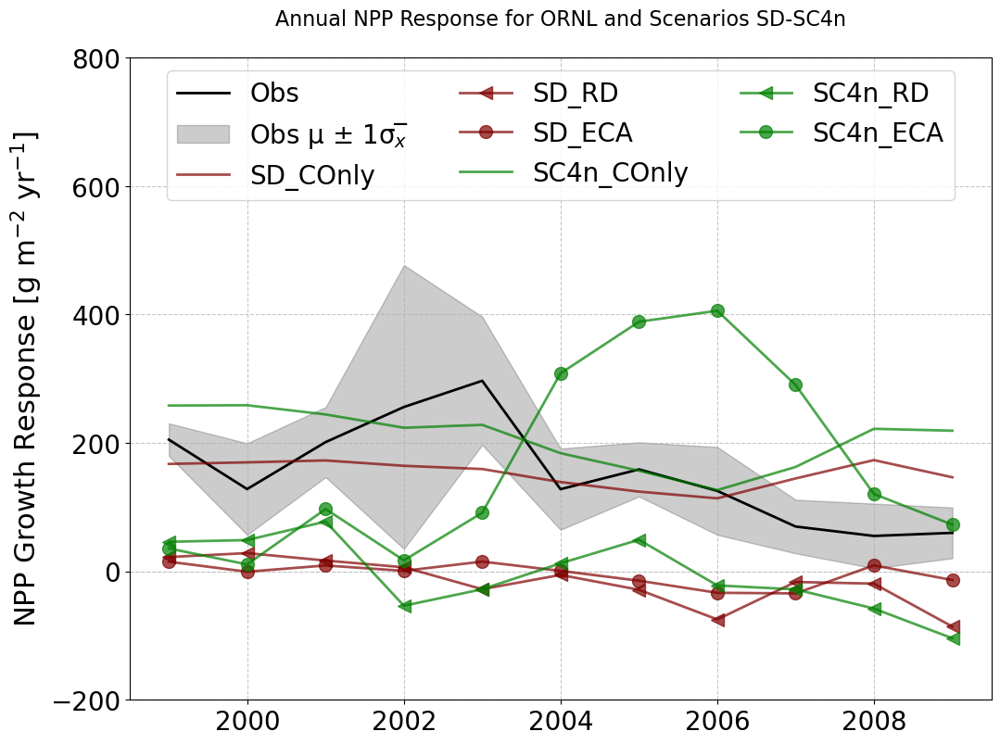

In [17]:
var_index = 0

# NPP Response for ORNL
select_site = "US-ORN"
site = "ORNL"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1998-01-01", "2008-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)

                        Mean_DF = (
                            Mean_DF1[["YEAR", "NPP", "NUP"]]
                            - Mean_DF0[["YEAR", "NPP", "NUP"]]
                        )
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                            (Standard_error_DF1[["YEAR", "NPP", "NUP"]]) ** 2
                            + (Standard_error_DF0[["YEAR", "NPP", "NUP"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        # Getting Elevated data
                        mean_npp = Mean_DF1[f'{var_obs}']
                        se_npp = Standard_error_DF1[f'{var_obs}']
                        data_plot_E [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_E [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_E [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_E [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_NPP-FATES_EXCESS_RESP","NPP(GPPminusRA)"]:
                        tmp_var_a = (
                            (ds[key]["FATES_NPP"] - ds[key]["FATES_EXCESS_RESP"])
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (
                            (
                                ds[key_eCO2]["FATES_NPP"]
                                - ds[key_eCO2]["FATES_EXCESS_RESP"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"NPP (GPP${-}$RA)"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                        data_plot_E [site][var][f"{case_plot}_{sim_case}"] = tmp_var_e.groupby("time.year").mean().values[:,0]
                    if var in ["NPP_alloc", "NPP_Growth"]:
                        tmp_var_a = (
                            (
                                ds[key]["FATES_CROOT_ALLOC"]
                                + ds[key]["FATES_FROOT_ALLOC"]
                                + ds[key]["FATES_LEAF_ALLOC"]
                                + ds[key]["FATES_SEED_ALLOC"]
                                + ds[key]["FATES_STEM_ALLOC"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (
                            (
                                ds[key_eCO2]["FATES_CROOT_ALLOC"]
                                + ds[key_eCO2]["FATES_FROOT_ALLOC"]
                                + ds[key_eCO2]["FATES_LEAF_ALLOC"]
                                + ds[key_eCO2]["FATES_SEED_ALLOC"]
                                + ds[key_eCO2]["FATES_STEM_ALLOC"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            # label=tmp_case
                            # .split("_")[-1]
                            # .replace("aCO2", "Response")
                            # + "_"
                            # + var,
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = "NPP Growth"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                        data_plot_E [site][var][f"{case_plot}_{sim_case}"] = tmp_var_e.groupby("time.year").mean().values[:,0]
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


### DUKE

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/296145529.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/296145529.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/296145529.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/296145529.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/296145529.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.

Text(0.5, 1.0, 'Annual NPP Response for DUKE and Scenarios SD-SC4n\n')

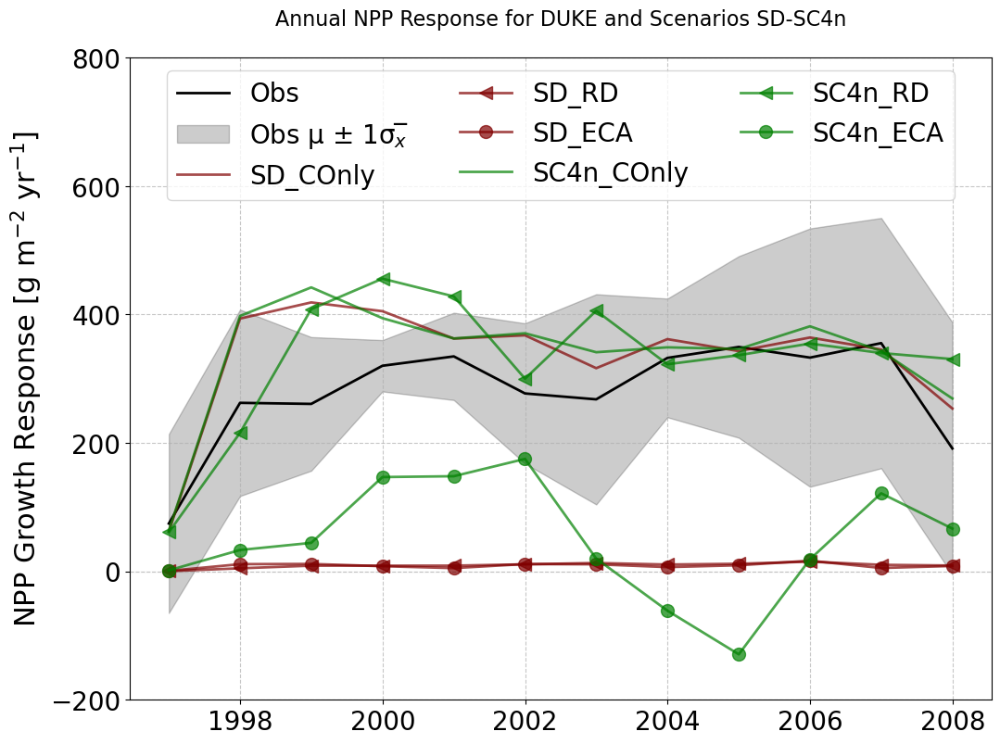

In [18]:
var_index = 0

# NPP Response for ORNL
select_site = "US-DUK"
site = "DUKE"
li = 0  # for legend index
fig1dr = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                    "1996-01-01", "2007-12-31", freq="A"
                    )  # Yearly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)

                        Mean_DF = (
                            Mean_DF1[["YEAR", "NPP", "NUP"]]
                            - Mean_DF0[["YEAR", "NPP", "NUP"]]
                        )
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                            (Standard_error_DF1[["YEAR", "NPP", "NUP"]]) ** 2
                            + (Standard_error_DF0[["YEAR", "NPP", "NUP"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        # Getting Elevated data
                        mean_npp = Mean_DF1[f'{var_obs}']
                        se_npp = Standard_error_DF1[f'{var_obs}']
                        data_plot_E [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_E [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_E [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_E [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_NPP-FATES_EXCESS_RESP","NPP(GPPminusRA)"]:
                        tmp_var_a = (
                            (ds[key]["FATES_NPP"] - ds[key]["FATES_EXCESS_RESP"])
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (
                            (
                                ds[key_eCO2]["FATES_NPP"]
                                - ds[key_eCO2]["FATES_EXCESS_RESP"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"NPP (GPP${-}$RA)"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                        data_plot_E [site][var][f"{case_plot}_{sim_case}"] = tmp_var_e.groupby("time.year").mean().values[:,0]
                    if var in ["NPP_alloc", "NPP_Growth"]:
                        tmp_var_a = (
                            (
                                ds[key]["FATES_CROOT_ALLOC"]
                                + ds[key]["FATES_FROOT_ALLOC"]
                                + ds[key]["FATES_LEAF_ALLOC"]
                                + ds[key]["FATES_SEED_ALLOC"]
                                + ds[key]["FATES_STEM_ALLOC"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (
                            (
                                ds[key_eCO2]["FATES_CROOT_ALLOC"]
                                + ds[key_eCO2]["FATES_FROOT_ALLOC"]
                                + ds[key_eCO2]["FATES_LEAF_ALLOC"]
                                + ds[key_eCO2]["FATES_SEED_ALLOC"]
                                + ds[key_eCO2]["FATES_STEM_ALLOC"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            # label=tmp_case
                            # .split("_")[-1]
                            # .replace("aCO2", "Response")
                            # + "_"
                            # + var,
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = "NPP Growth"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                        data_plot_E [site][var][f"{case_plot}_{sim_case}"] = tmp_var_e.groupby("time.year").mean().values[:,0]
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


### Combined plot

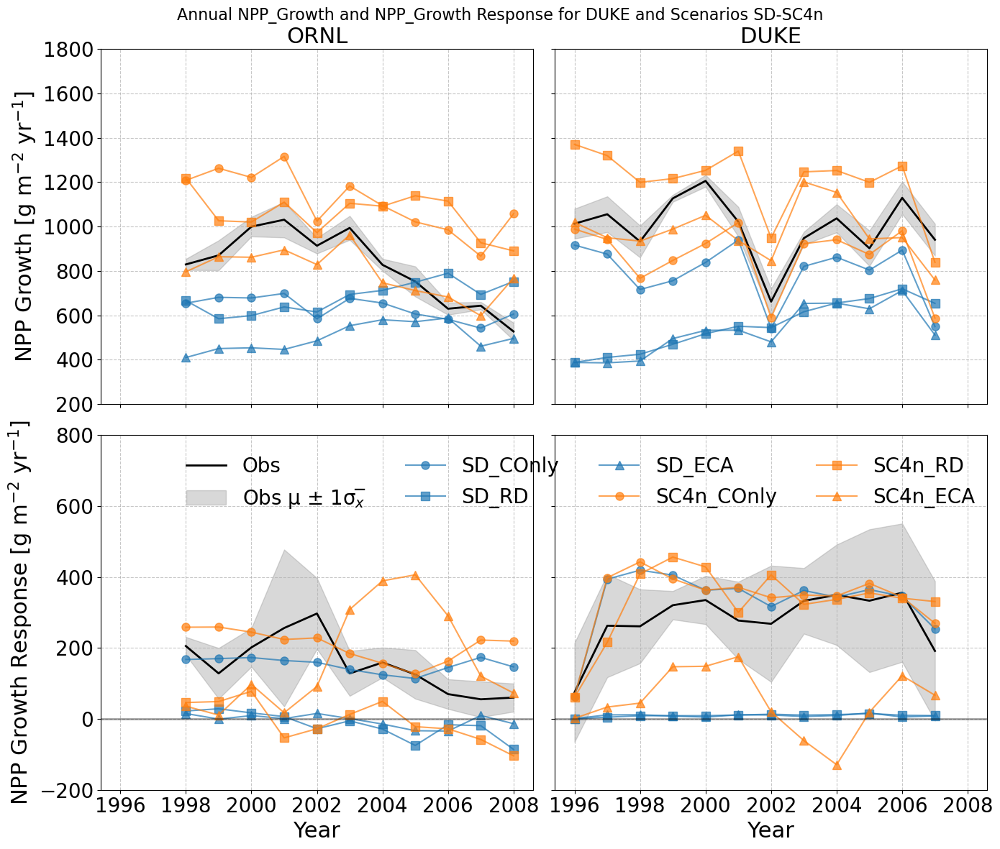

In [19]:
# Plot configuration
# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "NPP"
var_model = "NPP_Growth"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

PlotData_A [f'{site}'][f'{var_obs}'] = {}
PlotData_E [f'{site}'][f'{var_obs}'] = {}
PlotData_A [f'{site}'][f'{var_obs}']['time'] = data_plot_A[site][var_obs]['time']
PlotData_E [f'{site}'][f'{var_obs}']['time'] = data_plot_E[site][var_obs]['time']
PlotData_A [f'{site}'][f'{var_obs}']['Obs']  = data_plot_A[site][var_obs]['Obs']
PlotData_E [f'{site}'][f'{var_obs}']['Obs']  = data_plot_E[site][var_obs]['Obs']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_A[site][var_obs]['npp_1sd_lower']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_E[site][var_obs]['npp_1sd_lower']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_A[site][var_obs]['npp_1sd_upper']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_E[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_A [f'{site}'][f'{var_model}'] = {}
PlotData_E [f'{site}'][f'{var_model}'] = {}


# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    # for revised plots
    
    PlotData_A [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    
    ax[0,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)

# Just for Dict for Elevated
# Plot all ORNL models
for model_key, values in data_plot_E[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    # for revised plots

    PlotData_E [f'{site}'][f'{var_model}'][f'{model_key}'] = values


# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

PlotData_A [f'{site}'][f'{var_obs}'] = {}
PlotData_E [f'{site}'][f'{var_obs}'] = {}
PlotData_A [f'{site}'][f'{var_obs}']['time'] = data_plot_A[site][var_obs]['time']
PlotData_E [f'{site}'][f'{var_obs}']['time'] = data_plot_E[site][var_obs]['time']
PlotData_A [f'{site}'][f'{var_obs}']['Obs'] = data_plot_A[site][var_obs]['Obs']
PlotData_E [f'{site}'][f'{var_obs}']['Obs'] = data_plot_E[site][var_obs]['Obs']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_A[site][var_obs]['npp_1sd_lower']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_E[site][var_obs]['npp_1sd_lower']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_A[site][var_obs]['npp_1sd_upper']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_E[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_A [f'{site}'][f'{var_model}'] = {}
PlotData_E [f'{site}'][f'{var_model}'] = {}


for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]

    PlotData_A [f'{site}'][f'{var_model}'][f'{model_key}'] = values
        
    ax[0,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# Just for Dict for Elevated
# Plot all ORNL models
for model_key, values in data_plot_E[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    # for revised plots
    PlotData_E [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]
ax[1,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

#response
PlotData_R [f'{site}'][f'{var_obs}'] = {}
PlotData_R [f'{site}'][f'{var_obs}']['time'] = data_plot_R[site][var_obs]['time']
PlotData_R [f'{site}'][f'{var_obs}']['Obs']  = data_plot_R[site][var_obs]['Obs']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_R[site][var_obs]['npp_1sd_lower']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_R[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_R [f'{site}'][f'{var_model}'] = {}

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    PlotData_R [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    ax[1,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]

#response
PlotData_R [f'{site}'][f'{var_obs}'] = {}
PlotData_R [f'{site}'][f'{var_obs}']['time'] = data_plot_R[site][var_obs]['time']
PlotData_R [f'{site}'][f'{var_obs}']['Obs']  = data_plot_R[site][var_obs]['Obs']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_R[site][var_obs]['npp_1sd_lower']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_R[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_R [f'{site}'][f'{var_model}'] = {}

ax[1,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    PlotData_R [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    ax[1,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels
    
ax[0,0].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.58, .48),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)

plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)


## 2. FATES_NPP-FATES_EXCESS_RESPor NPP(GPPminusRA) or NPP(GPP-RA)

#### Change below

In [20]:
var_obs= "NPP"
var_names = ("NPP(GPPminusRA)",
             #"NPP_Growth",
            #"NPP(GPPminusRA)",
            #"FATES_NPP",
        #"FATES_NPP-FATES_EXCESS_RESP",
       )


#ylim_variable = (0,2200)
#ylim_response = (-200,700)

# plot obs? 
obs_plot = 1 # 0,1

sim_markers = ["","<","o",">","<","^"]
case_lines = ["-","-","-","-","-","_"]
case_colors = ["maroon", "green", "blue"]

#combined plot
tmp_markersize=8
tmp_alpha = 0.7

ylim_variable = (200,1800)
ylim_response = (-200,800)


data_plot_A = {}
data_plot_A ["ORNL"] = {}
data_plot_A ["DUKE"] = {}
data_plot_A ["ORNL"][var_obs] = {}
data_plot_A ["DUKE"][var_obs] = {}
data_plot_A ["ORNL"][var_names[0]] = {}
data_plot_A ["DUKE"][var_names[0]] = {}

data_plot_R = {}
data_plot_R ["ORNL"] = {}
data_plot_R ["DUKE"] = {}
data_plot_R ["ORNL"][var_obs] = {}
data_plot_R ["DUKE"][var_obs] = {}
data_plot_R ["ORNL"][var_names[0]] = {}
data_plot_R ["DUKE"][var_names[0]] = {}

### ORNL

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2686118922.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2686118922.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2686118922.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2686118922.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2686118922.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' ins

Text(0.5, 1.0, 'Annual NPP Response for ORNL and Scenarios SD-SC4n\n')

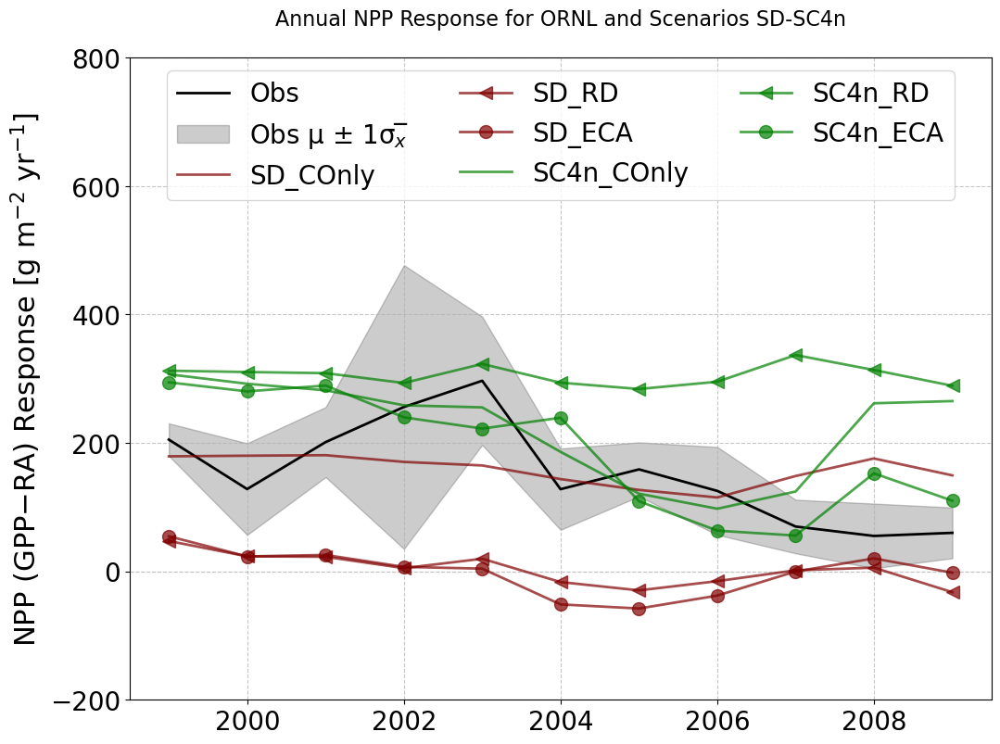

In [21]:
var_index = 0

# NPP Response for ORNL
select_site = "US-ORN"
site = "ORNL"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1998-01-01", "2008-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)

                        Mean_DF = (
                            Mean_DF1[["YEAR", "NPP", "NUP"]]
                            - Mean_DF0[["YEAR", "NPP", "NUP"]]
                        )
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                            (Standard_error_DF1[["YEAR", "NPP", "NUP"]]) ** 2
                            + (Standard_error_DF0[["YEAR", "NPP", "NUP"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_NPP-FATES_EXCESS_RESP","NPP(GPPminusRA)"]:
                        tmp_var_a = (
                            (ds[key]["FATES_NPP"] - ds[key]["FATES_EXCESS_RESP"])
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (
                            (
                                ds[key_eCO2]["FATES_NPP"]
                                - ds[key_eCO2]["FATES_EXCESS_RESP"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"NPP (GPP${-}$RA)"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    if var in ["NPP_alloc", "NPP_Growth"]:
                        tmp_var_a = (
                            (
                                ds[key]["FATES_CROOT_ALLOC"]
                                + ds[key]["FATES_FROOT_ALLOC"]
                                + ds[key]["FATES_LEAF_ALLOC"]
                                + ds[key]["FATES_SEED_ALLOC"]
                                + ds[key]["FATES_STEM_ALLOC"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (
                            (
                                ds[key_eCO2]["FATES_CROOT_ALLOC"]
                                + ds[key_eCO2]["FATES_FROOT_ALLOC"]
                                + ds[key_eCO2]["FATES_LEAF_ALLOC"]
                                + ds[key_eCO2]["FATES_SEED_ALLOC"]
                                + ds[key_eCO2]["FATES_STEM_ALLOC"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            # label=tmp_case
                            # .split("_")[-1]
                            # .replace("aCO2", "Response")
                            # + "_"
                            # + var,
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = "NPP Growth"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


### DUKE

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3561891198.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3561891198.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3561891198.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3561891198.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3561891198.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' ins

Text(0.5, 1.0, 'Annual NPP Response for DUKE and Scenarios SD-SC4n\n')

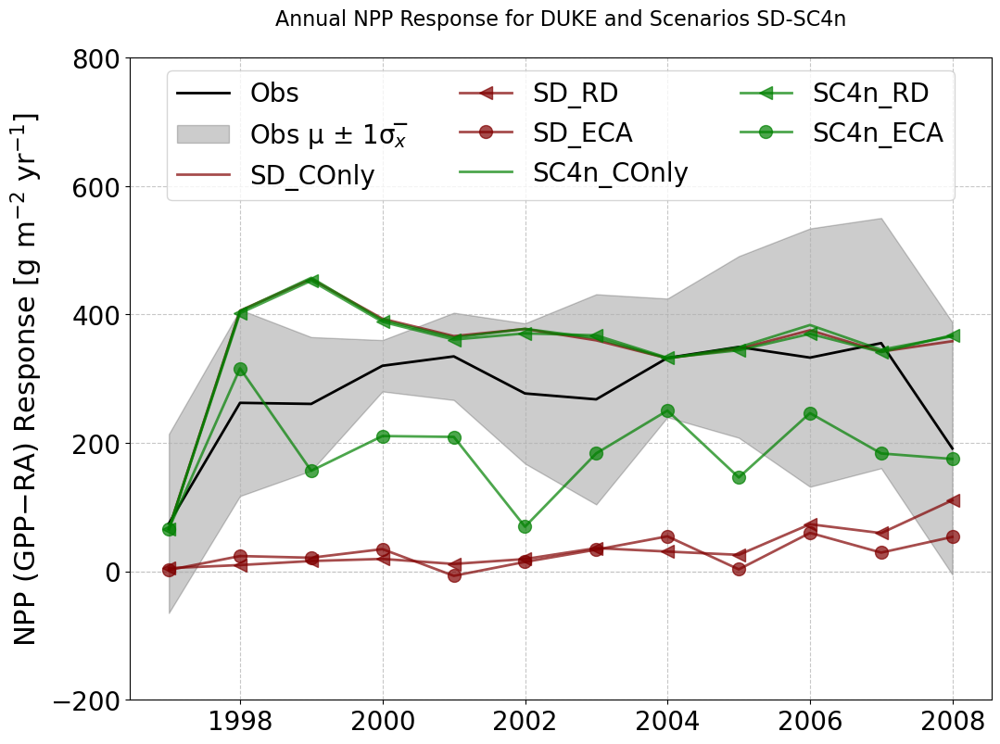

In [22]:
var_index = 0

# NPP Response for ORNL
select_site = "US-DUK"
site = "DUKE"
li = 0  # for legend index
fig1dr = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                    "1996-01-01", "2007-12-31", freq="A"
                    )  # Yearly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)

                        Mean_DF = (
                            Mean_DF1[["YEAR", "NPP", "NUP"]]
                            - Mean_DF0[["YEAR", "NPP", "NUP"]]
                        )
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                            (Standard_error_DF1[["YEAR", "NPP", "NUP"]]) ** 2
                            + (Standard_error_DF0[["YEAR", "NPP", "NUP"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_NPP-FATES_EXCESS_RESP","NPP(GPPminusRA)"]:
                        tmp_var_a = (
                            (ds[key]["FATES_NPP"] - ds[key]["FATES_EXCESS_RESP"])
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (
                            (
                                ds[key_eCO2]["FATES_NPP"]
                                - ds[key_eCO2]["FATES_EXCESS_RESP"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"NPP (GPP${-}$RA)"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    if var in ["NPP_alloc", "NPP_Growth"]:
                        tmp_var_a = (
                            (
                                ds[key]["FATES_CROOT_ALLOC"]
                                + ds[key]["FATES_FROOT_ALLOC"]
                                + ds[key]["FATES_LEAF_ALLOC"]
                                + ds[key]["FATES_SEED_ALLOC"]
                                + ds[key]["FATES_STEM_ALLOC"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (
                            (
                                ds[key_eCO2]["FATES_CROOT_ALLOC"]
                                + ds[key_eCO2]["FATES_FROOT_ALLOC"]
                                + ds[key_eCO2]["FATES_LEAF_ALLOC"]
                                + ds[key_eCO2]["FATES_SEED_ALLOC"]
                                + ds[key_eCO2]["FATES_STEM_ALLOC"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            # label=tmp_case
                            # .split("_")[-1]
                            # .replace("aCO2", "Response")
                            # + "_"
                            # + var,
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = "NPP Growth"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


### Combined plot

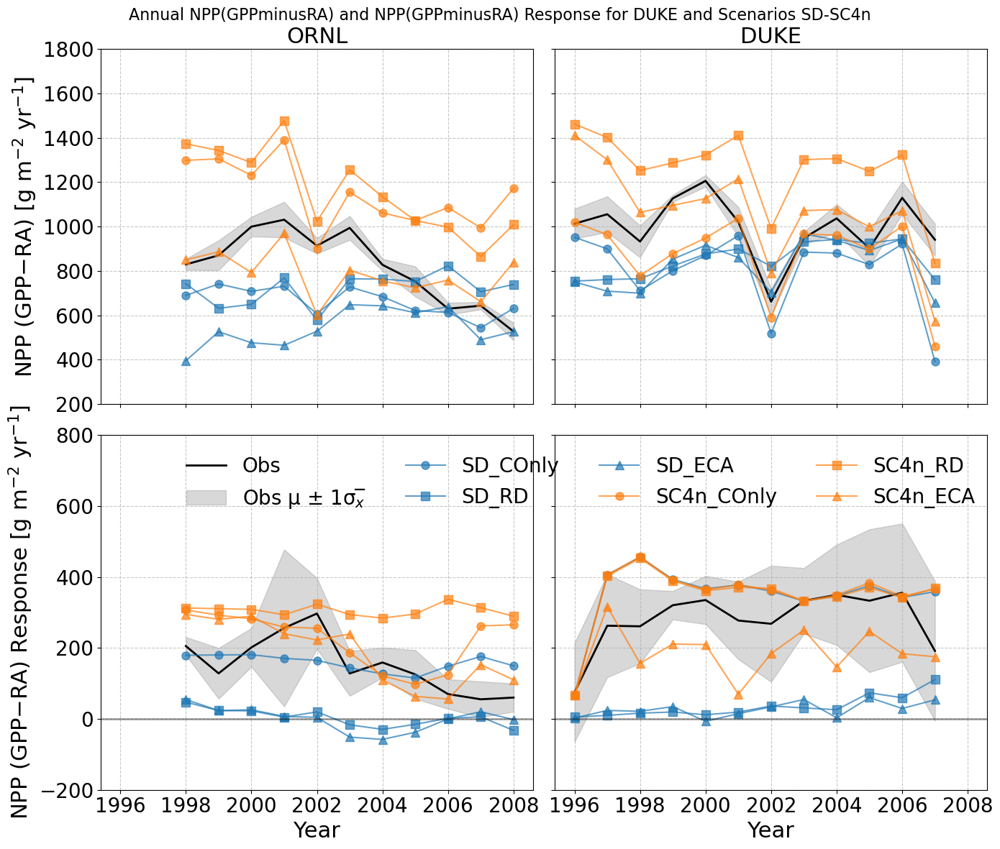

In [23]:

# Plot configuration
 
 

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "NPP"
var_model = "NPP(GPPminusRA)"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[0,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[0,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]
ax[1,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[1,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[1,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

#ax[0,0].get_shared_y_axes().remove(ax[1,0])
#ax[0,1].get_shared_y_axes().remove(ax[1,1])


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.58, .48),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

In [24]:
var

'NPP(GPPminusRA)'

## 3. NUP

#### Change below

Note: Need to keep the model name different from OBS

In [25]:
var_obs= "NUP"
# Need to keep the model name different from OBS
var_names = ("NUP_model",
             #"NPP_Growth",
       )

ylim_variable = (0,20)
ylim_response = (-2,7)

# plot obs? 
obs_plot = 1 # 0,1

sim_cases_N = sim_cases[1:]
sim_markers = ["","<","o",">","<","^"] [1:]
case_lines = ["-","-","-","-","-","_"] 
case_colors = ["maroon", "green", "blue"]

#combined plot
tmp_markersize=8
tmp_alpha = 0.7

data_plot_A = {}
data_plot_A ["ORNL"] = {}
data_plot_A ["DUKE"] = {}
data_plot_A ["ORNL"][var_obs] = {}
data_plot_A ["DUKE"][var_obs] = {}
data_plot_A ["ORNL"][var_names[0]] = {}
data_plot_A ["DUKE"][var_names[0]] = {}

data_plot_E = {}
data_plot_E ["ORNL"] = {}
data_plot_E ["DUKE"] = {}
data_plot_E ["ORNL"][var_obs] = {}
data_plot_E ["DUKE"][var_obs] = {}
data_plot_E ["ORNL"][var_names[0]] = {}
data_plot_E ["DUKE"][var_names[0]] = {}

data_plot_R = {}
data_plot_R ["ORNL"] = {}
data_plot_R ["DUKE"] = {}
data_plot_R ["ORNL"][var_obs] = {}
data_plot_R ["DUKE"][var_obs] = {}
data_plot_R ["ORNL"][var_names[0]] = {}
data_plot_R ["DUKE"][var_names[0]] = {}

#### ORNL

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3672448323.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3672448323.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3672448323.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3672448323.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3672448323.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' ins

Text(0.5, 1.0, 'Annual NUP Response for ORNL and Scenarios SD-SC4n\n')

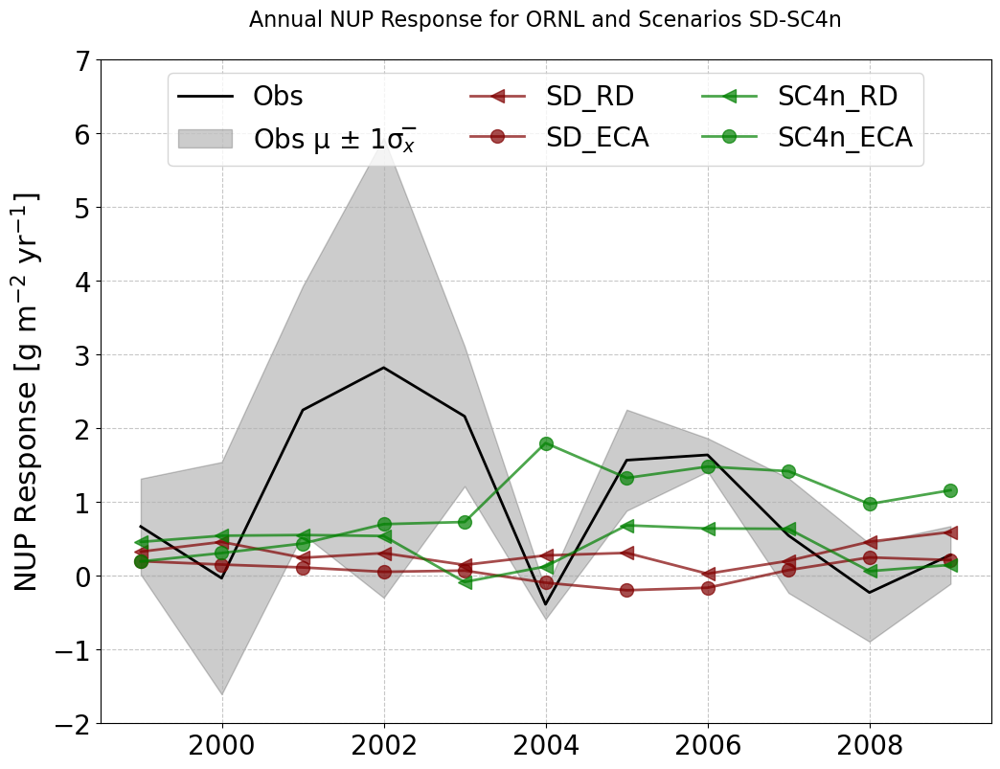

In [26]:
var_index = 0

# NPP Response for ORNL
select_site = "US-ORN"
site = "ORNL"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases_N):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1998-01-01", "2008-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)

                        Mean_DF = (
                            Mean_DF1[["YEAR", "NPP", "NUP"]]
                            - Mean_DF0[["YEAR", "NPP", "NUP"]]
                        )
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                            (Standard_error_DF1[["YEAR", "NPP", "NUP"]]) ** 2
                            + (Standard_error_DF0[["YEAR", "NPP", "NUP"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )

                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        # Getting Elevated data
                        mean_npp = Mean_DF1[f'{var_obs}']
                        se_npp = Standard_error_DF1[f'{var_obs}']
                        data_plot_E [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_E [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_E [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_E [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["NUP","NUP_model"]:
                        tmp_var_a = (
                            (
                                ds[key]["FATES_NH4UPTAKE"]
                                + ds[key]["FATES_NO3UPTAKE"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (
                            (
                                ds[key_eCO2]["FATES_NH4UPTAKE"]
                                + ds[key_eCO2]["FATES_NO3UPTAKE"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            # label=tmp_case
                            # .split("_")[-1]
                            # .replace("aCO2", "Response")
                            # + "_"
                            # + var,
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = "NUP"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                        data_plot_E [site][var][f"{case_plot}_{sim_case}"] = tmp_var_e.groupby("time.year").mean().values[:,0]
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NUP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


#### DUKE

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2502026202.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2502026202.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2502026202.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2502026202.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2502026202.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' ins

Text(0.5, 1.0, 'Annual NUP Response for DUKE and Scenarios SD-SC4n\n')

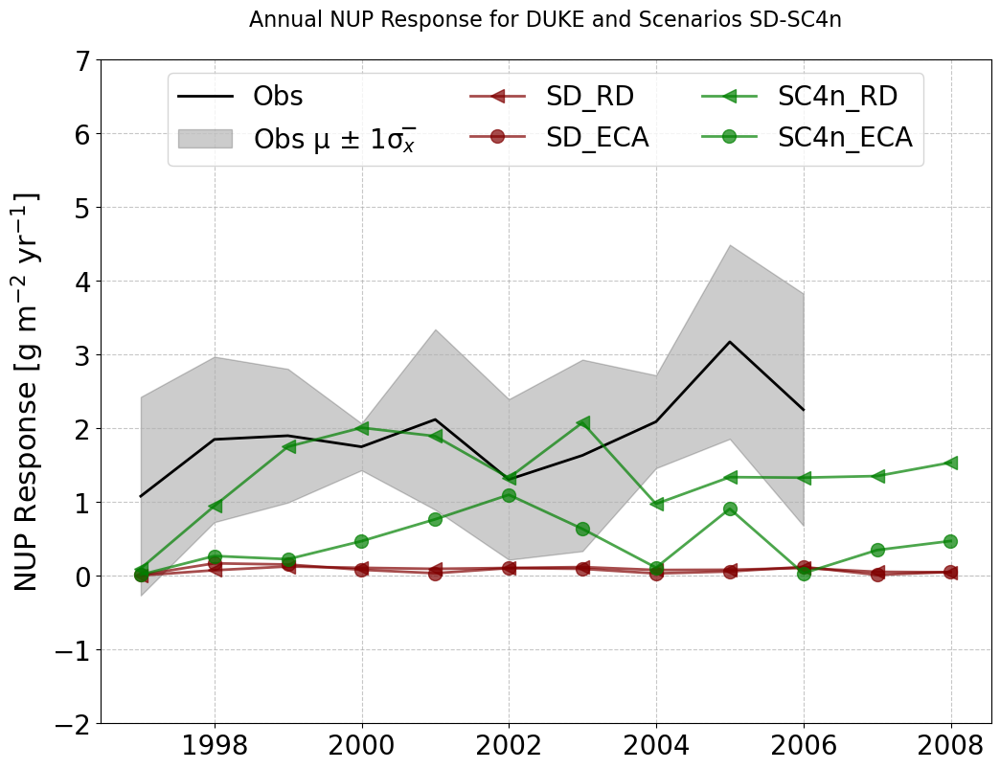

In [27]:
var_index = 0

# NPP Response for ORNL
select_site = "US-DUK"
site = "DUKE"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases_N):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1996-01-01", "2007-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)

                        Mean_DF = (
                            Mean_DF1[["YEAR", "NPP", "NUP"]]
                            - Mean_DF0[["YEAR", "NPP", "NUP"]]
                        )
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                            (Standard_error_DF1[["YEAR", "NPP", "NUP"]]) ** 2
                            + (Standard_error_DF0[["YEAR", "NPP", "NUP"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )

                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        # Getting Elevated data
                        mean_npp = Mean_DF1[f'{var_obs}']
                        se_npp = Standard_error_DF1[f'{var_obs}']
                        data_plot_E [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_E [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_E [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_E [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["NUP","NUP_model"]:
                        tmp_var_a = (
                            (
                                ds[key]["FATES_NH4UPTAKE"]
                                + ds[key]["FATES_NO3UPTAKE"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (
                            (
                                ds[key_eCO2]["FATES_NH4UPTAKE"]
                                + ds[key_eCO2]["FATES_NO3UPTAKE"]
                            )
                            * 24
                            * 3600
                            * 365
                            * 1000
                        )
                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            # label=tmp_case
                            # .split("_")[-1]
                            # .replace("aCO2", "Response")
                            # + "_"
                            # + var,
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = "NUP"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                        data_plot_E [site][var][f"{case_plot}_{sim_case}"] = tmp_var_e.groupby("time.year").mean().values[:,0]
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NUP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


### Combined plot

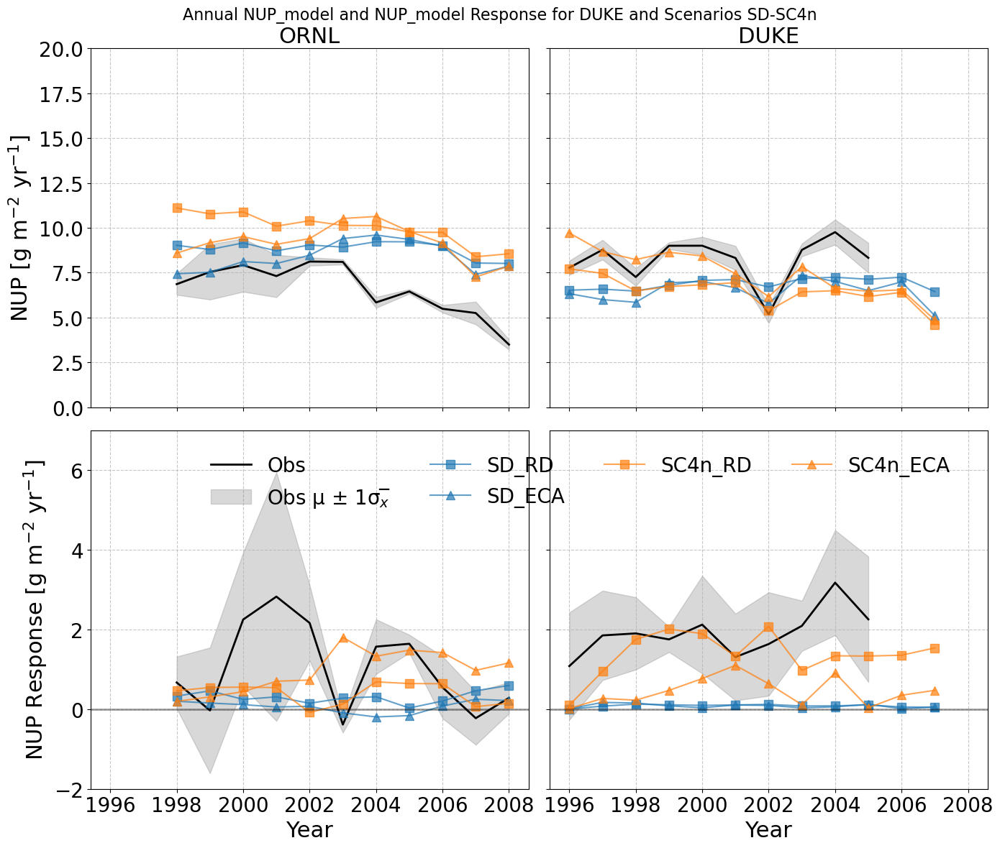

In [28]:

# Plot configuration
 
 

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "NUP"
var_model = "NUP_model"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

PlotData_A [f'{site}'][f'{var_obs}'] = {}
PlotData_E [f'{site}'][f'{var_obs}'] = {}
PlotData_A [f'{site}'][f'{var_obs}']['time'] = data_plot_A[site][var_obs]['time']
PlotData_E [f'{site}'][f'{var_obs}']['time'] = data_plot_E[site][var_obs]['time']
PlotData_A [f'{site}'][f'{var_obs}']['Obs'] = data_plot_A[site][var_obs]['Obs']
PlotData_E [f'{site}'][f'{var_obs}']['Obs'] = data_plot_E[site][var_obs]['Obs']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_A[site][var_obs]['npp_1sd_lower']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_E[site][var_obs]['npp_1sd_lower']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_A[site][var_obs]['npp_1sd_upper']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_E[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_A [f'{site}'][f'{var_model}'] = {}
PlotData_E [f'{site}'][f'{var_model}'] = {}

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Fix for NUP because the obs and model var names are same
    if model_key in ["time", "Obs"]:
        continue
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    PlotData_A [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    ax[0,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)

# Just for Dict for Elevated
# Plot all ORNL models
for model_key, values in data_plot_E[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    # for revised plots

    PlotData_E [f'{site}'][f'{var_model}'][f'{model_key}'] = values


# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

PlotData_A [f'{site}'][f'{var_obs}'] = {}
PlotData_E [f'{site}'][f'{var_obs}'] = {}
PlotData_A [f'{site}'][f'{var_obs}']['time'] = data_plot_A[site][var_obs]['time']
PlotData_E [f'{site}'][f'{var_obs}']['time'] = data_plot_E[site][var_obs]['time']
PlotData_A [f'{site}'][f'{var_obs}']['Obs'] = data_plot_A[site][var_obs]['Obs']
PlotData_E [f'{site}'][f'{var_obs}']['Obs'] = data_plot_E[site][var_obs]['Obs']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_A[site][var_obs]['npp_1sd_lower']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_E[site][var_obs]['npp_1sd_lower']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_A[site][var_obs]['npp_1sd_upper']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_E[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_A [f'{site}'][f'{var_model}'] = {}
PlotData_E [f'{site}'][f'{var_model}'] = {}

for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]

    PlotData_A [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    
    ax[0,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# Just for Dict for Elevated
# Plot all ORNL models
for model_key, values in data_plot_E[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    # for revised plots

    PlotData_E [f'{site}'][f'{var_model}'][f'{model_key}'] = values

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]

#response
PlotData_R [f'{site}'][f'{var_obs}'] = {}
PlotData_R [f'{site}'][f'{var_obs}']['time'] = data_plot_R[site][var_obs]['time']
PlotData_R [f'{site}'][f'{var_obs}']['Obs']  = data_plot_R[site][var_obs]['Obs']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_R[site][var_obs]['npp_1sd_lower']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_R[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_R [f'{site}'][f'{var_model}'] = {}

ax[1,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]

    PlotData_R [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    
    ax[1,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"
# Check if Duke has data
duke = data_plot_R[site][var_obs]

#response
PlotData_R [f'{site}'][f'{var_obs}'] = {}
PlotData_R [f'{site}'][f'{var_obs}']['time'] = data_plot_R[site][var_obs]['time']
PlotData_R [f'{site}'][f'{var_obs}']['Obs']  = data_plot_R[site][var_obs]['Obs']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_R[site][var_obs]['npp_1sd_lower']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_R[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_R [f'{site}'][f'{var_model}'] = {}

ax[1,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]

    PlotData_R [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    
    ax[1,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

#ax[0,0].get_shared_y_axes().remove(ax[1,0])
#ax[0,1].get_shared_y_axes().remove(ax[1,1])


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.58, .48),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

## 4. TLAI

### Reading LAI obs files

In [29]:
#reading the mean and standard deviation from the OBS CSV data

path_obs_data = "/Users/ud4/Documents/FACEMDS/L2FR_Calc"

# Mean annual files
filename_ORNL_ax  = f"{path_obs_data}/data/ORNL_ax.csv"
filename_DUKE_ax  = f"{path_obs_data}/data/DUKE_ax.csv"
filename_ORNL_ase  = f"{path_obs_data}/data/ORNL_ase.csv"
filename_DUKE_ase  = f"{path_obs_data}/data/DUKE_ase.csv"


df_ORNL_ax = pd.read_csv(filename_ORNL_ax)
df_DUKE_ax = pd.read_csv(filename_DUKE_ax)
df_ORNL_ase = pd.read_csv(filename_ORNL_ase)
df_DUKE_ase = pd.read_csv(filename_DUKE_ase)


# Peak LAI in column name is 'ptrait_lai_peak'
obs_col_name = 'ptrait_lai_peak'
df_ORNL_lai_ax = df_ORNL_ax[['year','co2',f'{obs_col_name}']].copy()
df_DUKE_lai_ax = df_DUKE_ax[['year','co2',f'{obs_col_name}']].copy()
df_ORNL_lai_ax['site'] = "ORNL"
df_DUKE_lai_ax['site'] = "DUKE"
df_ORNL_lai_ase = df_ORNL_ase[['year','co2',f'{obs_col_name}']].copy()
df_DUKE_lai_ase = df_DUKE_ase[['year','co2',f'{obs_col_name}']].copy()
df_ORNL_lai_ase ['site'] = "ORNL"
df_DUKE_lai_ase ['site'] = "DUKE"

var_name_obs = "Peak_LAI"
obs_var_units = "m2 m-2"

df_obs_ax = pd.concat([df_ORNL_lai_ax, df_DUKE_lai_ax], ignore_index=True)
df_obs_ax.rename(columns={"ptrait_lai_peak": "Peak_LAI"}, inplace=True)
df_obs_ax.rename(columns={"year": "YEAR"}, inplace=True)

df_obs_ase = pd.concat([df_ORNL_lai_ase, df_DUKE_lai_ase], ignore_index=True)
df_obs_ase.rename(columns={"ptrait_lai_peak": "Peak_LAI"}, inplace=True)
df_obs_ase.rename(columns={"year": "YEAR"}, inplace=True)

In [30]:
# Filter the dataset to keep only rows where site is 'ORNL' or 'DUKE'
df_obs_ax_site = df_obs_ax[df_obs_ax['site'].isin(['ORNL', 'DUKE'])]
df_obs_ase_site = df_obs_ase[df_obs_ase['site'].isin(['ORNL', 'DUKE'])]

filter_co2 = df_obs_ase_site["co2"] == "AMB"
filter_site = df_obs_ase_site["site"] == "ORNL"
df_obs_ase_site[filter_co2][filter_site]

# arrange data into dict!
dict_obs_ax = {}
sites_o= ("ORNL", "DUKE" )
#sites_o= ( "ORNL", )

CO2_cases  = ("AMB", "ELE" )
dict_obs_ax = {}
dict_obs_ase = {} # standard error
dict_obs_aserel = {} #rel standard error = Val SE/Var
for site in sites_o:
    dict_obs_ax    [site] = {}
    dict_obs_ase   [site] = {}
    dict_obs_aserel [site] = {}
    for co2_case in CO2_cases:
        # selected values from mean
        filter_co2 = df_obs_ax_site["co2"] == co2_case
        filter_site = df_obs_ax_site["site"] == site
        dict_obs_ax[site][co2_case] = df_obs_ax_site[filter_co2][filter_site]
        # selected values from standard error
        filter_co2 = df_obs_ase_site["co2"] == co2_case
        filter_site = df_obs_ase_site["site"] == site
        dict_obs_ase[site][co2_case] = df_obs_ase_site[filter_co2][filter_site]
        dict_obs_aserel[site][co2_case] = df_obs_ase_site[filter_co2][filter_site].copy()
        dict_obs_aserel[site][co2_case][f"{var_name_obs}"] = df_obs_ase_site[filter_co2][filter_site][f"{var_name_obs}"]/(
            df_obs_ax_site[filter_co2][filter_site][f"{var_name_obs}"])

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_obs_ase_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_ax[site][co2_case] = df_obs_ax_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:30: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_ase[site][co2_case] = df_obs_ase_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_aserel[site][co2_case] = df_obs_ase_site[filter_co2][filter_site].copy()
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:32: UserWarni

#### Change below

In [31]:
var_obs= "Peak_LAI"
var_name_obs = "Peak_LAI"

var_names = ("TLAI",
    #"NPP(GPPminusRA)",
        #"FATES_NPP",
        #"FATES_NPP-FATES_EXCESS_RESP",
       )



ylim_variable = (0,9)
ylim_response = (-1.5,2.5)

# plot obs? 
obs_plot = 1 # 0,1

sim_markers = ["","<","o",">","<","^"]
case_lines = ["-","-","-","-","-","_"]
case_colors = ["maroon", "green", "blue"]

#combined plot
tmp_markersize=8
tmp_alpha = 0.7


data_plot_A = {}
data_plot_A ["ORNL"] = {}
data_plot_A ["DUKE"] = {}
data_plot_A ["ORNL"][var_obs] = {}
data_plot_A ["DUKE"][var_obs] = {}
data_plot_A ["ORNL"][var_names[0]] = {}
data_plot_A ["DUKE"][var_names[0]] = {}

data_plot_R = {}
data_plot_R ["ORNL"] = {}
data_plot_R ["DUKE"] = {}
data_plot_R ["ORNL"][var_obs] = {}
data_plot_R ["DUKE"][var_obs] = {}
data_plot_R ["ORNL"][var_names[0]] = {}
data_plot_R ["DUKE"][var_names[0]] = {}

#### ORNL

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1834320196.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1834320196.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1834320196.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1834320196.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1834320196.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' ins

Text(0.5, 1.0, 'Annual NPP Response for ORNL and Scenarios SD-SC4n\n')

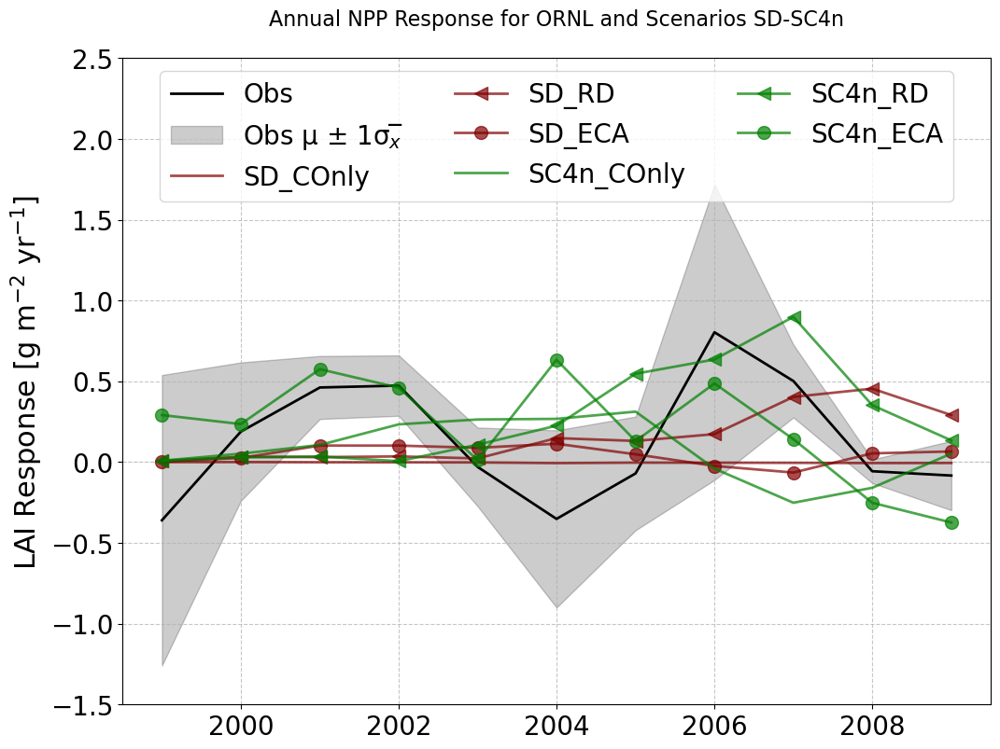

In [32]:
var_index = 0

# NPP Response for ORNL
select_site = "US-ORN"
site = "ORNL"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1998-01-01", "2008-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["TLAI"]:
                        tmp_var_a = ds[key]['TLAI'] 
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = ds[key_eCO2]['TLAI'] 

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"LAI"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


#### DUKE

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/599754716.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/599754716.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/599754716.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/599754716.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/599754716.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.

Text(0.5, 1.0, 'Annual NPP Response for DUKE and Scenarios SD-SC4n\n')

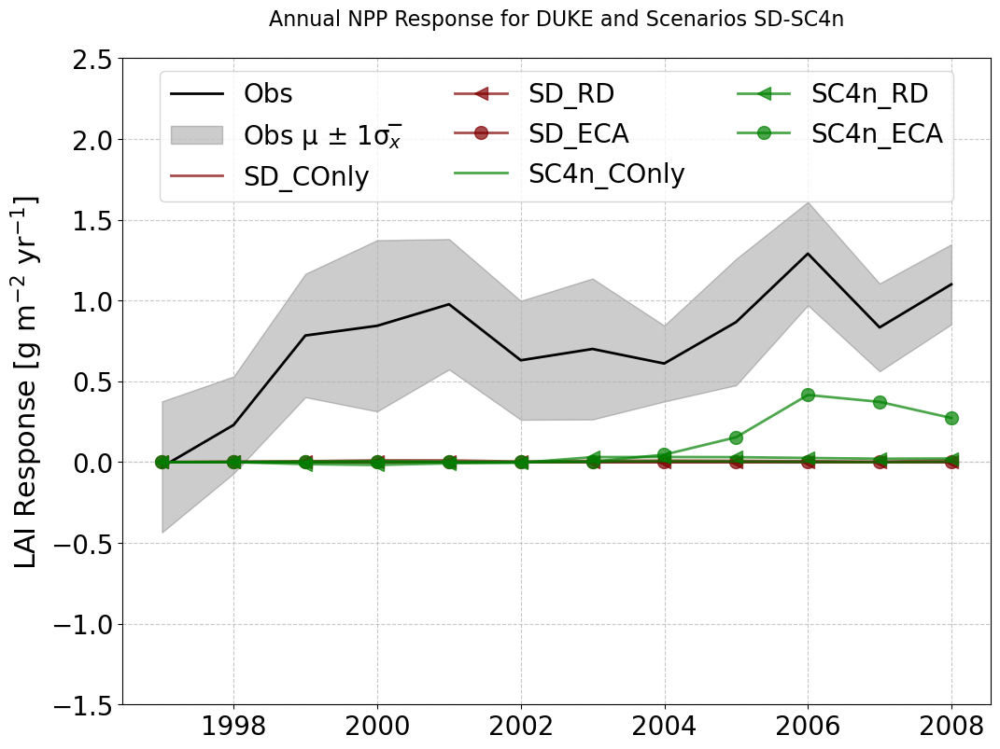

In [33]:
var_index = 0

# NPP Response for DUKE
select_site = "US-DUK"
site = "DUKE"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                         "1996-01-01", "2007-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["TLAI"]:
                        tmp_var_a = ds[key]['TLAI'] 
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = ds[key_eCO2]['TLAI'] 

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"LAI"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


### Combined plot

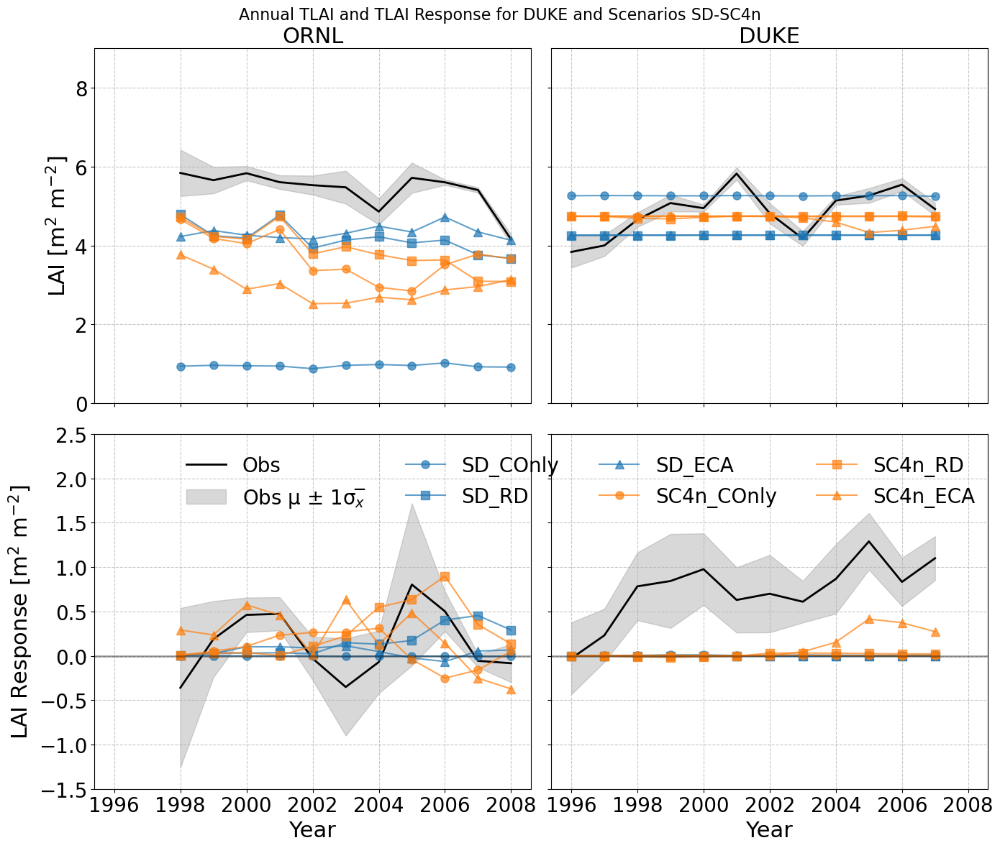

In [34]:

# Plot configuration
 
 

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "Peak_LAI"
var_model = "TLAI"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[0,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[0,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]
ax[1,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[1,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[1,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

#ax[0,0].get_shared_y_axes().remove(ax[1,0])
#ax[0,1].get_shared_y_axes().remove(ax[1,1])


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text} "+ r"[m$^{2}$ m$^{-2}$]", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response [m$^{2}$ m$^{-2}$]", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.58, .48),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

## 5. AGB

### Reading AGB obs files

In [121]:
# reading the mean and standard deviation from the OBS CSV data

path_obs_data = "/Users/ud4/Documents/FACEMDS/L2FR_Calc"

# Mean annual files
filename_ORNL_ax  = f"{path_obs_data}/data/ORNL_ax.csv"
filename_DUKE_ax  = f"{path_obs_data}/data/DUKE_ax.csv"
filename_ORNL_ase  = f"{path_obs_data}/data/ORNL_ase.csv"
filename_DUKE_ase  = f"{path_obs_data}/data/DUKE_ase.csv"


df_ORNL_ax = pd.read_csv(filename_ORNL_ax)
df_DUKE_ax = pd.read_csv(filename_DUKE_ax)
df_ORNL_ase = pd.read_csv(filename_ORNL_ase)
df_DUKE_ase = pd.read_csv(filename_DUKE_ase)

# Peak LAI in column name is 'ptrait_lai_peak'
obs_col_name = 'c_veg'

df_ORNL_cveg_ax = df_ORNL_ax[['year','co2','c_leaf','c_wood','c_croot','c_froot']].copy()
df_DUKE_cveg_ax = df_DUKE_ax[['year','co2','c_leaf','c_wood','c_froot']].copy()
df_ORNL_cveg_ax ["c_veg"] = df_ORNL_cveg_ax.filter(like="c_").sum(axis=1)
df_DUKE_cveg_ax ["c_veg"] = df_DUKE_cveg_ax.filter(like="c_").sum(axis=1)

df_ORNL_cveg_ax['site'] = "ORNL"
df_DUKE_cveg_ax['site'] = "DUKE"

df_ORNL_cveg_ase = df_ORNL_ase[['year','co2','c_leaf','c_wood','c_croot','c_froot']].copy()
df_DUKE_cveg_ase = df_DUKE_ase[['year','co2','c_leaf','c_wood','c_froot']].copy()

# because DUKE se has strs
cols_to_convert = ['c_leaf', 'c_wood', 'c_froot']
df_DUKE_cveg_ase[cols_to_convert] = df_DUKE_cveg_ase[cols_to_convert].apply(pd.to_numeric, errors='coerce')

# sum of standard error
df_ORNL_cveg_ase ["c_veg"] = np.sqrt(df_ORNL_cveg_ase.filter(like="c_").pow(2).sum(axis=1))
df_DUKE_cveg_ase ["c_veg"] = np.sqrt(df_DUKE_cveg_ase.filter(like="c_").pow(2).sum(axis=1))

df_ORNL_cveg_ase ['site'] = "ORNL"
df_DUKE_cveg_ase ['site'] = "DUKE"

var_name_obs = "c_veg"
obs_var_units = "g m-2"
df_obs_ax = pd.concat([df_ORNL_cveg_ax, df_DUKE_cveg_ax], ignore_index=True)
#df_obs_ax.rename(columns={"ptrait_cveg_peak": "Peak_cveg"}, inplace=True)
df_obs_ax.rename(columns={"year": "YEAR"}, inplace=True)
# Replace negative values with NaN
df_obs_ax[df_obs_ax.select_dtypes(include=[np.number]) < 0] = np.nan

df_obs_ase = pd.concat([df_ORNL_cveg_ase, df_DUKE_cveg_ase], ignore_index=True)
#df_obs_ase.rename(columns={"ptrait_cveg_peak": "Peak_cveg"}, inplace=True)
df_obs_ase.rename(columns={"year": "YEAR"}, inplace=True)


In [122]:
# Filter the dataset to keep only rows where site is 'ORNL' or 'DUKE'
df_obs_ax_site = df_obs_ax[df_obs_ax['site'].isin(['ORNL', 'DUKE'])]
df_obs_ase_site = df_obs_ase[df_obs_ase['site'].isin(['ORNL', 'DUKE'])]

filter_co2 = df_obs_ase_site["co2"] == "AMB"
filter_site = df_obs_ase_site["site"] == "ORNL"
df_obs_ase_site[filter_co2][filter_site]

# arrange data into dict!
dict_obs_ax = {}
sites_o= ("ORNL", "DUKE" )
#sites_o= ( "ORNL", )

CO2_cases  = ("AMB", "ELE" )
dict_obs_ax = {}
dict_obs_ase = {} # standard error
dict_obs_aserel = {} #rel standard error = Val SE/Var
for site in sites_o:
    dict_obs_ax    [site] = {}
    dict_obs_ase   [site] = {}
    dict_obs_aserel [site] = {}
    for co2_case in CO2_cases:
        # selected values from mean
        filter_co2 = df_obs_ax_site["co2"] == co2_case
        filter_site = df_obs_ax_site["site"] == site
        dict_obs_ax[site][co2_case] = df_obs_ax_site[filter_co2][filter_site]
        # selected values from standard error
        filter_co2 = df_obs_ase_site["co2"] == co2_case
        filter_site = df_obs_ase_site["site"] == site
        dict_obs_ase[site][co2_case] = df_obs_ase_site[filter_co2][filter_site]
        dict_obs_aserel[site][co2_case] = df_obs_ase_site[filter_co2][filter_site].copy()
        dict_obs_aserel[site][co2_case][f"{var_name_obs}"] = df_obs_ase_site[filter_co2][filter_site][f"{var_name_obs}"]/(
            df_obs_ax_site[filter_co2][filter_site][f"{var_name_obs}"])

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_obs_ase_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_ax[site][co2_case] = df_obs_ax_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:30: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_ase[site][co2_case] = df_obs_ase_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_aserel[site][co2_case] = df_obs_ase_site[filter_co2][filter_site].copy()
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:32: UserWarni

#### Change below

In [123]:
var_obs= "c_veg"
var_name_obs = "c_veg"

var_names = ("FATES_VEGC",
    #"NPP(GPPminusRA)",
        #"FATES_NPP",
        #"FATES_NPP-FATES_EXCESS_RESP",
       )



ylim_variable = (0,30000)
ylim_response = (-500,5000)

ylim_variable_DUKE = (0,32000)
ylim_variable_ORNL = (0,16000)
ylim_response_DUKE = (0,6000)
ylim_response_ORNL = (0,2000)

# plot obs? 
obs_plot = 1 # 0,1

sim_markers = ["","<","o",">","<","^"]
case_lines = ["-","-","-","-","-","_"]
case_colors = ["maroon", "green", "blue"]

#combined plot
tmp_markersize=8
tmp_alpha = 0.7


data_plot_A = {}
data_plot_A ["ORNL"] = {}
data_plot_A ["DUKE"] = {}
data_plot_A ["ORNL"][var_obs] = {}
data_plot_A ["DUKE"][var_obs] = {}
data_plot_A ["ORNL"][var_names[0]] = {}
data_plot_A ["DUKE"][var_names[0]] = {}

data_plot_R = {}
data_plot_R ["ORNL"] = {}
data_plot_R ["DUKE"] = {}
data_plot_R ["ORNL"][var_obs] = {}
data_plot_R ["DUKE"][var_obs] = {}
data_plot_R ["ORNL"][var_names[0]] = {}
data_plot_R ["DUKE"][var_names[0]] = {}

#### ORNL

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/484844035.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/484844035.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/484844035.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/484844035.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/484844035.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.

Text(0.5, 1.0, 'Annual NPP Response for ORNL and Scenarios SD-SC4n\n')

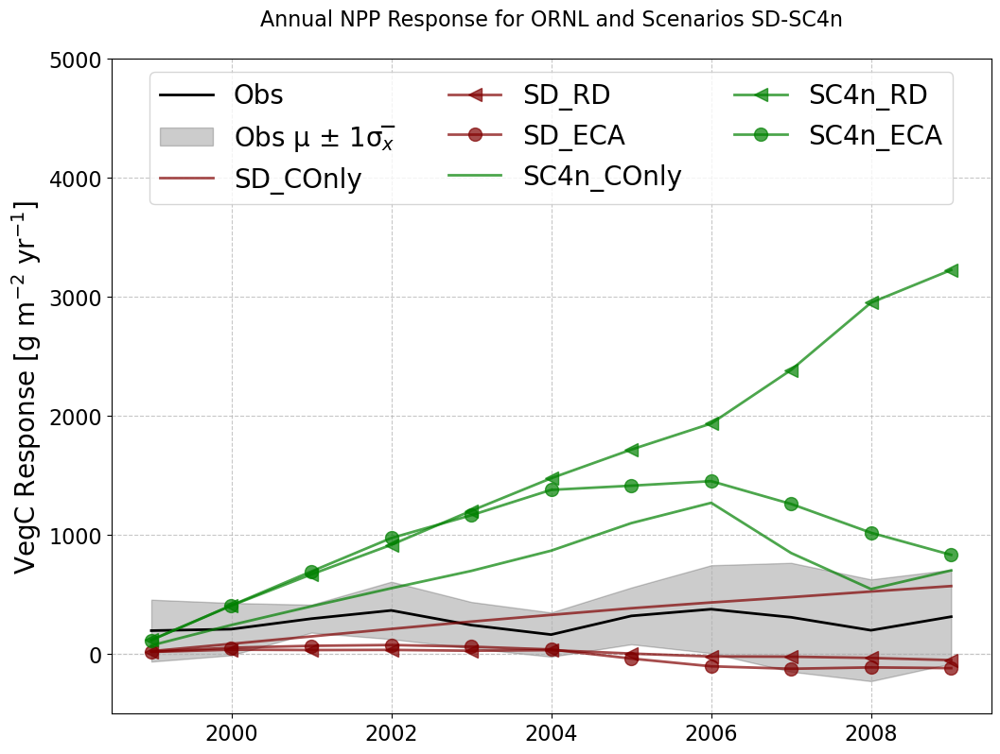

In [124]:
var_index = 0

# NPP Response for ORNL
select_site = "US-ORN"
site = "ORNL"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1998-01-01", "2008-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_VEGC"]:
                        tmp_var_a = ds[key]['FATES_VEGC'] *1000
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = ds[key_eCO2]['FATES_VEGC'] *1000

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"VegC"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


#### DUKE

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/839275941.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/839275941.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/839275941.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/839275941.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/839275941.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.

Text(0.5, 1.0, 'Annual NPP Response for DUKE and Scenarios SD-SC4n\n')

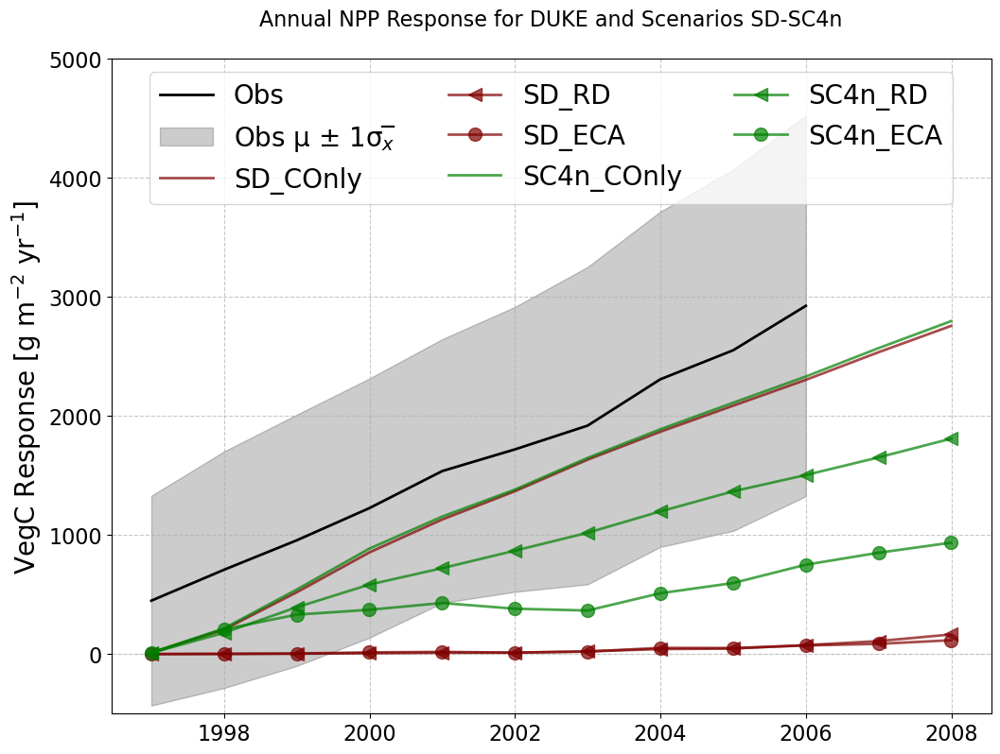

In [125]:
var_index = 0

# NPP Response for ORNL
select_site = "US-DUK"
site = "DUKE"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1996-01-01", "2007-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_VEGC"]:
                        tmp_var_a = ds[key]['FATES_VEGC'] *1000
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = ds[key_eCO2]['FATES_VEGC'] *1000

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"VegC"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


### Combined plot

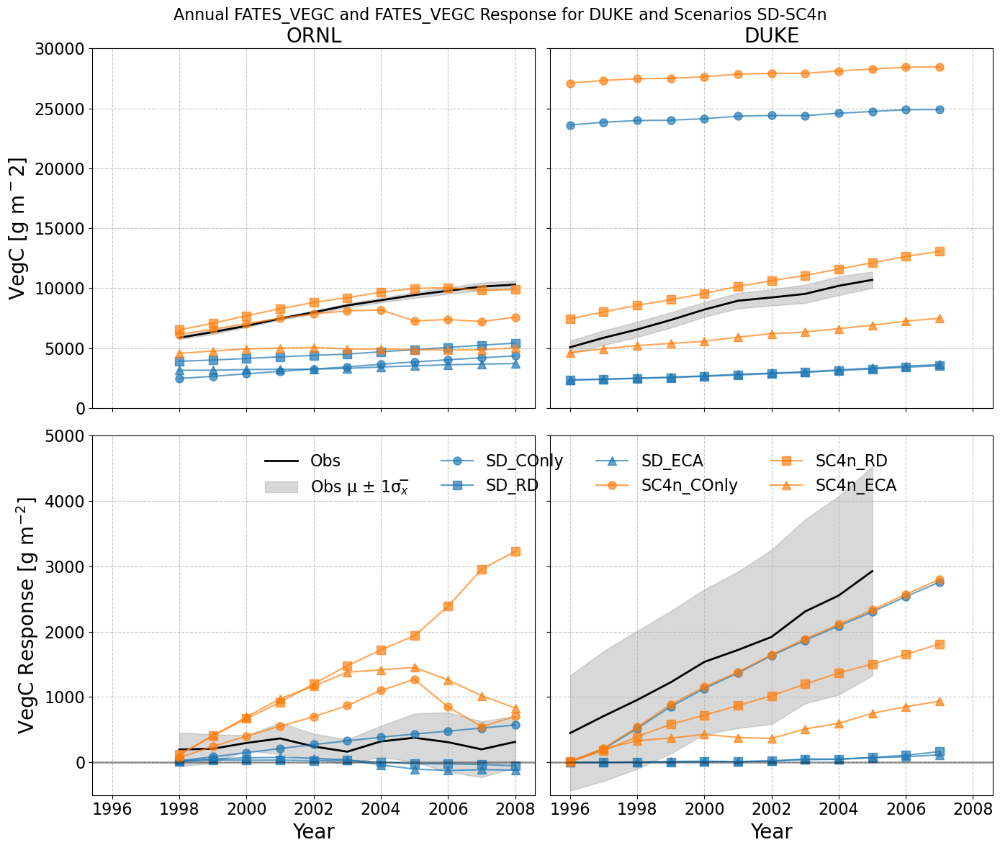

In [126]:

# Plot configuration
 
 

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[0,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[0,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]
ax[1,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[1,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[1,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

#ax[0,0].get_shared_y_axes().remove(ax[1,0])
#ax[0,1].get_shared_y_axes().remove(ax[1,1])


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text} [g m$^{-2}$]", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$]", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.58, .48),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

#### revised

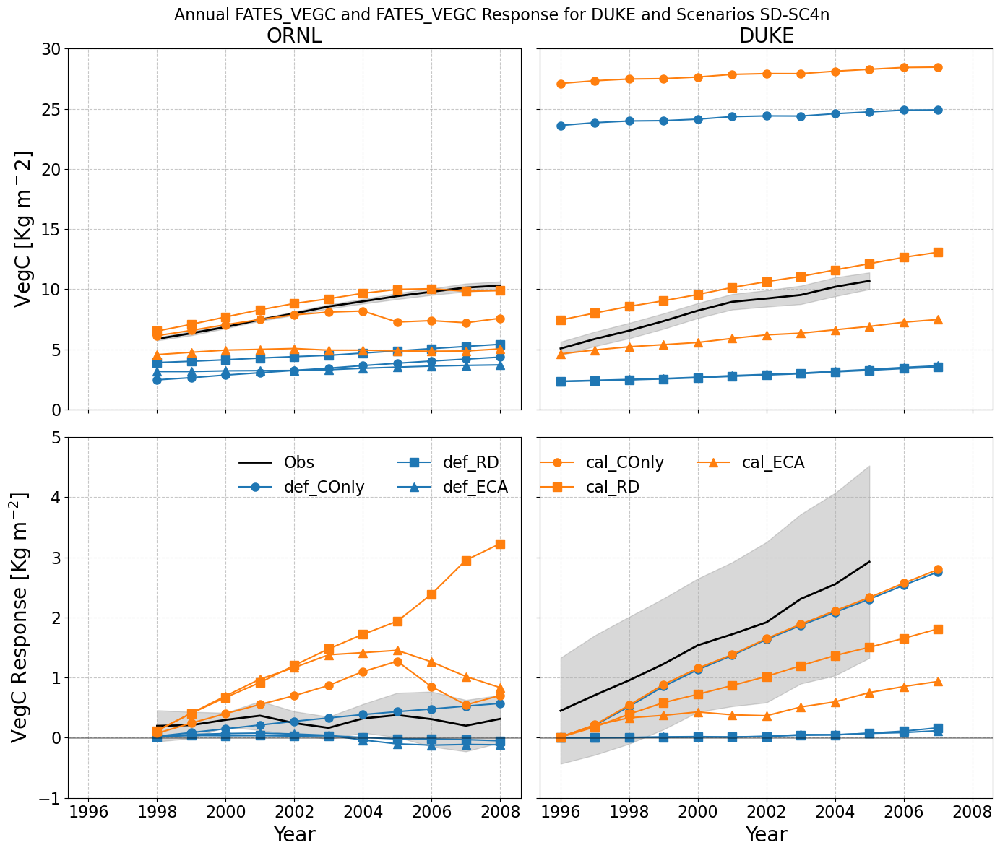

In [142]:
#combined plot
tmp_markersize=8
tmp_alpha = 1

#Biomass g >>> Kg
unit_convertion_biomass = 1000


ncol_legend = 4
 
ylim_variable = (0,30)
ylim_response = (-1,5)

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs']/unit_convertion_biomass, 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower']/unit_convertion_biomass, ornl['npp_1sd_upper']/unit_convertion_biomass,
                    color='gray', alpha=0.3)
                     #, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[0,0].plot(ornl['time'], values/unit_convertion_biomass,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs']/unit_convertion_biomass, 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower']/unit_convertion_biomass, duke['npp_1sd_upper']/unit_convertion_biomass,
                         color='gray', alpha=0.3)#, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[0,1].plot(duke['time'], values/unit_convertion_biomass,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]
ax[1,0].plot(ornl['time'], ornl['Obs']/unit_convertion_biomass, 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower']/unit_convertion_biomass, ornl['npp_1sd_upper']/unit_convertion_biomass,
                    color='gray', alpha=0.3)#, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[1,0].plot(ornl['time'], values/unit_convertion_biomass,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(duke['time'], duke['Obs']/unit_convertion_biomass, 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower']/unit_convertion_biomass, duke['npp_1sd_upper']/unit_convertion_biomass,
                         color='gray', alpha=0.3)#, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[1,1].plot(duke['time'], values/unit_convertion_biomass,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

#ax[0,0].get_shared_y_axes().remove(ax[1,0])
#ax[0,1].get_shared_y_axes().remove(ax[1,1])


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text} [Kg m$^{-2}$]", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response [Kg m$^{-2}$]", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
new_labels = [
    s.replace('SD', 'def').replace('SC4n', 'cal')
    for s in labels
]



# Place a single, figure-level legend at the top
fig.legend(
    handles, new_labels,
    loc='upper center',
    bbox_to_anchor=(0.52, .48),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}",
    fontsize=16
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}_rev.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}_rev.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

In [136]:
labels

['Obs', 'SD_COnly', 'SD_RD', 'SD_ECA', 'SC4n_COnly', 'SC4n_RD', 'SC4n_ECA']

## 6. AGB - Mortality

#### Question: Mortality should be subtracted as cummulative sum?

### Change below

In [41]:
var_obs= "c_veg"
var_name_obs = "c_veg"

var_names = ("FATES_VEGC_minus_MORT",
    #"NPP(GPPminusRA)",
        #"FATES_NPP",
        #"FATES_NPP-FATES_EXCESS_RESP",
       )



ylim_variable = (-5000,30000)
ylim_response = (-1000,5000)

ylim_variable_DUKE = (0,32000)
ylim_variable_ORNL = (0,16000)
ylim_response_DUKE = (0,6000)
ylim_response_ORNL = (0,2000)

# plot obs? 
obs_plot = 1 # 0,1

sim_markers = ["","<","o",">","<","^"]
case_lines = ["-","-","-","-","-","_"]
case_colors = ["maroon", "green", "blue"]

#combined plot
tmp_markersize=8
tmp_alpha = 0.7


data_plot_A = {}
data_plot_A ["ORNL"] = {}
data_plot_A ["DUKE"] = {}
data_plot_A ["ORNL"][var_obs] = {}
data_plot_A ["DUKE"][var_obs] = {}
data_plot_A ["ORNL"][var_names[0]] = {}
data_plot_A ["DUKE"][var_names[0]] = {}

data_plot_R = {}
data_plot_R ["ORNL"] = {}
data_plot_R ["DUKE"] = {}
data_plot_R ["ORNL"][var_obs] = {}
data_plot_R ["DUKE"][var_obs] = {}
data_plot_R ["ORNL"][var_names[0]] = {}
data_plot_R ["DUKE"][var_names[0]] = {}

#### ORNL

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2622246993.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2622246993.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2622246993.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2622246993.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2622246993.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' ins

Text(0.5, 1.0, 'Annual NPP Response for ORNL and Scenarios SD-SC4n\n')

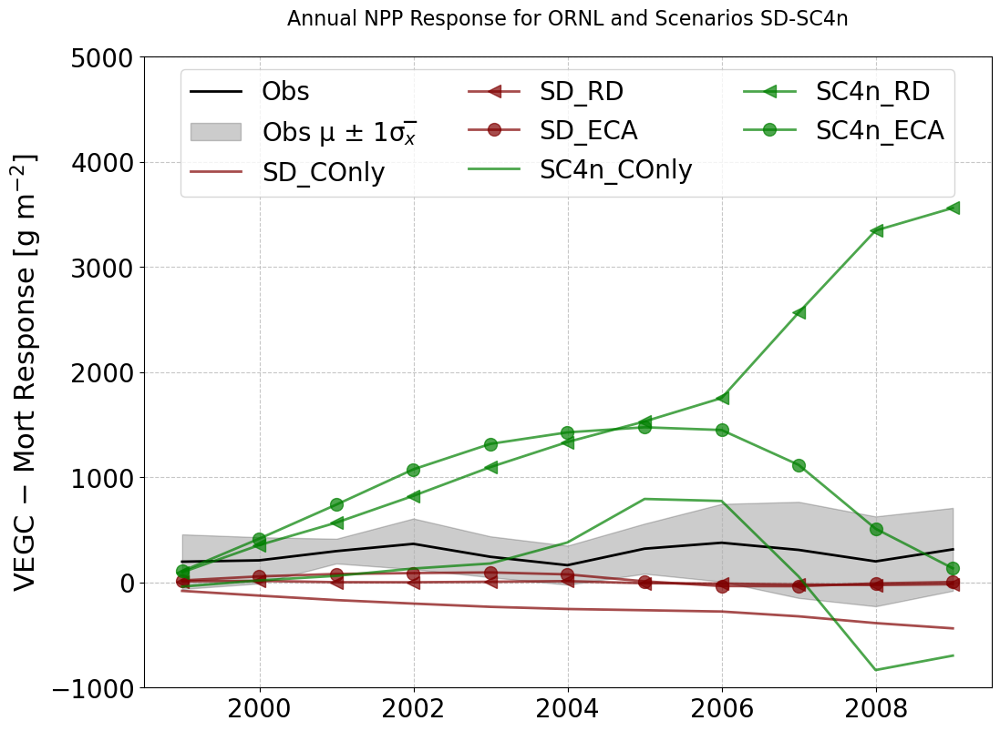

In [42]:
var_index = 0

# NPP Response for ORNL
select_site = "US-ORN"
site = "ORNL"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1998-01-01", "2008-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_VEGC_minus_MORT"]:
                        tmp_var_a = (ds[key]['FATES_VEGC'].groupby("time.year").mean()*1000 - 
                                     ds[key]['FATES_MORTALITY_CFLUX_PF'][:,:,0] .groupby('time.year').mean(dim='time').cumsum()*1000*365*24*60*60
                                    )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (ds[key_eCO2]['FATES_VEGC'].groupby("time.year").mean()*1000 - 
                                     ds[key_eCO2]['FATES_MORTALITY_CFLUX_PF'][:,:,0] .groupby('time.year').mean(dim='time').cumsum()*1000*365*24*60*60
                                    )

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a)[:,:,0],
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"VEGC ${-}$ Mort"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.values[:,0]
                        
                        
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


#### DUKE

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2641781248.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2641781248.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2641781248.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2641781248.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2641781248.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' ins

Text(0.5, 1.0, 'Annual NPP Response for DUKE and Scenarios SD-SC4n\n')

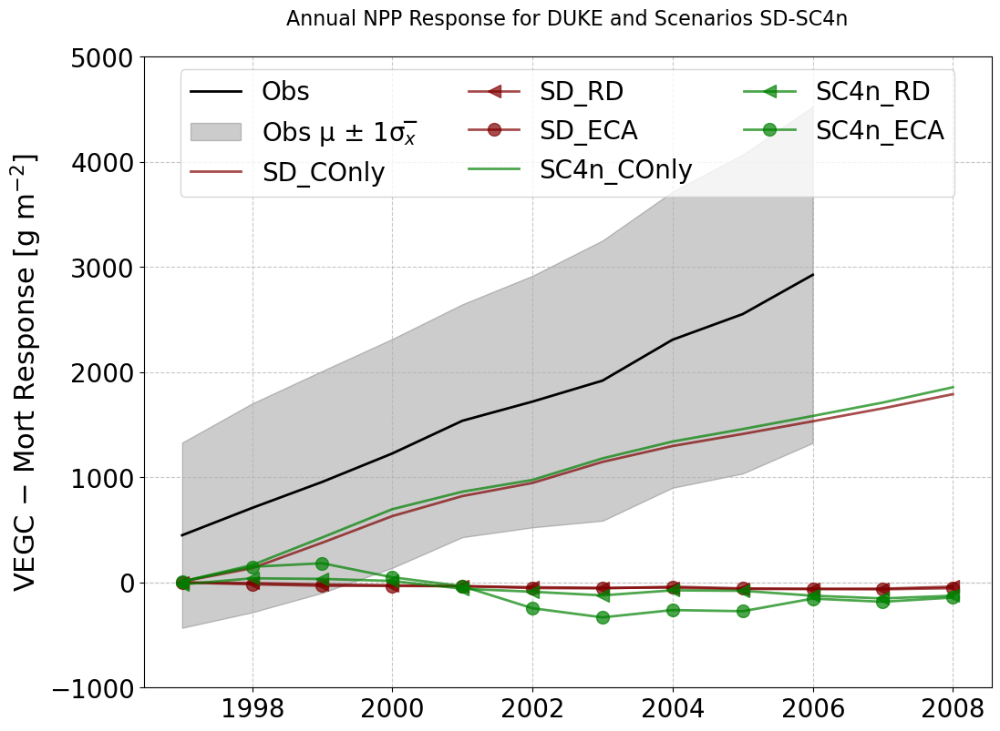

In [43]:
var_index = 0

# NPP Response for DUKE
select_site = "US-DUK"
site = "DUKE"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1996-01-01", "2007-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_VEGC_minus_MORT"]:
                        tmp_var_a = (ds[key]['FATES_VEGC'].groupby("time.year").mean()*1000 - 
                                     ds[key]['FATES_MORTALITY_CFLUX_PF'][:,:,0] .groupby('time.year').mean(dim='time').cumsum()*1000*365*24*60*60
                                    )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (ds[key_eCO2]['FATES_VEGC'].groupby("time.year").mean()*1000 - 
                                     ds[key_eCO2]['FATES_MORTALITY_CFLUX_PF'][:,:,0] .groupby('time.year').mean(dim='time').cumsum()*1000*365*24*60*60
                                    )

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a)[:,:,0],
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"VEGC ${-}$ Mort"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.values[:,0]
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


#### Combined plot

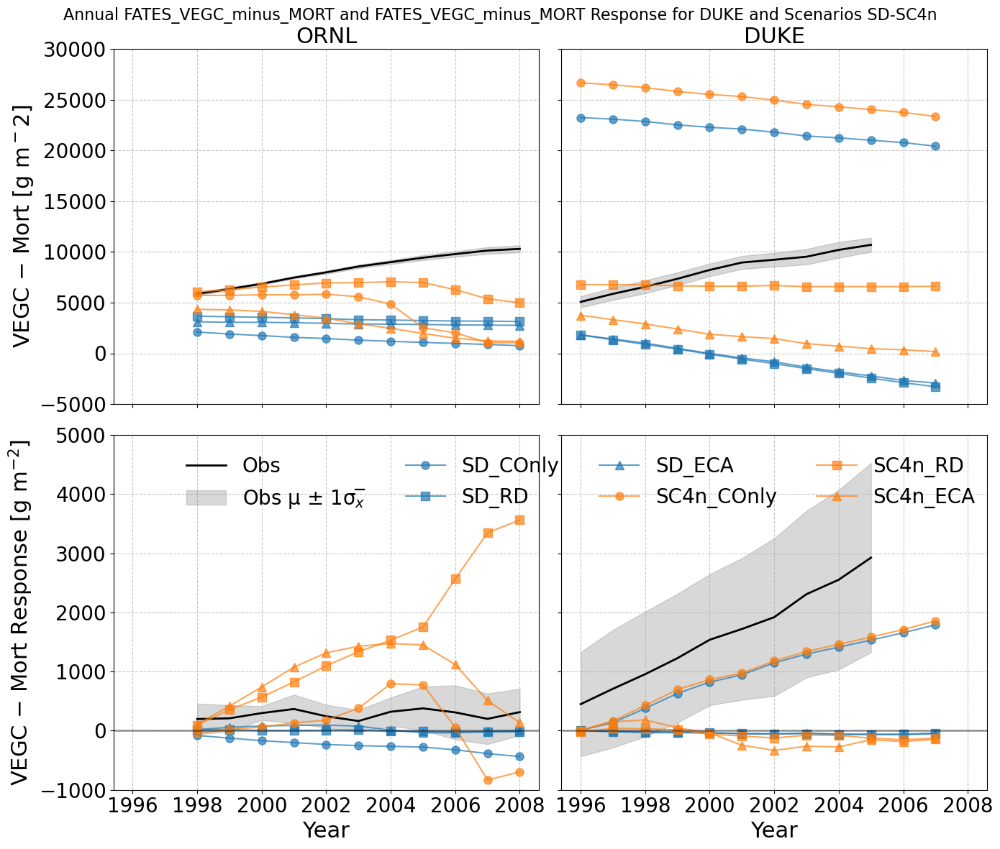

In [44]:

# Plot configuration
 
 

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC_minus_MORT"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[0,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[0,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]
ax[1,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[1,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[1,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

#ax[0,0].get_shared_y_axes().remove(ax[1,0])
#ax[0,1].get_shared_y_axes().remove(ax[1,1])


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text} [g m$^{-2}$]", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$]", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.58, .48),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

## 6.5 AGB + Mortality

#### Mortality should be added as cumulative

### Change below

In [143]:
var_obs= "c_veg"
var_name_obs = "c_veg"

var_names = ("FATES_VEGC_plus_MORT",
    #"NPP(GPPminusRA)",
        #"FATES_NPP",
        #"FATES_NPP-FATES_EXCESS_RESP",
       )



ylim_variable = (-5000,35000)
ylim_response = (-1000,5000)

ylim_variable_DUKE = (0,32000)
ylim_variable_ORNL = (0,16000)
ylim_response_DUKE = (0,6000)
ylim_response_ORNL = (0,35000)

# plot obs? 
obs_plot = 1 # 0,1

sim_markers = ["","<","o",">","<","^"]
case_lines = ["-","-","-","-","-","_"]
case_colors = ["maroon", "green", "blue"]

#combined plot
tmp_markersize=8
tmp_alpha = 0.7


data_plot_A = {}
data_plot_A ["ORNL"] = {}
data_plot_A ["DUKE"] = {}
data_plot_A ["ORNL"][var_obs] = {}
data_plot_A ["DUKE"][var_obs] = {}
data_plot_A ["ORNL"][var_names[0]] = {}
data_plot_A ["DUKE"][var_names[0]] = {}

data_plot_E = {}
data_plot_E ["ORNL"] = {}
data_plot_E ["DUKE"] = {}
data_plot_E ["ORNL"][var_obs] = {}
data_plot_E ["DUKE"][var_obs] = {}
data_plot_E ["ORNL"][var_names[0]] = {}
data_plot_E ["DUKE"][var_names[0]] = {}

data_plot_R = {}
data_plot_R ["ORNL"] = {}
data_plot_R ["DUKE"] = {}
data_plot_R ["ORNL"][var_obs] = {}
data_plot_R ["DUKE"][var_obs] = {}
data_plot_R ["ORNL"][var_names[0]] = {}
data_plot_R ["DUKE"][var_names[0]] = {}

#### ORNL

In [144]:
dict_obs_ax


{'ORNL': {'AMB':     YEAR  co2    c_leaf    c_wood   c_croot    c_froot        c_veg  site
  0   1998  AMB  209.3333  4181.667  1443.333   39.00000   5873.33330  ORNL
  1   1999  AMB  212.3333  4586.333  1473.000   71.66667   6343.33297  ORNL
  2   2000  AMB  225.0000  5096.667  1508.000   31.66667   6861.33367  ORNL
  3   2001  AMB  198.3333  5597.333  1533.667  142.33333   7471.66663  ORNL
  4   2002  AMB  223.0000  6117.333  1567.333   79.66667   7987.33267  ORNL
  5   2003  AMB  236.0000  6662.667  1601.333   63.66667   8563.66667  ORNL
  6   2004  AMB  206.3333  7040.667  1631.333  116.33333   8994.66663  ORNL
  7   2005  AMB  225.3333  7494.667  1661.000   48.66667   9429.66697  ORNL
  8   2006  AMB  231.0000  7837.667  1684.667   37.33333   9790.66733  ORNL
  9   2007  AMB  240.3333  8130.000  1707.667   58.33333  10136.33363  ORNL
  10  2008  AMB  188.0000  8341.000  1723.000   48.66667  10300.66667  ORNL,
  'ELE':     YEAR  co2  c_leaf  c_wood  c_croot  c_froot    c_veg  site


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3085779625.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3085779625.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(


FATES_VEGC_plus_MORT
FATES_VEGC_plus_MORT


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3085779625.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3085779625.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(


FATES_VEGC_plus_MORT
FATES_VEGC_plus_MORT


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3085779625.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3085779625.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(


FATES_VEGC_plus_MORT
FATES_VEGC_plus_MORT


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3085779625.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(


Text(0.5, 1.0, 'Annual NPP Response for ORNL and Scenarios SD-SC4n\n')

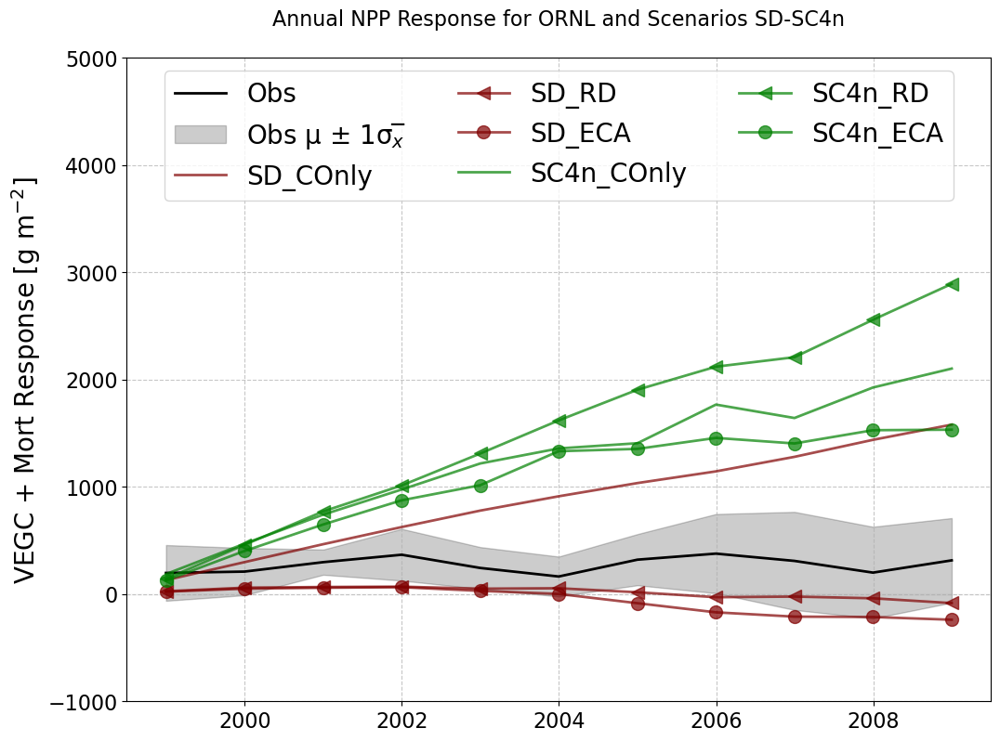

In [145]:
var_index = 0

# NPP Response for ORNL
select_site = "US-ORN"
site = "ORNL"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1998-01-01", "2008-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        # Getting Elevated data
                        mean_npp = Mean_DF1[f'{var_obs}']
                        se_npp = Standard_error_DF1[f'{var_obs}']
                        data_plot_E [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_E [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_E [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_E [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_VEGC_plus_MORT"]:
                        tmp_var_a = (ds[key]['FATES_VEGC'].groupby("time.year").mean()*1000 + 
                                     ds[key]['FATES_MORTALITY_CFLUX_PF'][:,:,0] .groupby('time.year').mean(dim='time').cumsum()*1000*365*24*60*60
                                    )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (ds[key_eCO2]['FATES_VEGC'].groupby("time.year").mean()*1000 + 
                                     ds[key_eCO2]['FATES_MORTALITY_CFLUX_PF'][:,:,0] .groupby('time.year').mean(dim='time').cumsum()*1000*365*24*60*60
                                    )

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a)[:,:,0],
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"VEGC ${+}$ Mort"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.values[:,0]
                        data_plot_E [site][var][f"{case_plot}_{sim_case}"] = tmp_var_e.values[:,0]
                        print (var)
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


#### DUKE

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/40167063.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/40167063.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/40167063.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/40167063.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/40167063.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  ti

Text(0.5, 1.0, 'Annual NPP Response for DUKE and Scenarios SD-SC4n\n')

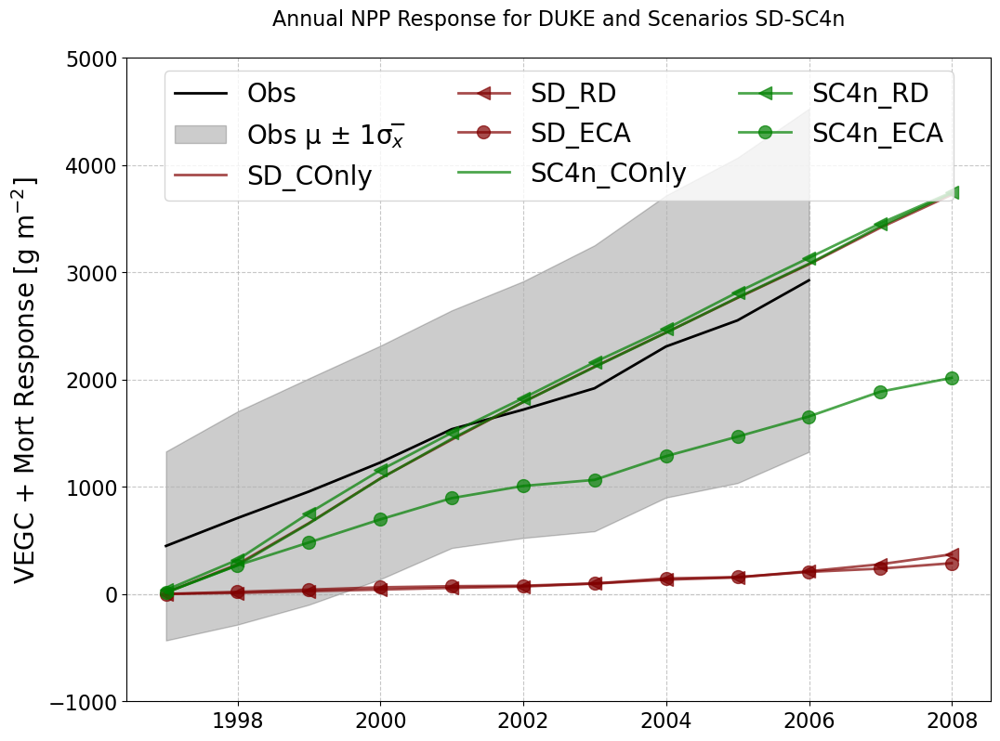

In [146]:
var_index = 0

# NPP Response for DUKE
select_site = "US-DUK"
site = "DUKE"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1996-01-01", "2007-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        # Getting Elevated data
                        mean_npp = Mean_DF1[f'{var_obs}']
                        se_npp = Standard_error_DF1[f'{var_obs}']
                        data_plot_E [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_E [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_E [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_E [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_VEGC_plus_MORT"]:
                        tmp_var_a = (ds[key]['FATES_VEGC'].groupby("time.year").mean()*1000 + 
                                     ds[key]['FATES_MORTALITY_CFLUX_PF'][:,:,0] .groupby('time.year').mean(dim='time').cumsum()*1000*365*24*60*60
                                    )
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = (ds[key_eCO2]['FATES_VEGC'].groupby("time.year").mean()*1000 + 
                                     ds[key_eCO2]['FATES_MORTALITY_CFLUX_PF'][:,:,0] .groupby('time.year').mean(dim='time').cumsum()*1000*365*24*60*60
                                    )

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a)[:,:,0],
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"VEGC ${+}$ Mort"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.values[:,0]
                        data_plot_E [site][var][f"{case_plot}_{sim_case}"] = tmp_var_e.values[:,0]
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


#### Combined Plot

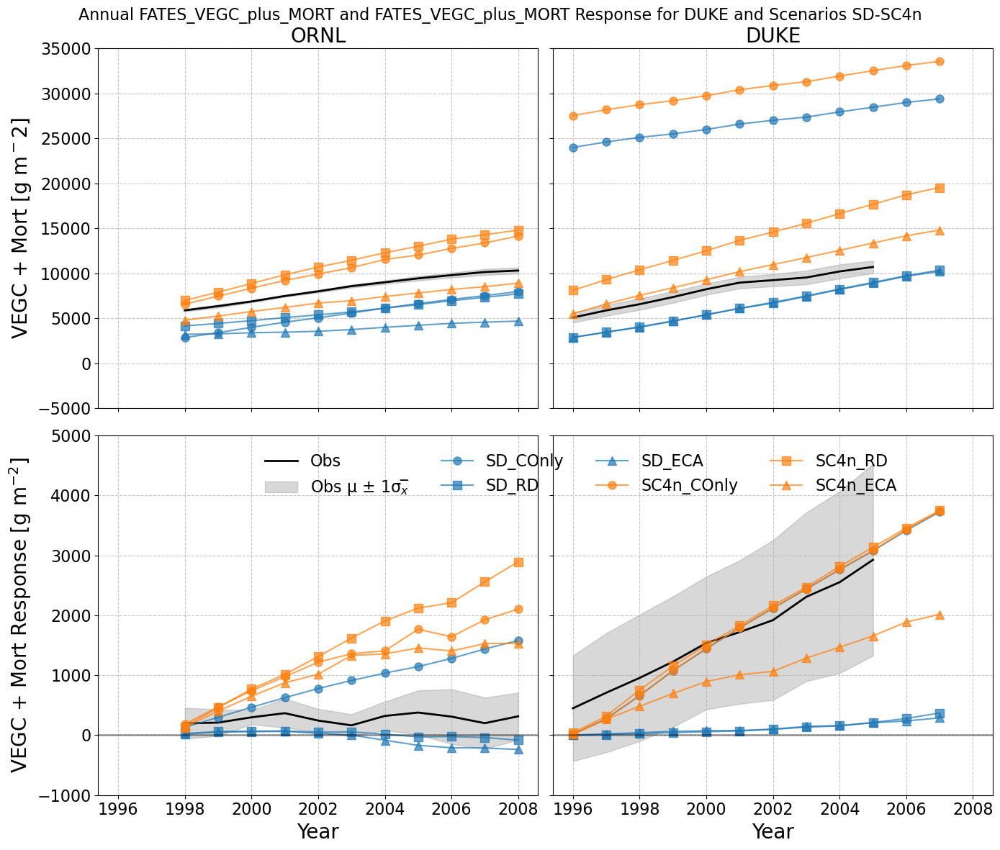

In [147]:
# Plot configuration 

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC_plus_MORT"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

PlotData_A [f'{site}'][f'{var_obs}'] = {}
PlotData_E [f'{site}'][f'{var_obs}'] = {}
PlotData_A [f'{site}'][f'{var_obs}']['time'] = data_plot_A[site][var_obs]['time']
PlotData_E [f'{site}'][f'{var_obs}']['time'] = data_plot_E[site][var_obs]['time']
PlotData_A [f'{site}'][f'{var_obs}']['Obs'] = data_plot_A[site][var_obs]['Obs']
PlotData_E [f'{site}'][f'{var_obs}']['Obs'] = data_plot_E[site][var_obs]['Obs']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_A[site][var_obs]['npp_1sd_lower']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_E[site][var_obs]['npp_1sd_lower']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_A[site][var_obs]['npp_1sd_upper']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_E[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_A [f'{site}'][f'{var_model}'] = {}
PlotData_E [f'{site}'][f'{var_model}'] = {}

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    PlotData_A [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    
    ax[0,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)

# Just for Dict for Elevated
# Plot all ORNL models
for model_key, values in data_plot_E[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    # for revised plots
    PlotData_E [f'{site}'][f'{var_model}'][f'{model_key}'] = values

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

PlotData_A [f'{site}'][f'{var_obs}'] = {}
PlotData_E [f'{site}'][f'{var_obs}'] = {}
PlotData_A [f'{site}'][f'{var_obs}']['time'] = data_plot_A[site][var_obs]['time']
PlotData_E [f'{site}'][f'{var_obs}']['time'] = data_plot_E[site][var_obs]['time']
PlotData_A [f'{site}'][f'{var_obs}']['Obs'] = data_plot_A[site][var_obs]['Obs']
PlotData_E [f'{site}'][f'{var_obs}']['Obs'] = data_plot_E[site][var_obs]['Obs']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_A[site][var_obs]['npp_1sd_lower']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_E[site][var_obs]['npp_1sd_lower']
PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_A[site][var_obs]['npp_1sd_upper']
PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_E[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_A [f'{site}'][f'{var_model}'] = {}
PlotData_E [f'{site}'][f'{var_model}'] = {}

for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    PlotData_A [f'{site}'][f'{var_model}'][f'{model_key}'] = values    
    ax[0,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# Just for Dict for Elevated
# Plot all ORNL models
for model_key, values in data_plot_E[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    # for revised plots
    PlotData_E [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    
# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]

#response
PlotData_R [f'{site}'][f'{var_obs}'] = {}
PlotData_R [f'{site}'][f'{var_obs}']['time'] = data_plot_R[site][var_obs]['time']
PlotData_R [f'{site}'][f'{var_obs}']['Obs']  = data_plot_R[site][var_obs]['Obs']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_R[site][var_obs]['npp_1sd_lower']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_R[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_R [f'{site}'][f'{var_model}'] = {}

ax[1,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    PlotData_R [f'{site}'][f'{var_model}'][f'{model_key}'] = values
    ax[1,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]

#response
PlotData_R [f'{site}'][f'{var_obs}'] = {}
PlotData_R [f'{site}'][f'{var_obs}']['time'] = data_plot_R[site][var_obs]['time']
PlotData_R [f'{site}'][f'{var_obs}']['Obs']  = data_plot_R[site][var_obs]['Obs']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'] = data_plot_R[site][var_obs]['npp_1sd_lower']
PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'] = data_plot_R[site][var_obs]['npp_1sd_upper']
# dict for models
PlotData_R [f'{site}'][f'{var_model}'] = {}

ax[1,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    PlotData_R [f'{site}'][f'{var_model}'][f'{model_key}'] = values    
    ax[1,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)



for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text} [g m$^{-2}$]", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$]", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.58, .48),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

#### revision

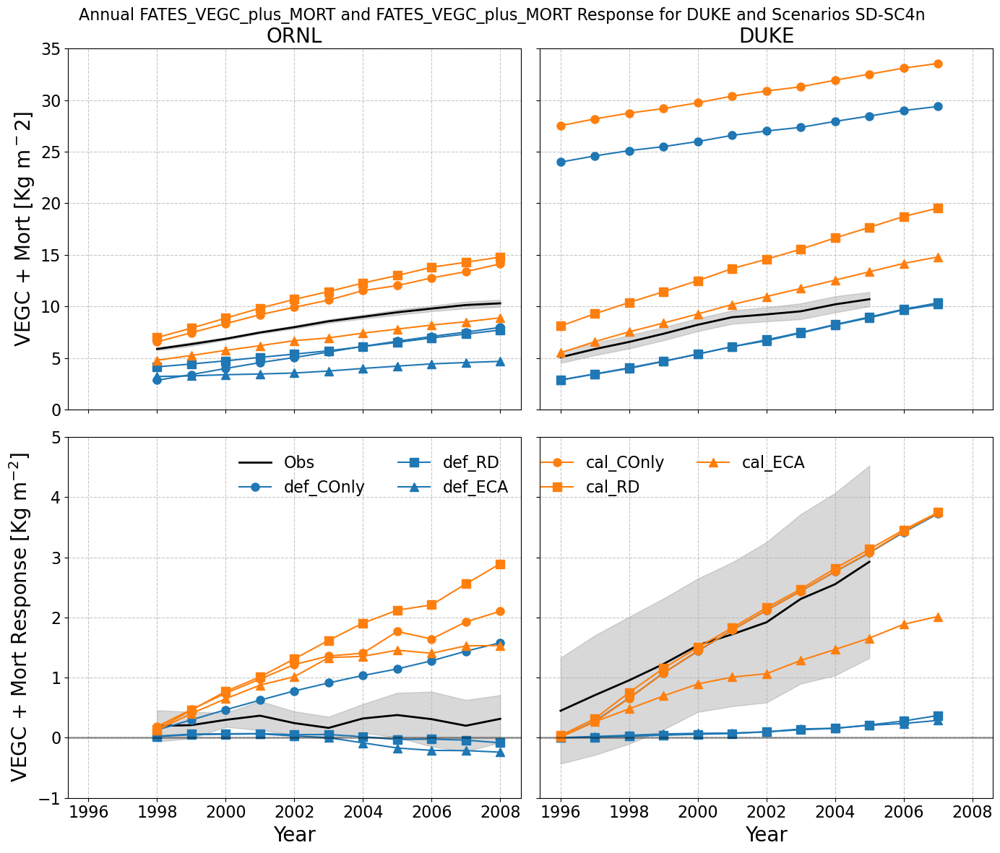

In [149]:
#combined plot
tmp_markersize=8
tmp_alpha = 1

#Biomass g >>> Kg
unit_convertion_biomass = 1000


ncol_legend = 4
 
ylim_variable = (0,35)
ylim_response = (-1,5)

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC_plus_MORT"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs']/unit_convertion_biomass, 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower']/unit_convertion_biomass, ornl['npp_1sd_upper']/unit_convertion_biomass,
                    color='gray', alpha=0.3)
                     #, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[0,0].plot(ornl['time'], values/unit_convertion_biomass,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs']/unit_convertion_biomass, 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower']/unit_convertion_biomass, duke['npp_1sd_upper']/unit_convertion_biomass,
                         color='gray', alpha=0.3)#, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[0,1].plot(duke['time'], values/unit_convertion_biomass,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]
ax[1,0].plot(ornl['time'], ornl['Obs']/unit_convertion_biomass, 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower']/unit_convertion_biomass, ornl['npp_1sd_upper']/unit_convertion_biomass,
                    color='gray', alpha=0.3)#, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[1,0].plot(ornl['time'], values/unit_convertion_biomass,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(duke['time'], duke['Obs']/unit_convertion_biomass, 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower']/unit_convertion_biomass, duke['npp_1sd_upper']/unit_convertion_biomass,
                         color='gray', alpha=0.3)#, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[1,1].plot(duke['time'], values/unit_convertion_biomass,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

#ax[0,0].get_shared_y_axes().remove(ax[1,0])
#ax[0,1].get_shared_y_axes().remove(ax[1,1])


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text} [Kg m$^{-2}$]", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response [Kg m$^{-2}$]", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
new_labels = [
    s.replace('SD', 'def').replace('SC4n', 'cal')
    for s in labels
]



# Place a single, figure-level legend at the top
fig.legend(
    handles, new_labels,
    loc='upper center',
    bbox_to_anchor=(0.52, .48),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}_rev.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}_rev.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

## 7. Mortality

In [50]:
# reading the mean and standard deviation from the OBS CSV data

path_obs_data = "/Users/ud4/Documents/FACEMDS/L2FR_Calc"

# Mean annual files
filename_ORNL_ax  = f"{path_obs_data}/data/ORNL_ax.csv"
filename_DUKE_ax  = f"{path_obs_data}/data/DUKE_ax.csv"
filename_ORNL_ase  = f"{path_obs_data}/data/ORNL_ase.csv"
filename_DUKE_ase  = f"{path_obs_data}/data/DUKE_ase.csv"


df_ORNL_ax = pd.read_csv(filename_ORNL_ax)
df_DUKE_ax = pd.read_csv(filename_DUKE_ax)
df_ORNL_ase = pd.read_csv(filename_ORNL_ase)
df_DUKE_ase = pd.read_csv(filename_DUKE_ase)

# Peak LAI in column name is 'ptrait_lai_peak'
obs_col_name = 'fc_wood_to_litter'

df_ORNL_fcWL_ax = df_ORNL_ax[['year','co2','fc_wood_to_litter']].copy()
df_DUKE_fcWL_ax = df_DUKE_ax[['year','co2','fc_wood_to_litter']].copy()
#df_ORNL_fcWL_ax ["c_veg"] = df_ORNL_fcWL_ax.filter(like="c_").sum(axis=1)
#df_DUKE_fcWL_ax ["c_veg"] = df_DUKE_fcWL_ax.filter(like="c_").sum(axis=1)

df_ORNL_fcWL_ax['site'] = "ORNL"
df_DUKE_fcWL_ax['site'] = "DUKE"

df_ORNL_fcWL_ase = df_ORNL_ase[['year','co2','fc_wood_to_litter']].copy()
df_DUKE_fcWL_ase = df_DUKE_ase[['year','co2','fc_wood_to_litter']].copy()

# because DUKE se has strs
cols_to_convert = ['fc_wood_to_litter']
df_DUKE_fcWL_ase[cols_to_convert] = df_DUKE_fcWL_ase[cols_to_convert].apply(pd.to_numeric, errors='coerce')

# sum of standard error
#df_ORNL_fcWL_ase ["c_veg"] = np.sqrt(df_ORNL_fcWL_ase.filter(like="c_").pow(2).sum(axis=1))
#df_DUKE_fcWL_ase ["c_veg"] = np.sqrt(df_DUKE_fcWL_ase.filter(like="c_").pow(2).sum(axis=1))

df_ORNL_fcWL_ase ['site'] = "ORNL"
df_DUKE_fcWL_ase ['site'] = "DUKE"

var_name_obs = "fc_wood_to_litter"
obs_var_units = "gC m-2 yr-1"
df_obs_ax = pd.concat([df_ORNL_fcWL_ax, df_DUKE_fcWL_ax], ignore_index=True)
#df_obs_ax.rename(columns={"ptrait_fcWL_peak": "Peak_fcWL"}, inplace=True)
df_obs_ax.rename(columns={"year": "YEAR"}, inplace=True)
# Replace negative values with NaN
df_obs_ax[df_obs_ax.select_dtypes(include=[np.number]) < 0] = np.nan

df_obs_ase = pd.concat([df_ORNL_fcWL_ase, df_DUKE_fcWL_ase], ignore_index=True)
#df_obs_ase.rename(columns={"ptrait_fcWL_peak": "Peak_fcWL"}, inplace=True)
df_obs_ase.rename(columns={"year": "YEAR"}, inplace=True)


In [51]:
# Filter the dataset to keep only rows where site is 'ORNL' or 'DUKE'
df_obs_ax_site = df_obs_ax[df_obs_ax['site'].isin(['ORNL', 'DUKE'])]
df_obs_ase_site = df_obs_ase[df_obs_ase['site'].isin(['ORNL', 'DUKE'])]

filter_co2 = df_obs_ase_site["co2"] == "AMB"
filter_site = df_obs_ase_site["site"] == "ORNL"
df_obs_ase_site[filter_co2][filter_site]

# arrange data into dict!
dict_obs_ax = {}
sites_o= ("ORNL", "DUKE" )
#sites_o= ( "ORNL", )

CO2_cases  = ("AMB", "ELE" )
dict_obs_ax = {}
dict_obs_ase = {} # standard error
dict_obs_aserel = {} #rel standard error = Val SE/Var
for site in sites_o:
    dict_obs_ax    [site] = {}
    dict_obs_ase   [site] = {}
    dict_obs_aserel [site] = {}
    for co2_case in CO2_cases:
        # selected values from mean
        filter_co2 = df_obs_ax_site["co2"] == co2_case
        filter_site = df_obs_ax_site["site"] == site
        dict_obs_ax[site][co2_case] = df_obs_ax_site[filter_co2][filter_site]
        # selected values from standard error
        filter_co2 = df_obs_ase_site["co2"] == co2_case
        filter_site = df_obs_ase_site["site"] == site
        dict_obs_ase[site][co2_case] = df_obs_ase_site[filter_co2][filter_site]
        dict_obs_aserel[site][co2_case] = df_obs_ase_site[filter_co2][filter_site].copy()
        dict_obs_aserel[site][co2_case][f"{var_name_obs}"] = df_obs_ase_site[filter_co2][filter_site][f"{var_name_obs}"]/(
            df_obs_ax_site[filter_co2][filter_site][f"{var_name_obs}"])

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_obs_ase_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_ax[site][co2_case] = df_obs_ax_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:30: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_ase[site][co2_case] = df_obs_ase_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_aserel[site][co2_case] = df_obs_ase_site[filter_co2][filter_site].copy()
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:32: UserWarni

#### Questions: 
1. Demography has die of tree data, but since it captures the number of trees that are dying, how to convert it to flux or mass density?
2. The f_wood_to_litter is very small

#### Change below

In [52]:
var_obs= "fc_wood_to_litter"
var_name_obs = "fc_wood_to_litter"

var_names = ("FATES_MORTALITY_CFLUX_PF",
       )



ylim_variable = (0,1500)
ylim_response = (-400,600)

ylim_variable_DUKE = (0,32000)
ylim_variable_ORNL = (0,16000)
ylim_response_DUKE = (0,6000)
ylim_response_ORNL = (0,2000)

# plot obs? 
obs_plot = 1 # 0,1

sim_markers = ["","<","o",">","<","^"]
case_lines = ["-","-","-","-","-","_"]
case_colors = ["maroon", "green", "blue"]

#combined plot
tmp_markersize=8
tmp_alpha = 0.7


data_plot_A = {}
data_plot_A ["ORNL"] = {}
data_plot_A ["DUKE"] = {}
data_plot_A ["ORNL"][var_obs] = {}
data_plot_A ["DUKE"][var_obs] = {}
data_plot_A ["ORNL"][var_names[0]] = {}
data_plot_A ["DUKE"][var_names[0]] = {}

data_plot_R = {}
data_plot_R ["ORNL"] = {}
data_plot_R ["DUKE"] = {}
data_plot_R ["ORNL"][var_obs] = {}
data_plot_R ["DUKE"][var_obs] = {}
data_plot_R ["ORNL"][var_names[0]] = {}
data_plot_R ["DUKE"][var_names[0]] = {}

#### ORNL

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/733660960.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/733660960.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/733660960.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/733660960.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/733660960.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.

Text(0.5, 1.0, 'Annual NPP Response for ORNL and Scenarios SD-SC4n\n')

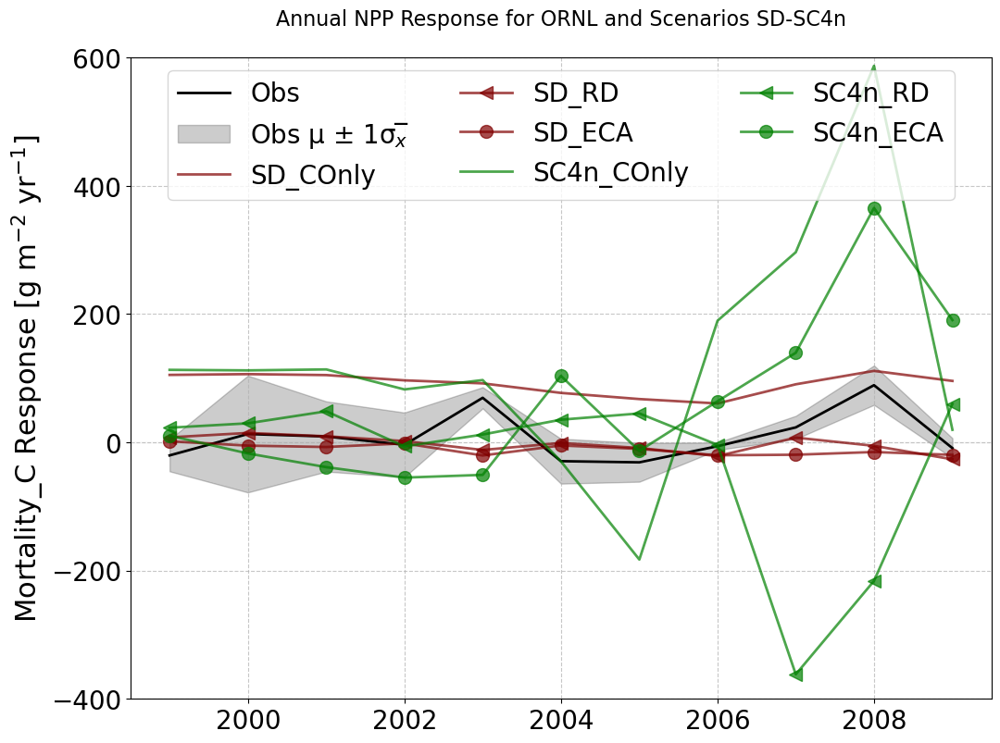

In [53]:
var_index = 0

# NPP Response for ORNL
select_site = "US-ORN"
site = "ORNL"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1998-01-01", "2008-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_MORTALITY_CFLUX_PF"]:
                        tmp_var_a = ds[key]['FATES_MORTALITY_CFLUX_PF'][:,:,0] *1000*365*24*60*60
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = ds[key_eCO2]['FATES_MORTALITY_CFLUX_PF'][:,:,0] *1000*365*24*60*60

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"Mortality_C"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


#### DUKE

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/426173737.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/426173737.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/426173737.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/426173737.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/426173737.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.

Text(0.5, 1.0, 'Annual NPP Response for DUKE and Scenarios SD-SC4n\n')

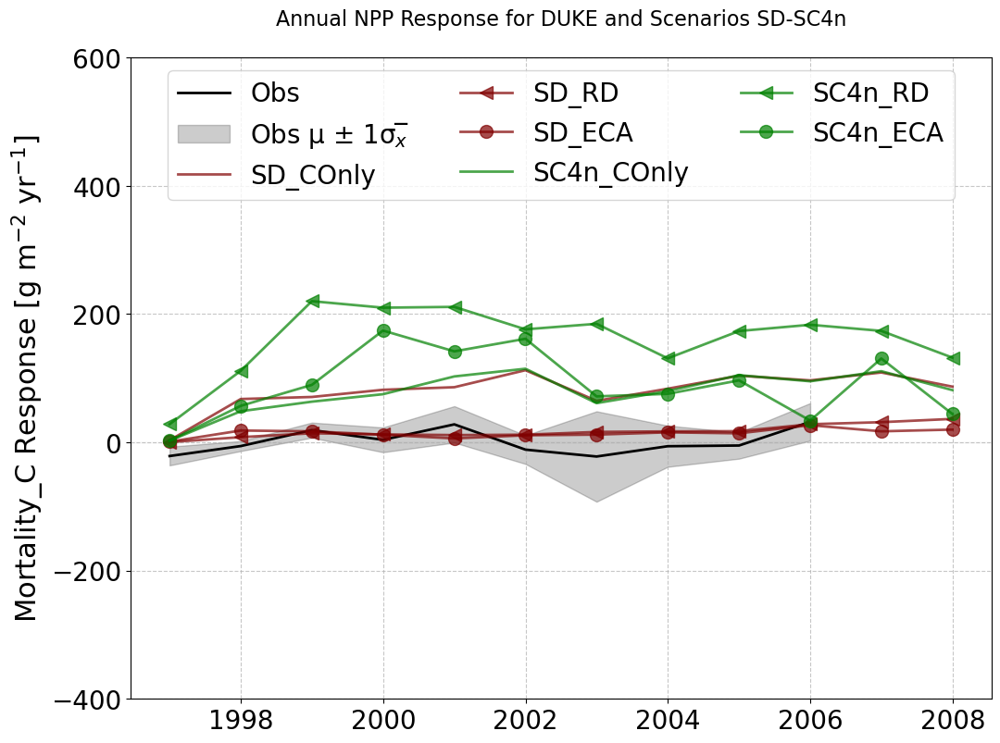

In [54]:
var_index = 0

# NPP Response for ORNL
select_site = "US-DUK"
site = "DUKE"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1996-01-01", "2007-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_MORTALITY_CFLUX_PF"]:
                        tmp_var_a = ds[key]['FATES_MORTALITY_CFLUX_PF'][:,:,0] *1000*365*24*60*60
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = ds[key_eCO2]['FATES_MORTALITY_CFLUX_PF'][:,:,0] *1000*365*24*60*60

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"Mortality_C"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


#### Combined plot

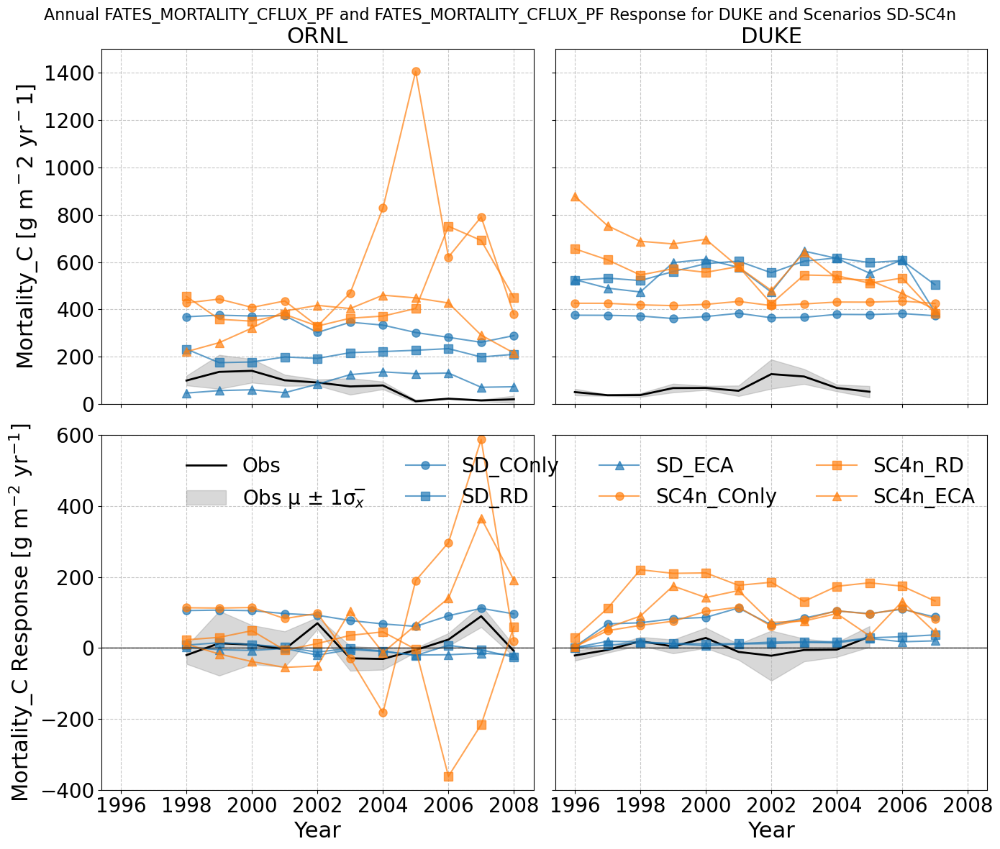

In [55]:

# Plot configuration
 
 

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "fc_wood_to_litter"
var_model = "FATES_MORTALITY_CFLUX_PF"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[0,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[0,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]
ax[1,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[1,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[1,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

#ax[0,0].get_shared_y_axes().remove(ax[1,0])
#ax[0,1].get_shared_y_axes().remove(ax[1,1])


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text} [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response [g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.58, .48),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

## 8. L2FR

#### Reading L2FR obs files

Standand error in Division

$A \pm \sigma_A$

$B \pm \sigma_B$

$
Q = \frac{A}{B}
$

$
\frac{\sigma_Q}{Q} = \sqrt{\left(\frac{\sigma_A}{A}\right)^2 + \left(\frac{\sigma_B}{B}\right)^2}
$

$
\sigma_Q = |Q| \cdot \sqrt{\left(\frac{\sigma_A}{A}\right)^2 + \left(\frac{\sigma_B}{B}\right)^2}
$

In [56]:
# reading the mean and standard deviation from the OBS CSV data

path_obs_data = "/Users/ud4/Documents/FACEMDS/L2FR_Calc"

# Mean annual files
filename_ORNL_ax  = f"{path_obs_data}/data/ORNL_ax.csv"
filename_DUKE_ax  = f"{path_obs_data}/data/DUKE_ax.csv"
filename_ORNL_ase  = f"{path_obs_data}/data/ORNL_ase.csv"
filename_DUKE_ase  = f"{path_obs_data}/data/DUKE_ase.csv"


df_ORNL_ax = pd.read_csv(filename_ORNL_ax)
df_DUKE_ax = pd.read_csv(filename_DUKE_ax)
df_ORNL_ase = pd.read_csv(filename_ORNL_ase)
df_DUKE_ase = pd.read_csv(filename_DUKE_ase)

#ax

df_ORNL_l2fr_ax = df_ORNL_ax[['year','co2','c_leaf','c_froot','c_wood','n_wood','n_froot','n_leaf_peak']].copy()
df_DUKE_l2fr_ax = df_DUKE_ax[['year','co2','c_leaf','c_froot','c_wood','n_wood','n_froot','n_leaf']].copy()
df_ORNL_l2fr_ax = df_ORNL_l2fr_ax.rename(columns={'n_leaf_peak': 'n_leaf'})
duke_cols= ['c_leaf','c_froot','c_wood','n_wood','n_froot','n_leaf']
df_DUKE_l2fr_ax [duke_cols] = df_DUKE_l2fr_ax[duke_cols].apply(pd.to_numeric, errors='coerce')

#ase for only l2fr
df_ORNL_l2fr_ase = df_ORNL_ase[['year','co2','c_leaf','c_froot','c_wood','n_wood','n_froot','n_leaf_peak']].copy()
df_DUKE_l2fr_ase = df_DUKE_ase[['year','co2','c_leaf','c_froot','c_wood','n_wood','n_froot','n_leaf']].copy()
df_ORNL_l2fr_ase = df_ORNL_l2fr_ase.rename(columns={'n_leaf_peak': 'n_leaf'})
duke_cols= ['c_leaf','c_froot','c_wood','n_wood','n_froot','n_leaf']
df_DUKE_l2fr_ase [duke_cols] = df_DUKE_l2fr_ase[duke_cols].apply(pd.to_numeric, errors='coerce')

# ORNL

# Compute the ratio c_froot / c_leaf - AX
df_ORNL_l2fr_ax.loc[:, 'l2fr'] = df_ORNL_l2fr_ax['c_froot'] / df_ORNL_l2fr_ax['c_leaf']
df_ORNL_l2fr_ax.loc[:, 'CN_leaf'] = df_ORNL_l2fr_ax['c_leaf'] / df_ORNL_l2fr_ax['n_leaf']
df_ORNL_l2fr_ax.loc[:, 'CN_froot'] = df_ORNL_l2fr_ax['c_froot'] / df_ORNL_l2fr_ax['n_froot']
df_ORNL_l2fr_ax.loc[:, 'CN_wood'] = df_ORNL_l2fr_ax['c_wood'] / df_ORNL_l2fr_ax['n_wood']
df_ORNL_l2fr_ax = df_ORNL_l2fr_ax.rename(columns={'year': 'Year'})
df_ORNL_l2fr_ax['site'] = "ORNL"

# Compute the ratio c_froot / c_leaf - ASE

# Function to propagate standard error for division: A / B
def se_division(A, B, se_A, se_B):
    rel_error = np.sqrt((se_A / A) ** 2 + (se_B / B) ** 2)
    return np.abs(A / B) * rel_error

# Calculate propagated standard errors for each ratio
df_ORNL_l2fr_ase['l2fr'] = se_division(
    df_ORNL_l2fr_ax['c_froot'], df_ORNL_l2fr_ax['c_leaf'],
    df_ORNL_l2fr_ase['c_froot'], df_ORNL_l2fr_ase['c_leaf']
)
df_ORNL_l2fr_ase['CN_leaf'] = se_division(
    df_ORNL_l2fr_ax['c_leaf'], df_ORNL_l2fr_ax['n_leaf'],
    df_ORNL_l2fr_ase['c_leaf'], df_ORNL_l2fr_ase['n_leaf']
)

df_ORNL_l2fr_ase['CN_froot'] = se_division(
    df_ORNL_l2fr_ax['c_froot'], df_ORNL_l2fr_ax['n_froot'],
    df_ORNL_l2fr_ase['c_froot'], df_ORNL_l2fr_ase['n_froot']
)

df_ORNL_l2fr_ase['CN_wood'] = se_division(
    df_ORNL_l2fr_ax['c_wood'], df_ORNL_l2fr_ax['n_wood'],
    df_ORNL_l2fr_ase['c_wood'], df_ORNL_l2fr_ase['n_wood']
)

df_ORNL_l2fr_ase = df_ORNL_l2fr_ase.rename(columns={'year': 'Year'})
df_ORNL_l2fr_ase['site'] = "ORNL"

# Calculate mean ratio for AMB and ELE
mean_l2fr_amb = df_ORNL_l2fr_ax[df_ORNL_l2fr_ax['co2'] == 'AMB']['l2fr'].mean()
mean_l2fr_ele = df_ORNL_l2fr_ax[df_ORNL_l2fr_ax['co2'] == 'ELE']['l2fr'].mean()

dict_obs = {}
dict_obs [f"ORNL_aCO2"] = df_ORNL_l2fr_ax[df_ORNL_l2fr_ax['co2'] == 'AMB'].copy() [["Year", "CN_leaf", "CN_froot", "CN_wood", "l2fr"]]
dict_obs [f"ORNL_eCO2"] = df_ORNL_l2fr_ax[df_ORNL_l2fr_ax['co2'] == 'ELE'].copy() [["Year", "CN_leaf", "CN_froot", "CN_wood", "l2fr"]]


print(f"Mean c_froot/c_leaf for AMB (ORNL): {mean_l2fr_amb:.5f}")
print(f"Mean c_froot/c_leaf for ELE (ORNL): {mean_l2fr_ele:.5f}")



# DUKE

# Compute the ratio c_froot / c_leaf 
df_DUKE_l2fr_ax.loc[:, 'l2fr'] = df_DUKE_l2fr_ax['c_froot'] / df_DUKE_l2fr_ax['c_leaf']
df_DUKE_l2fr_ax.loc[:, 'CN_leaf'] = df_DUKE_l2fr_ax['c_leaf'] / df_DUKE_l2fr_ax['n_leaf']
df_DUKE_l2fr_ax.loc[:, 'CN_froot'] = df_DUKE_l2fr_ax['c_froot'] / df_DUKE_l2fr_ax['n_froot']
df_DUKE_l2fr_ax.loc[:, 'CN_wood'] = df_DUKE_l2fr_ax['c_wood'] / df_DUKE_l2fr_ax['n_wood']
df_DUKE_l2fr_ax = df_DUKE_l2fr_ax.rename(columns={'year': 'Year'})
df_DUKE_l2fr_ax['site'] = "DUKE"

# Calculate propagated standard errors for each ratio
df_DUKE_l2fr_ase['l2fr'] = se_division(
    df_DUKE_l2fr_ax['c_froot'], df_DUKE_l2fr_ax['c_leaf'],
    df_DUKE_l2fr_ase['c_froot'], df_DUKE_l2fr_ase['c_leaf']
)
df_DUKE_l2fr_ase['CN_leaf'] = se_division(
    df_DUKE_l2fr_ax['c_leaf'], df_DUKE_l2fr_ax['n_leaf'],
    df_DUKE_l2fr_ase['c_leaf'], df_DUKE_l2fr_ase['n_leaf']
)

df_DUKE_l2fr_ase['CN_froot'] = se_division(
    df_DUKE_l2fr_ax['c_froot'], df_DUKE_l2fr_ax['n_froot'],
    df_DUKE_l2fr_ase['c_froot'], df_DUKE_l2fr_ase['n_froot']
)

df_DUKE_l2fr_ase['CN_wood'] = se_division(
    df_DUKE_l2fr_ax['c_wood'], df_DUKE_l2fr_ax['n_wood'],
    df_DUKE_l2fr_ase['c_wood'], df_DUKE_l2fr_ase['n_wood']
)

df_DUKE_l2fr_ase = df_DUKE_l2fr_ase.rename(columns={'year': 'Year'})
df_DUKE_l2fr_ase['site'] = "DUKE"


# Calculate mean ratio for AMB and ELE
mean_l2fr_amb = df_DUKE_l2fr_ax[df_DUKE_l2fr_ax['co2'] == 'AMB']['l2fr'].mean()
mean_l2fr_ele = df_DUKE_l2fr_ax[df_DUKE_l2fr_ax['co2'] == 'ELE']['l2fr'].mean()


dict_obs [f"DUKE_aCO2"] = df_DUKE_l2fr_ax[df_DUKE_l2fr_ax['co2'] == 'AMB'].copy() [["Year", "CN_leaf", "CN_froot", "CN_wood", "l2fr"]]
dict_obs [f"DUKE_eCO2"] = df_DUKE_l2fr_ax[df_DUKE_l2fr_ax['co2'] == 'ELE'].copy() [["Year", "CN_leaf", "CN_froot", "CN_wood", "l2fr"]]


print(f"L2FR: c_froot/c_leaf for AMB (DUKE): {mean_l2fr_amb:.5f}")
print(f"L2FR: c_froot/c_leaf for ELE (DUKE): {mean_l2fr_ele:.5f}")




var_name_obs = "l2fr"
obs_var_units = ""
df_obs_ax = pd.concat([df_ORNL_l2fr_ax, df_DUKE_l2fr_ax], ignore_index=True)
#df_obs_ax.rename(columns={"ptrait_cveg_peak": "Peak_cveg"}, inplace=True)
df_obs_ax.rename(columns={"Year": "YEAR"}, inplace=True)
# Replace negative values with NaN
df_obs_ax[df_obs_ax.select_dtypes(include=[np.number]) < 0] = np.nan

df_obs_ase = pd.concat([df_ORNL_l2fr_ase, df_DUKE_l2fr_ase], ignore_index=True)
#df_obs_ase.rename(columns={"ptrait_cveg_peak": "Peak_cveg"}, inplace=True)
df_obs_ase.rename(columns={"Year": "YEAR"}, inplace=True)




Mean c_froot/c_leaf for AMB (ORNL): 0.31384
Mean c_froot/c_leaf for ELE (ORNL): 0.67438
L2FR: c_froot/c_leaf for AMB (DUKE): 0.38081
L2FR: c_froot/c_leaf for ELE (DUKE): 0.36003


In [57]:
# Filter the dataset to keep only rows where site is 'ORNL' or 'DUKE'
df_obs_ax_site = df_obs_ax[df_obs_ax['site'].isin(['ORNL', 'DUKE'])]
df_obs_ase_site = df_obs_ase[df_obs_ase['site'].isin(['ORNL', 'DUKE'])]

filter_co2 = df_obs_ase_site["co2"] == "AMB"
filter_site = df_obs_ase_site["site"] == "ORNL"
df_obs_ase_site[filter_co2][filter_site]

# arrange data into dict!
dict_obs_ax = {}
sites_o= ("ORNL", "DUKE" )
#sites_o= ( "ORNL", )

CO2_cases  = ("AMB", "ELE" )
dict_obs_ax = {}
dict_obs_ase = {} # standard error
dict_obs_aserel = {} #rel standard error = Val SE/Var
for site in sites_o:
    dict_obs_ax    [site] = {}
    dict_obs_ase   [site] = {}
    dict_obs_aserel [site] = {}
    for co2_case in CO2_cases:
        # selected values from mean
        filter_co2 = df_obs_ax_site["co2"] == co2_case
        filter_site = df_obs_ax_site["site"] == site
        dict_obs_ax[site][co2_case] = df_obs_ax_site[filter_co2][filter_site]
        # selected values from standard error
        filter_co2 = df_obs_ase_site["co2"] == co2_case
        filter_site = df_obs_ase_site["site"] == site
        dict_obs_ase[site][co2_case] = df_obs_ase_site[filter_co2][filter_site]
        dict_obs_aserel[site][co2_case] = df_obs_ase_site[filter_co2][filter_site].copy()
        dict_obs_aserel[site][co2_case][f"{var_name_obs}"] = df_obs_ase_site[filter_co2][filter_site][f"{var_name_obs}"]/(
            df_obs_ax_site[filter_co2][filter_site][f"{var_name_obs}"])

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_obs_ase_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_ax[site][co2_case] = df_obs_ax_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:30: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_ase[site][co2_case] = df_obs_ase_site[filter_co2][filter_site]
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:31: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dict_obs_aserel[site][co2_case] = df_obs_ase_site[filter_co2][filter_site].copy()
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/1841161511.py:32: UserWarni

### Change below

In [58]:
var_obs= "l2fr"
var_name_obs = "l2fr"

var_names = ("FATES_L2FR",
    #"NPP(GPPminusRA)",
        #"FATES_NPP",
        #"FATES_NPP-FATES_EXCESS_RESP",
       )



ylim_variable = (-0.1, 1.5)
ylim_response = (-1,2)



# plot obs? 
obs_plot = 1 # 0,1
sim_cases_N = sim_cases[1:]
sim_markers = ["","<","o",">","<","^"]
case_lines = ["-","-","-","-","-","_"]
case_colors = ["maroon", "green", "blue"]

#combined plot
tmp_markersize=8
tmp_alpha = 0.7


data_plot_A = {}
data_plot_A ["ORNL"] = {}
data_plot_A ["DUKE"] = {}
data_plot_A ["ORNL"][var_obs] = {}
data_plot_A ["DUKE"][var_obs] = {}
data_plot_A ["ORNL"][var_names[0]] = {}
data_plot_A ["DUKE"][var_names[0]] = {}

data_plot_R = {}
data_plot_R ["ORNL"] = {}
data_plot_R ["DUKE"] = {}
data_plot_R ["ORNL"][var_obs] = {}
data_plot_R ["DUKE"][var_obs] = {}
data_plot_R ["ORNL"][var_names[0]] = {}
data_plot_R ["DUKE"][var_names[0]] = {}

#### ORNL

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2304158202.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2304158202.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2304158202.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2304158202.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2304158202.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' ins

Text(0.5, 1.0, 'Annual NPP Response for ORNL and Scenarios SD-SC4n\n')

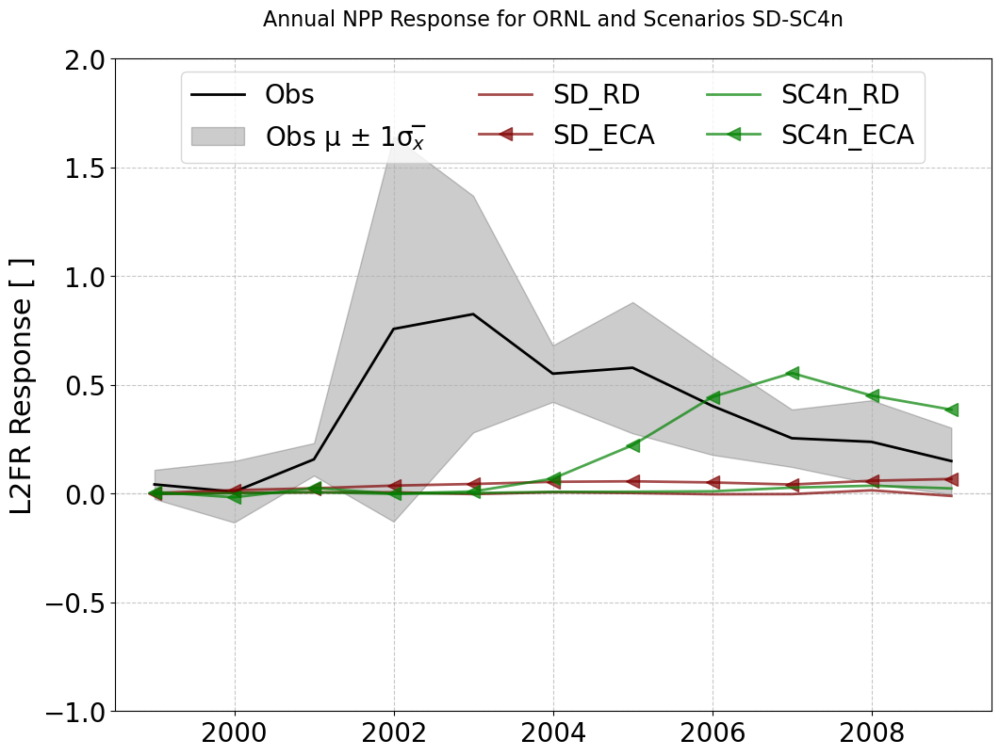

In [59]:
var_index = 0

# NPP Response for ORNL
select_site = "US-ORN"
site = "ORNL"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases_N):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                        "1998-01-01", "2008-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_L2FR"]:
                        tmp_var_a = ds[key]['FATES_L2FR'] 
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = ds[key_eCO2]['FATES_L2FR']

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"L2FR"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [ ]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


#### DUKE

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/172172083.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/172172083.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/172172083.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/172172083.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range(
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/172172083.py:19: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.

Text(0.5, 1.0, 'Annual NPP Response for DUKE and Scenarios SD-SC4n\n')

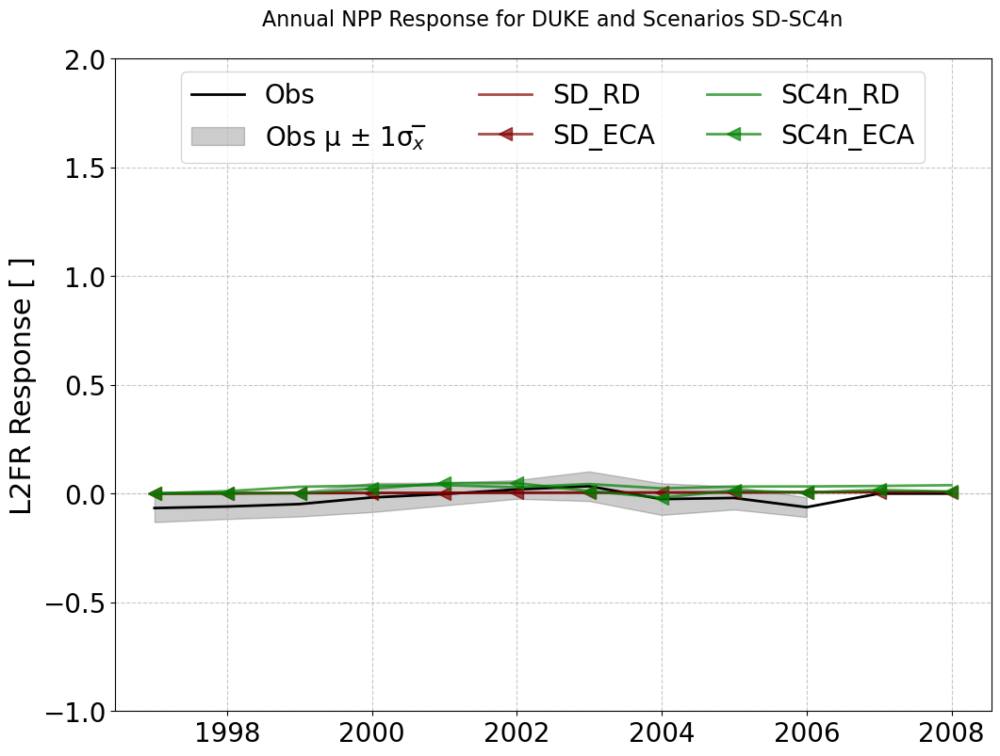

In [60]:
var_index = 0

# NPP Response for ORNL
select_site = "US-DUK"
site = "DUKE"
li = 0  # for legend index
fig1or = plt.figure(figsize=(12, 9))
ran_once = False


for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_index, sim_case in enumerate(sim_cases_N):
        if True:
            var = var_names[var_index]
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range(
                         "1996-01-01", "2007-12-31", freq="A"
                    )  # Monthly data
                    color_obs = "k"

                    if (obs_plot == 1) and (not ran_once):
                        Mean_DF1 = dict_obs_ax[site][CO2_cases[1]].reset_index(drop=True)
                        Mean_DF0 = dict_obs_ax[site][CO2_cases[0]].reset_index(drop=True)
                        
                        Mean_DF = (
                            Mean_DF1[["YEAR", f"{var_name_obs}"]]
                            - Mean_DF0[["YEAR", f"{var_name_obs}"]])
                        
                        Mean_DF["YEAR"] = Mean_DF1["YEAR"]

                        Standard_error_DF1 = dict_obs_ase[site][CO2_cases[1]].reset_index(
                            drop=True
                        )
                        Standard_error_DF0 = dict_obs_ase[site][CO2_cases[0]].reset_index(
                            drop=True
                        )

                        Standard_error_DF = (
                        (Standard_error_DF1[["YEAR", f"{var_name_obs}"]]) ** 2
                        + (Standard_error_DF0[["YEAR", f"{var_name_obs}"]]) ** 2
                        ) ** 0.5
                        Standard_error_DF["YEAR"] = Standard_error_DF1["YEAR"]
                        tmp_case = ""

                        # Extracting the relevant columns
                        years = Mean_DF["YEAR"]
                        mean_npp = Mean_DF[f"{var_obs}"]
                        se_npp = Standard_error_DF[f"{var_obs}"]
                        # Plot NPP with shaded error bars
                        plt.plot(
                            time,
                            mean_npp,
                            label=f"Obs",
                            color=color_obs,
                            lw=2,
                        )
                        plt.fill_between(
                            time,
                            mean_npp - se_npp,
                            mean_npp + se_npp,
                            label=f"Obs μ ± 1σ$_x̅$",
                            color=color_obs,
                            alpha=0.2,
                        )
                        # data_plots_obs[site][var_obs][tmp_case] = {}
                        # data_plots_obs[site][var_obs][tmp_case]["time"] = np.array([t.year for t in time])
                        # data_plots_obs[site][var_obs][tmp_case]["mean_npp"] = np.array(mean_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        # data_plots_obs[site][var_obs][tmp_case]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        data_plot_R [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_R [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_R [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_R [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)
                        
                        # Getting Ambient data
                        mean_npp = Mean_DF0[f'{var_obs}']
                        se_npp = Standard_error_DF0[f'{var_obs}']
                        data_plot_A [site][var_obs]["time"] = np.array([t.year for t in time])
                        data_plot_A [site][var_obs]["Obs"] = np.array(mean_npp)
                        data_plot_A [site][var_obs]["npp_1sd_lower"] = np.array(mean_npp - se_npp)
                        data_plot_A [site][var_obs]["npp_1sd_upper"] = np.array(mean_npp + se_npp)

                        ran_once = True

                    if "aCO2" in key:
                        #color_line = "blue"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        
                    if "eCO2" in key:
                        #color_line = "gray"
                        #marker_line = "^"
                        line_style  = case_lines    [case_idx]
                        marker_line = sim_markers  [sim_index]
                        color_line  = case_colors   [case_idx]
                        continue
                    if var in ["FATES_L2FR"]:
                        tmp_var_a = ds[key]['FATES_L2FR'] 
                        key_eCO2 = key.replace("aCO2", "eCO2")
                        tmp_var_e = ds[key_eCO2]['FATES_L2FR']

                        plt.plot(
                            time,
                            (tmp_var_e - tmp_var_a).groupby("time.year").mean(),
                            label = f"{case_plot}_{sim_case}",
                            color=color_line,
                            marker=marker_line,
                            linestyle=line_style,
                            alpha=0.7,
                            linewidth=2,
                            markersize=10,
                        )
                        var_label_text = r"L2FR"
                        data_plot_R [site][var][f"{case_plot}_{sim_case}"] = (tmp_var_e - tmp_var_a).groupby("time.year").mean().values[:,0]
                        data_plot_A [site][var][f"{case_plot}_{sim_case}"] = tmp_var_a.groupby("time.year").mean().values[:,0]
                    
                    if False:
                        print(ds[key][var].long_name)
plt.axhline(y=0, color="k", lw=2, alpha=0.02)
plt.grid(
    True, linestyle="--", alpha=0.7
)  # Dashed grid lines with better visibility


plt.ylabel(f"{var_label_text} "+ r"Response [ ]", fontsize=fsize_labels)   
plt.legend(fontsize=fsize_legend,loc="upper center", ncol=3)
plt.xticks(fontsize=fsize_ticks)  # Increase x-axis tick font size
plt.yticks(fontsize=fsize_ticks)  # Increase y-axis tick font size
plt.ylim(ylim_response)
plt.title(
    f"Annual NPP Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


<a id='lfr'></a>
### Combined plot

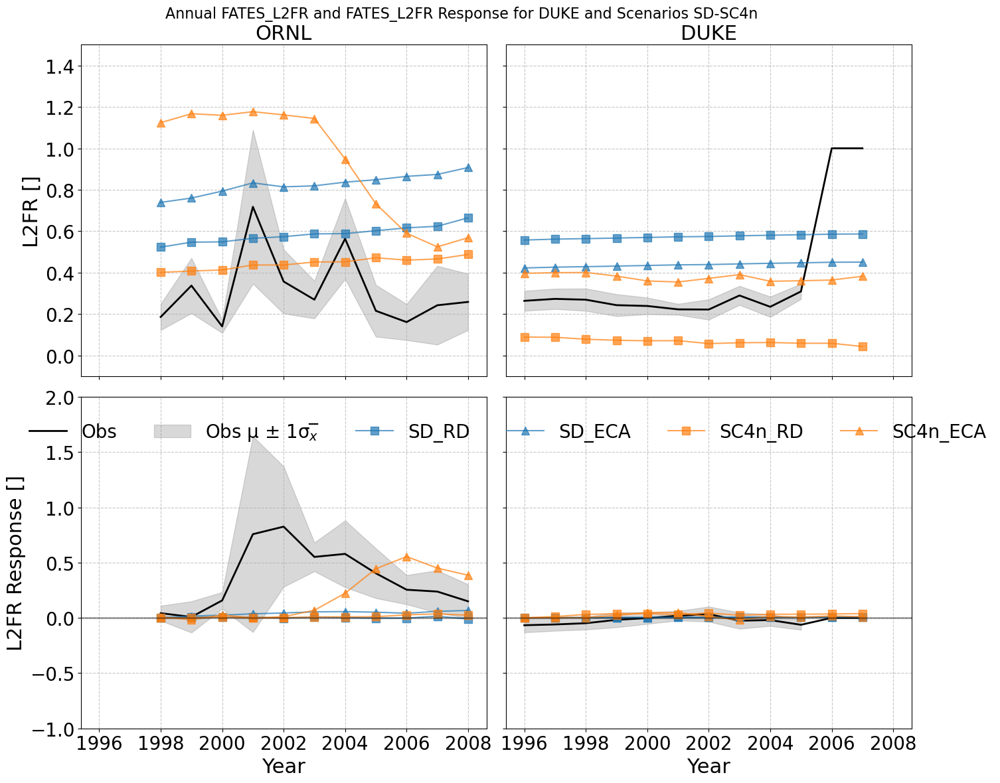

In [61]:

# Plot configuration
 
 

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "l2fr"
var_model = "FATES_L2FR"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[0,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[0,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]
ax[1,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[1,0].plot(ornl['time'], values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, label=f"Obs μ ± 1σ$_x̅$")
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[1,1].plot(duke['time'], values,
                     color=model_colors[family],
                     marker=model_markers.get(model_type, 'x'),
                     linestyle='-',
                     markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=model_key)

#ax[0,0].get_shared_y_axes().remove(ax[1,0])
#ax[0,1].get_shared_y_axes().remove(ax[1,1])


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text} []", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response []", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.55, .48),  # Centered above both axes
    ncol=6,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

In [62]:
f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png"

'/Users/ud4/Documents/FACEMDS/Figures_Paper/CombinedPlots/Fig_FATES_L2FR_SDvsSC4n.png'

#### Revised L2FR

RD SD
ECA SD
RD SC4n
ECA SC4n
RD SD
ECA SD
RD SC4n
ECA SC4n


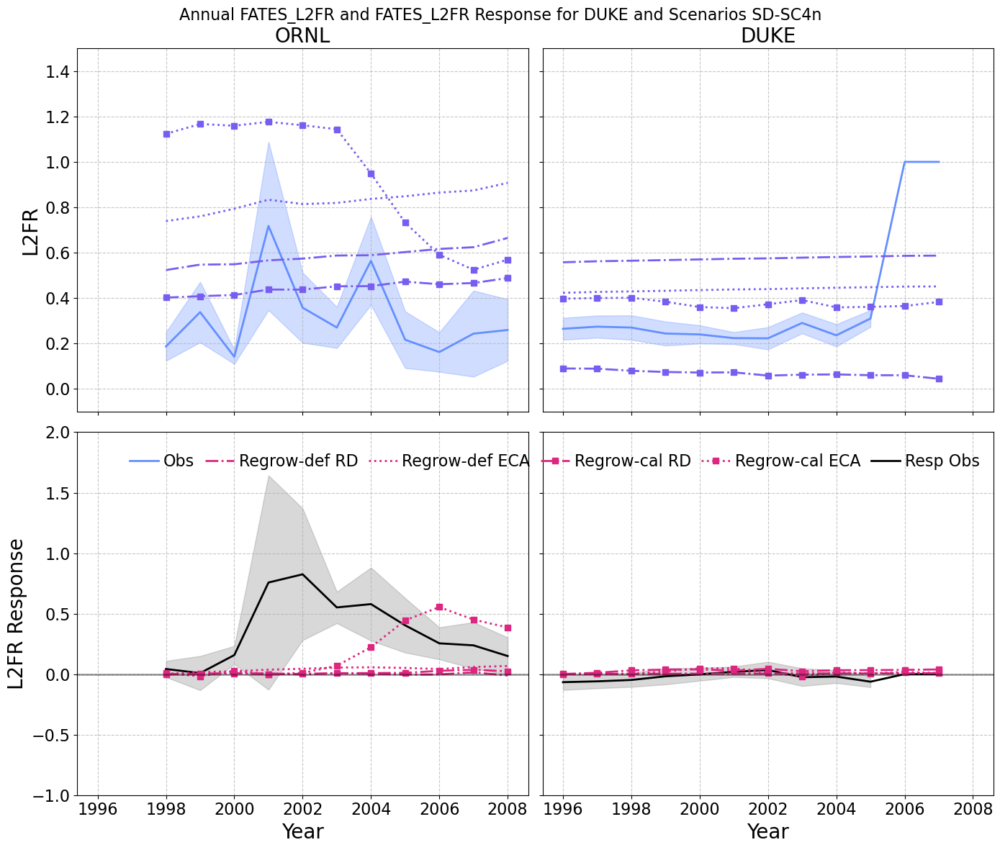

In [63]:

# Plot configuration
 
cb_list= ['#648FFF','#FFB000','#785EF0','#FE6100','#DC267F']
ls_list= ['-','--','-.',':']

case_colors = {'AMB': f'{cb_list[2]}', 'ELE': f'{cb_list[3]}', 'Resp':f'{cb_list[4]}'}
model_markers = {'COnly': 'o', 'RD': 's', 'ECA': '^'}
model_markers = {'SC4n' : 's', 'SD':''}
model_ls = {'COnly': '--', 'RD': '-.', 'ECA': ':'}
label_names_sup = {'SD':'Regrow-def', 'SC4n':'Regrow-cal'}


fsize_legend = 20
fsize_ticks = 16
fsize_labels = 20

#combined plot
tmp_markersize=8
tmp_alpha = 1

ncol_legend = 4

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "l2fr"
var_model = "FATES_L2FR"

ornl = data_plot_A[site][var_obs]

ax[0,0].plot(ornl['time'], ornl['Obs'], 
            label='Obs', color=cb_list[0], lw=2)
ax[0,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, #label=f"Obs μ ± 1σ$_x̅$"
                    )

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    #if model_key.startswith('SC4n_'):
    
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[0,0].plot(ornl['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(family, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"{label_names_sup.get(family,'x')} {model_key.split('_')[-1]}")
    print (model_type, family)





# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke =  data_plot_A[site][var_obs]
ax[0,1].plot(duke['time'], duke['Obs'], 
                 label='Obs', color=cb_list[0], lw=2)
ax[0,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color=cb_list[0], alpha=0.3, #label=f"Obs μ ± 1σ$_x̅$"
                    )
    
for model_key, values in data_plot_A[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[0,1].plot(duke['time'], values,
                     color=case_colors['AMB'],
                     marker=model_markers.get(family, 'x'),
                     linestyle=model_ls.get(model_type, 'x'), lw=2,
                     alpha=tmp_alpha,
                     label=f"a{model_key.split('_')[-1]}")
    print (model_type, family)

# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_R[site][var_obs]
ax[1,0].plot(ornl['time'], ornl['Obs'], 
            label='Resp Obs', color='black', lw=2)
ax[1,0].fill_between(ornl['time'], ornl['npp_1sd_lower'], ornl['npp_1sd_upper'],
                    color='gray', alpha=0.3, #label=f"Obs μ ± 1σ$_x̅$"
                    )

# Plot all ORNL models
for model_key, values in data_plot_R[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    
    ax[1,0].plot(ornl['time'], values,
                 color=case_colors['Resp'],
                 marker=model_markers.get(family, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"{label_names_sup.get(family,'x')} {model_key.split('_')[-1]}")



# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(duke['time'], duke['Obs'], 
                 label='Resp Obs', color='black', lw=2)
ax[1,1].fill_between(duke['time'], duke['npp_1sd_lower'], duke['npp_1sd_upper'],
                         color='gray', alpha=0.3, #label=f"Obs μ ± 1σ$_x̅$"
                    )
    
for model_key, values in data_plot_R[site][var_model].items():
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
        
    ax[1,1].plot(duke['time'], values,
                     color=case_colors['Resp'],
                     marker=model_markers.get(family, 'x'),
                     linestyle=model_ls.get(model_type, 'x'), lw=2,
                     #markersize=tmp_markersize,
                     alpha=tmp_alpha,
                     label=f"{label_names_sup.get(family,'x')} {model_key.split('_')[-1]}")

#ax[0,0].get_shared_y_axes().remove(ax[1,0])
#ax[0,1].get_shared_y_axes().remove(ax[1,1])


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(f"{var_label_text}", fontsize=fsize_labels)  
ax[1,0].set_ylabel(f"{var_label_text} "+ r"Response", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle

h1, l1 = ax[1,0].get_legend_handles_labels()
h2, l2 = ax[0,0].get_legend_handles_labels()
legend_dict = dict(zip(l1 + l2[0:], h1 + h2[0:]))
legend_dict = dict(zip( l2[0:]+l1, h2[0:]+h1))
handles = list(legend_dict.values())
labels = list(legend_dict.keys())
#handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
#unique = dict(zip(labels, handles))
#handles = list(unique.values())
#labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.554, .48),  # Centered above both axes
    ncol=6,                      # Adjust as needed
    frameon=False,
    columnspacing=0.65,
    handletextpad=0.3,
    handlelength=1.8,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)


plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)


In [64]:
f"{path_save_results}/RevisedAWplots/R2_Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png"

'/Users/ud4/Documents/FACEMDS/Figures_Paper/RevisedAWplots/R2_Fig_FATES_L2FR_SDvsSC4n.png'

In [65]:
family

'SC4n'

In [66]:
l2

['Obs', 'Regrow-def RD', 'Regrow-def ECA', 'Regrow-cal RD', 'Regrow-cal ECA']

## 9. Stand Density

### Reading StandDensity obs files

In [151]:
path_demography_data = '/Users/ud4/Documents/FACEMDS/Demography_Data'
Duke_dbh_fname = f'{path_demography_data}/Duke/DUKE-FACE_BasalArea.csv'
ORNL_dbh_fname = f'{path_demography_data}/ORNL/ORNL-FACE_BasalArea_Norby.csv'

# reading the data
df_ORNL = pd.read_csv(ORNL_dbh_fname)
df_ORNL['dbh_cm'] = np.sqrt((4 * df_ORNL['BA']) / np.pi)


# reading the data
df_DUKE = pd.read_csv(Duke_dbh_fname)
df_DUKE['dbh_cm'] = np.sqrt((4 * df_DUKE['BA']) / np.pi)
# keeping only PITA species
df_DUKE = df_DUKE[df_DUKE['Species'] == 'PITA']

### Change below

In [171]:
# Inputs
# ======

dict_time_select = {}
dict_time_select ["ORNL"] = {}
dict_time_select ["DUKE"] = {}
dict_time_select ["ORNL"]["start"] = "1998-01-01"
dict_time_select ["ORNL"]["end"]   = "2008-07-01"

dict_time_select ["DUKE"]["start"] = "1996-07-01"
dict_time_select ["DUKE"]["end"]   = "2007-07-01"

plot_period = "start" # "start", "end"

var_obs= "Stand_Density"
var_name_obs = "Stand_Density"

var_names = ("FATES_NPLANT_SZ",
       )


# plot obs? 
obs_plot = 1 # 0,1

sim_markers = ["","<","o",">","<","^"]
case_lines = ["-","-","-","-","-","_"]
case_colors = ["maroon", "green", "blue"]

#combined plot
tmp_markersize=8
tmp_alpha = 0.7

ylim_variable = (0, 10**4)
ylim_response = (0, 10**4)


data_plot_A = {}
data_plot_A ["ORNL"] = {}
data_plot_A ["DUKE"] = {}
data_plot_A ["ORNL"][var_obs] = {}
data_plot_A ["DUKE"][var_obs] = {}
data_plot_A ["ORNL"][var_names[0]] = {}
data_plot_A ["DUKE"][var_names[0]] = {}

data_plot_R = {}
data_plot_R ["ORNL"] = {}
data_plot_R ["DUKE"] = {}
data_plot_R ["ORNL"][var_obs] = {}
data_plot_R ["DUKE"][var_obs] = {}
data_plot_R ["ORNL"][var_names[0]] = {}
data_plot_R ["DUKE"][var_names[0]] = {}

#### ORNL

In [172]:
# ORNL

df = pd.read_csv(ORNL_dbh_fname)
df['dbh_cm'] = np.sqrt((4 * df['BA']) / np.pi)

# --- Step 1: Clean data ---
df_clean = df.copy()

# Ensure ptime is datetime
df_clean['ptime'] = pd.to_datetime(df_clean['ptime'], errors='coerce')

# Ensure dbh_cm is numeric
df_clean['dbh_cm'] = pd.to_numeric(df_clean['dbh_cm'], errors='coerce')

# Filter for living trees
df_alive = df_clean[df_clean['die'] == False].dropna(subset=['dbh_cm', 'ptime'])

# DBH size class bins
bins = np.array([0.0, 3.0, 6.0, 9.0, 12.0, 15.0, 18.0, 21.0, 25.0, 30.0, 35.0, 50.0, np.inf])
bin_labels = [f"{bins[i]}-{bins[i+1]}" for i in range(len(bins)-1)]
bin_means = [(bins[i] + bins[i+1]) / 2 for i in range(len(bins)-1)]

# Create size_class column
df_alive['size_class'] = pd.cut(df_alive['dbh_cm'], bins=bins, labels=bin_labels, right=False)

# Drop rows where size_class is NaN (e.g., dbh_cm not in any bin)
df_alive = df_alive.dropna(subset=['size_class'])

# --- Step 3: Count number of trees per time, co2 treatment, and size class ---
grouped = df_alive.groupby(['co2', 'ptime', 'size_class']).size()

# Reshape to wide format (size_class columns)
grouped = grouped.unstack(fill_value=0)

# ORNL

diff_bins = np.diff(bins)
print (diff_bins)
print ("replacing the last one with a value of 50")
diff_bins[-1] = 50
print("diff bin size", diff_bins.size)

print ("since bins have one extra element, deleting it")
bins = bins[:-1]

print ("Now we will be ploting nplants/cm / area")

[ 3.  3.  3.  3.  3.  3.  3.  4.  5.  5. 15. inf]
replacing the last one with a value of 50
diff bin size 12
since bins have one extra element, deleting it
Now we will be ploting nplants/cm / area


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/613094701.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_alive.groupby(['co2', 'ptime', 'size_class']).size()


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3772068983.py:46: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data


fig start COnly
fig start RD
fig start ECA
fig end ECA ORNL
/Users/ud4/Documents/FACEMDS/Figures_Paper/Stand_Density_1998_sce_SD_ORNL_ECA.pdf


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3772068983.py:46: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3772068983.py:46: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3772068983.py:46: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3772068983.py:46: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "200

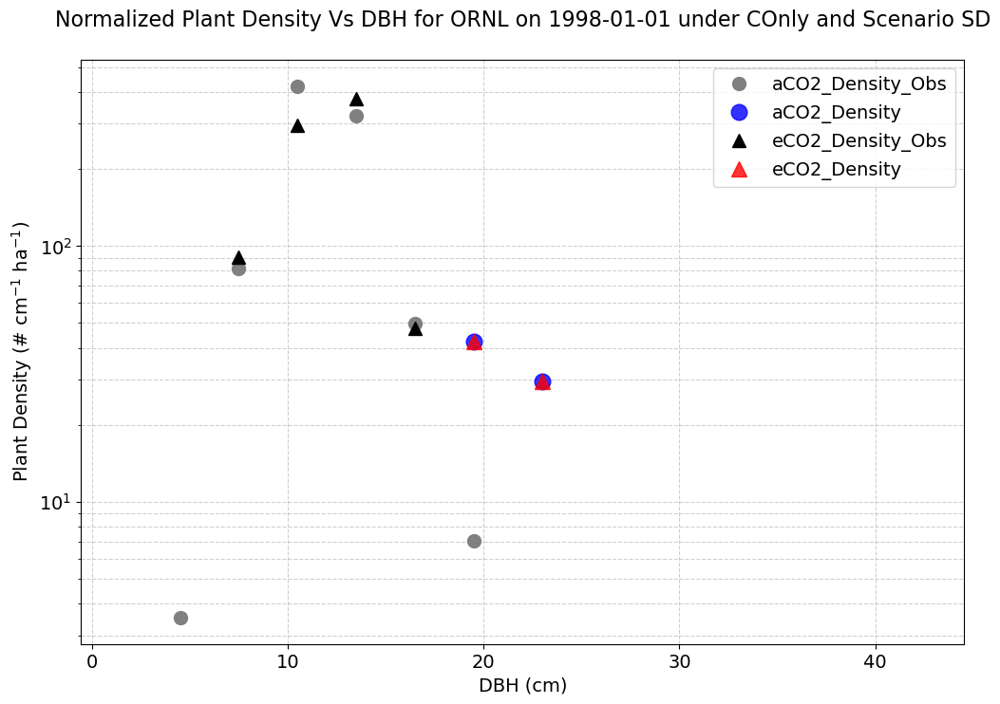

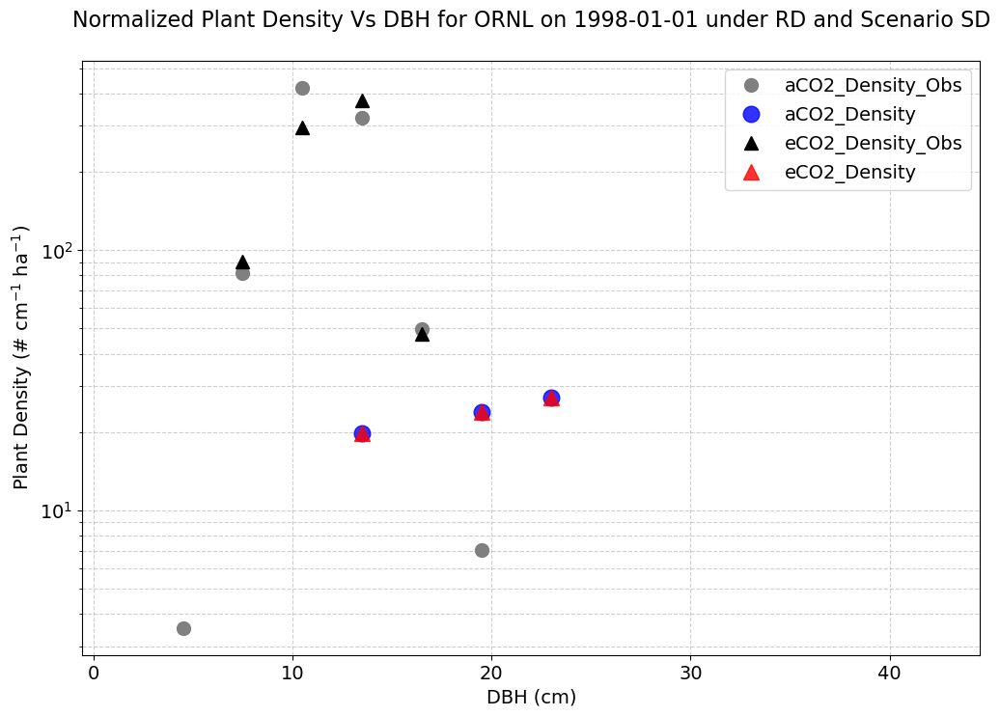

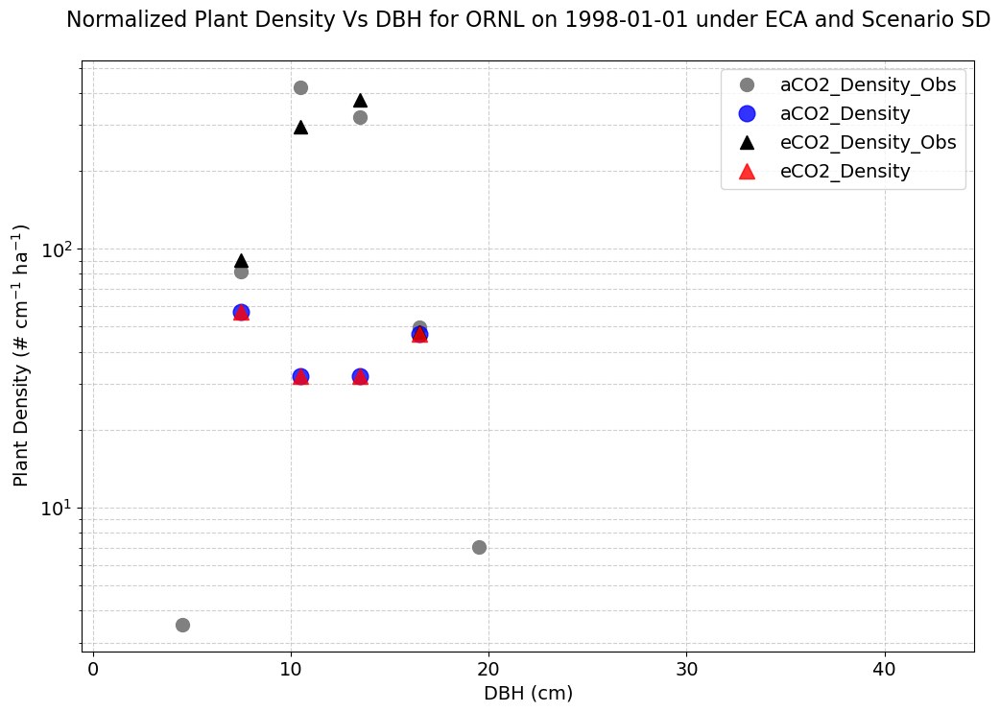

fig start COnly
fig start RD
fig start ECA
fig end ECA ORNL
/Users/ud4/Documents/FACEMDS/Figures_Paper/Stand_Density_1998_sce_SC4n_ORNL_ECA.pdf


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3772068983.py:46: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3772068983.py:46: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3772068983.py:46: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/3772068983.py:46: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "200

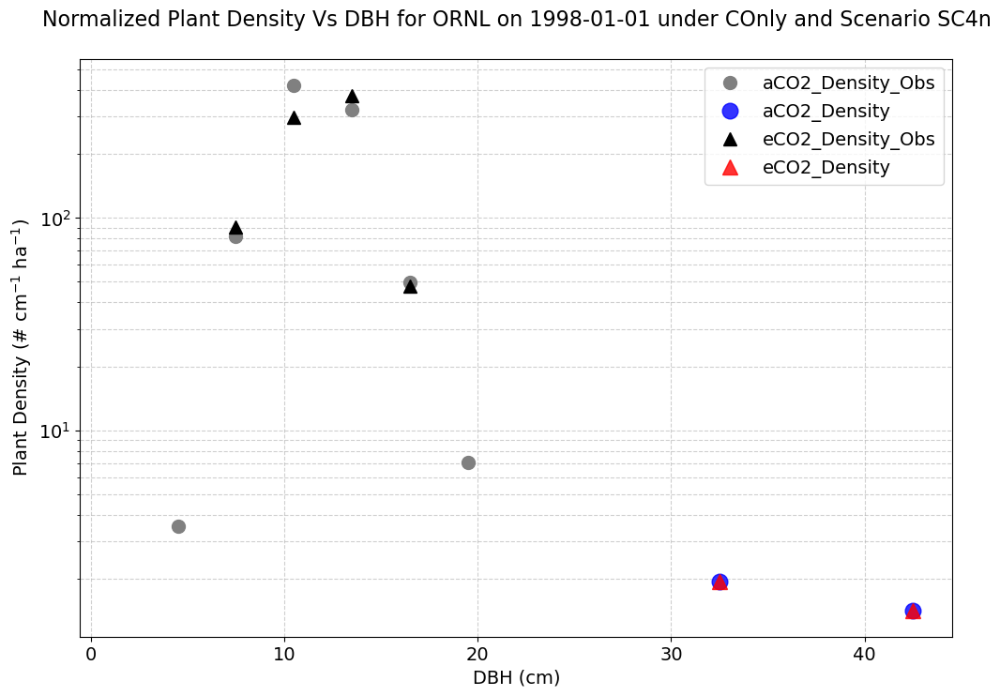

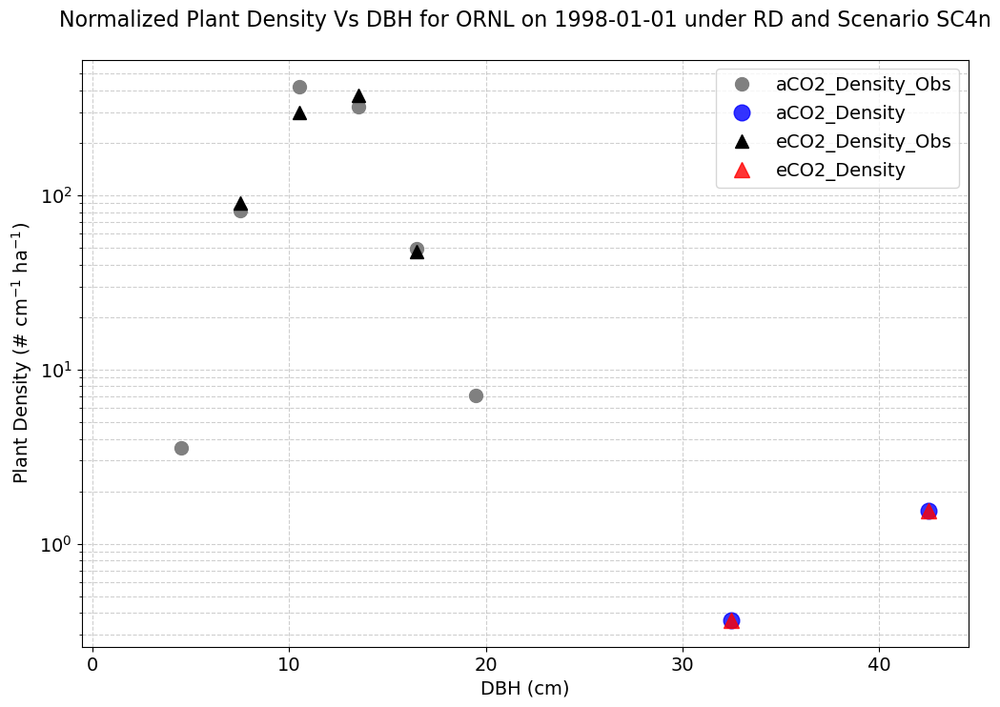

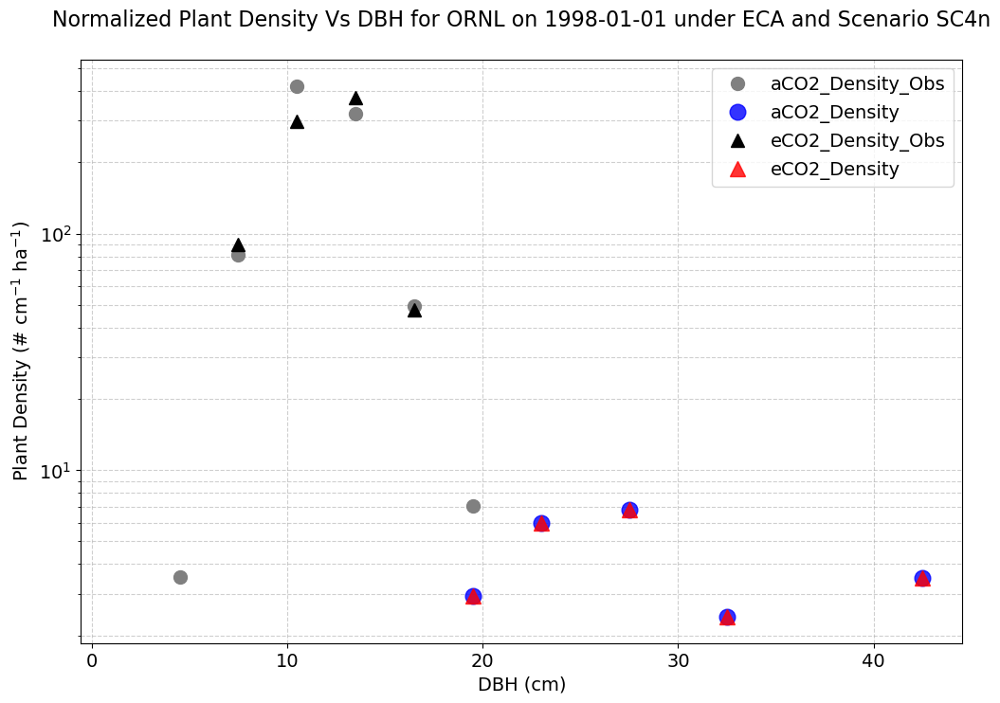

In [173]:

# Normalized

select_site = "US-ORN"
site = "ORNL"


# Area per treatment (m2)
plot_areas_m2 = {'amb': 314 * 3, 'ele': 314 * 2}  # 3 AMB plots, 2 ELE plots

# Step 1: Find the row with date nearest to 1998-07-01
target_date = pd.to_datetime(dict_time_select[site][plot_period])
grouped_reset = grouped.reset_index()
grouped_reset['ptime'] = pd.to_datetime(grouped_reset['ptime'])

# Get nearest date
nearest_idx = (grouped_reset['ptime'] - target_date).abs().idxmin()
nearest_date = grouped_reset.loc[nearest_idx, 'ptime']

# Step 2: Extract data for both AMB and ELE
counts_amb = grouped.loc[('amb', nearest_date)]
counts_ele = grouped.loc[('ele', nearest_date)]

# Convert to plants per hectare
density_obs_tmp = {}
density_obs_tmp['AMB'] = counts_amb * 10_000 / plot_areas_m2['amb']
density_obs_tmp['ELE'] = counts_ele * 10_000 / plot_areas_m2['ele']


#data_plots[case_plot][site] = {}
#data_plots_obs[site] = {}

li = 0 # for legend index
for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_case in sim_cases:
        #data_plots[case_plot][site][sim_case] = {}
        ran_twice = 0  # Flag to track execution
        plt.figure(figsize=(12,8))
        print ("fig start",sim_case)
        for var in var_names:
            #data_plots[case_plot][site][sim_case][var] = {}
            #data_plots_obs[site][var_obs] = {}
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
                    if "aCO2" in key:
                        color_line = "b"
                        marker_line = "o"
                        co2_case = "AMB"
                        tmp_case = "aCO2"
                        color_obs = "gray"
                        #data_plots_obs[site][var_obs][tmp_case] = {}
                    if "eCO2" in key:
                        color_line = "r"
                        marker_line = "^"
                        co2_case = "ELE"
                        tmp_case = "eCO2"
                        color_obs = "black"
                        #data_plots_obs[site][var_obs][tmp_case] = {}
                    if (obs_plot ==1) and (ran_twice<2):
                        Mean_DF = dict_obs_ax[site][co2_case]
                        Standard_error_DF = dict_obs_ase[site][co2_case]
                        # Extracting the relevant columns
                        # Normalized Obs density per CM DBH
                        norm_density = density_obs_tmp[co2_case].values/diff_bins
                        plt.plot(bin_means, norm_density, 
                                 color=color_obs, marker=marker_line, 
                                 linestyle='',markersize=10,
                                 label=f'{tmp_case}_Density_Obs')
                        #plt.semilogy(bin_means, density_ele.values, marker='s', label='ELE')

                        ran_twice +=1
                        # DBH size class bin
                        data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_bins"] = bin_means
                        data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_NormDensity"] = norm_density



                    if var == "FATES_NPLANT_SZ":
                        plant_density = ds[key][f"{var}"]
                        time_value =  plant_density.sel(
                            time=dict_time_select[key.split('_')[1]][f"{plot_period}"]).time
                        # selecting the PD for a specific time
                        plant_density_time = ds[key]["FATES_NPLANT_SZ"].sel(
                            time = time_value)

                        # date
                        string_date = time_value.dt.strftime('%Y-%m-%d').values

                        # Extract data
                        nplant = plant_density_time.squeeze()*10000  # n m-2 to n ha-2
                        size_classes = ds[key]["fates_levscls"].values  # Get fates_levscls values

                        valid = np.isfinite(nplant.values.flatten()) #& (nplant.values.flatten() > 0)
                        valid[-1] = False # ignore the last
                        nplant_valid = nplant.values.flatten()[valid]
                        size_classes[-1] = np.inf
                        size_classes_valid = size_classes[valid]
                        # bins
                        bin_labels_mod = [f"{size_classes[i]}-{size_classes[i+1]}" for i in range(len(size_classes)-1)]
                        bin_means_mod = [(size_classes[i] + size_classes[i+1]) / 2 for i in range(len(size_classes)-1)]
                        # Normalized Obs density per CM DBH
                        norm_density_mod = nplant_valid/diff_bins

                        plt.plot(bin_means_mod, norm_density_mod,
                                #'o-', 
                                #label="Density vs Basal Area"
                                label = tmp_case + '_'+ "Density", 
                                 color = color_line,
                                 marker = marker_line,
                                 alpha=.8, linewidth=2,
                                linestyle='',
                                markersize=12)
                        plt.yscale("log")
                        data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins"] = bin_means_mod
                        data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_NormDensity"] = norm_density_mod

                    if False:
                        print (ds[key][var].long_name )
                    plt.axhline(y = 0, color = 'k',lw=2, alpha=.02)
                    plt.grid(True, linestyle="--", alpha=0.7)  # Dashed grid lines with better visibility
                    plt.legend(fontsize=14,loc="upper right")
                    plt.ylabel(r"Plant Density (# cm$^{-1}$ ha$^{-1}$)", fontsize=14)
                    plt.xlabel(r"DBH (cm)", fontsize=14)
                    plt.xticks(fontsize=14)  # Increase x-axis tick font size
                    plt.yticks(fontsize=14)  # Increase y-axis tick font size
                    # Add ticks
                    #plt.ylim(30,1500)
                    #plt.xlim(9,20)
                    plt.grid(True, which="both", linestyle="--", alpha=0.6)
                    plt.title(f"Normalized Plant Density Vs DBH for {site} on {string_date[0]} under {sim_case} and Scenario {case_plot}\n",fontsize=16)
                    #li+=1 # for legend index updating for a site
    print ("fig end",sim_case,site)
    print (f"{path_save_results}/{var_obs}_{string_date[0].split('-')[0]}_sce_{case_plot}_{site}_{sim_case}.pdf")
    
    #plt.savefig(f"{path_save_results}/Norm{var_obs}_{string_date[0].split('-')[0]}_sce_{case_plot}_{site}_{sim_case}.pdf", format="pdf", bbox_inches="tight")
    #plt.savefig(f"{path_save_results}/Norm{var_obs}_{string_date[0].split('-')[0]}_sce_{case_plot}_{site}_{sim_case}.png", format="png", dpi =200, bbox_inches="tight")
    plt.show()
    plt.close()

#### DUKE

In [174]:
# DUKE

df = pd.read_csv(Duke_dbh_fname)
df['dbh_cm'] = np.sqrt((4 * df['BA']) / np.pi)

# --- Step 1: Clean data ---
df_clean = df.copy()

# Ensure ptime is datetime
df_clean['ptime'] = pd.to_datetime(df_clean['ptime'], errors='coerce')

# Ensure dbh_cm is numeric
df_clean['dbh_cm'] = pd.to_numeric(df_clean['dbh_cm'], errors='coerce')

# Filter for living trees
df_alive = df_clean[df_clean['die'] == False].dropna(subset=['dbh_cm', 'ptime'])

# DBH size class bins
bins = np.array([0.0, 3.0, 6.0, 9.0, 12.0, 15.0, 18.0, 21.0, 25.0, 30.0, 35.0, 50.0, np.inf])
bin_labels = [f"{bins[i]}-{bins[i+1]}" for i in range(len(bins)-1)]
bin_means = [(bins[i] + bins[i+1]) / 2 for i in range(len(bins)-1)]

# Create size_class column
df_alive['size_class'] = pd.cut(df_alive['dbh_cm'], bins=bins, labels=bin_labels, right=False)

# Drop rows where size_class is NaN (e.g., dbh_cm not in any bin)
df_alive = df_alive.dropna(subset=['size_class'])

# --- Step 3: Count number of trees per time, co2 treatment, and size class ---
grouped = df_alive.groupby(['co2', 'ptime', 'size_class']).size()

# Reshape to wide format (size_class columns)
grouped = grouped.unstack(fill_value=0)

# DUKE

diff_bins = np.diff(bins)
print (diff_bins)
print ("replacing the last one with a value of 50")
diff_bins[-1] = 50
print("diff bin size", diff_bins.size)

print ("since bins have one extra element, deleting it")
bins = bins[:-1]


print ("Now we will be ploting nplants/cm / area")

[ 3.  3.  3.  3.  3.  3.  3.  4.  5.  5. 15. inf]
replacing the last one with a value of 50
diff bin size 12
since bins have one extra element, deleting it
Now we will be ploting nplants/cm / area


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/635745076.py:30: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_alive.groupby(['co2', 'ptime', 'size_class']).size()


In [175]:
sim_cases

['COnly', 'RD', 'ECA']

fig start COnly
AA
BB
fig start RD
AA
BB
fig start ECA
AA
BB
fig end ECA DUKE
/Users/ud4/Documents/FACEMDS/Figures_Paper/Stand_Density_1996_sce_SD_DUKE_ECA.pdf


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/327628581.py:45: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/327628581.py:45: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/327628581.py:45: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/327628581.py:45: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12

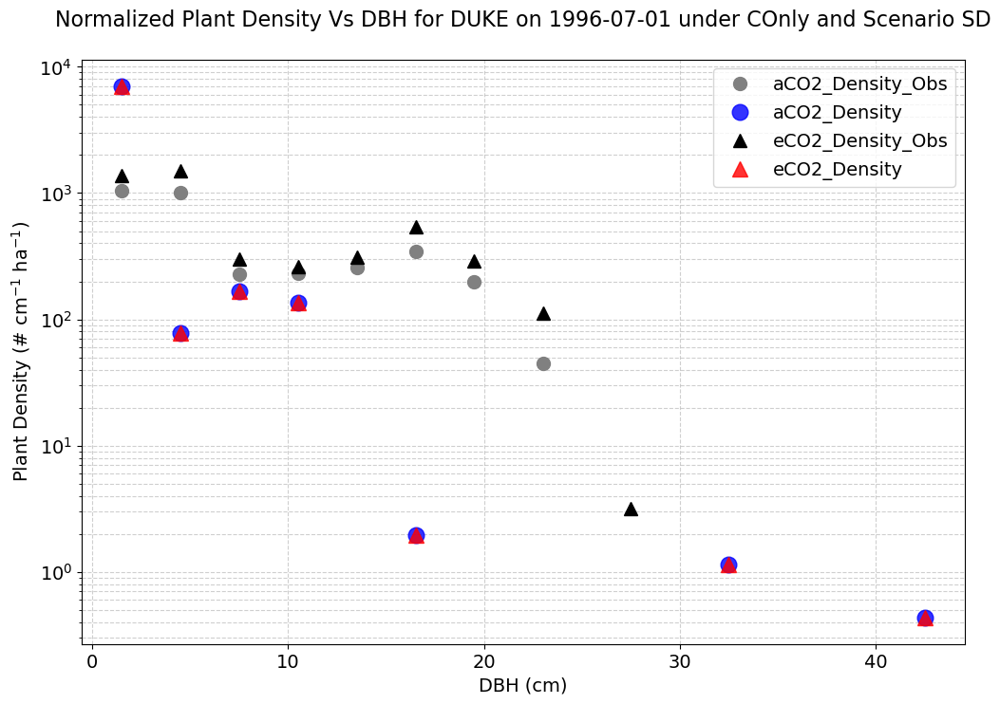

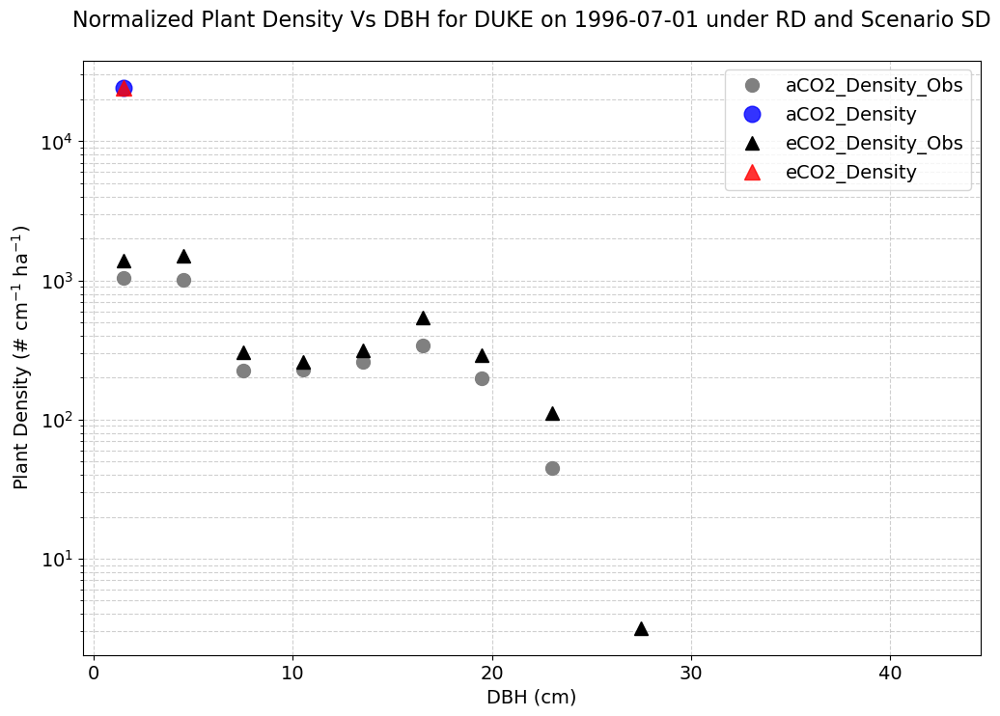

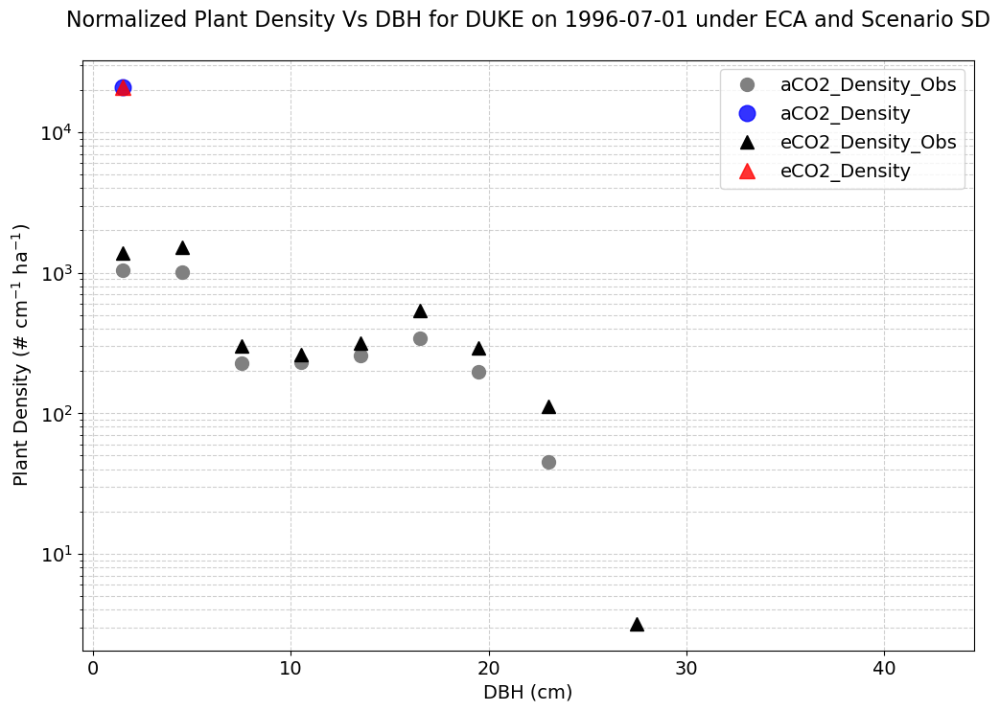

fig start COnly
AA
BB
fig start RD
AA
BB
fig start ECA
AA
BB
fig end ECA DUKE
/Users/ud4/Documents/FACEMDS/Figures_Paper/Stand_Density_1996_sce_SC4n_DUKE_ECA.pdf


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/327628581.py:45: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/327628581.py:45: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/327628581.py:45: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/327628581.py:45: FutureWarning: 'A' is deprecated and will be removed in a future version, please use 'YE' instead.
  time = pd.date_range("1998-01-01", "2008-12

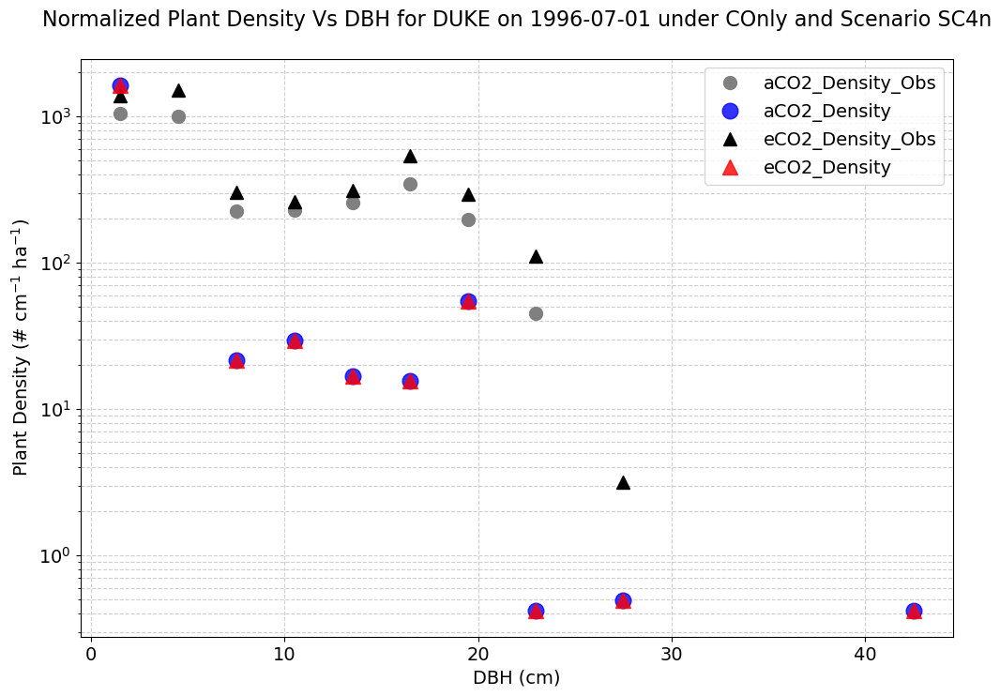

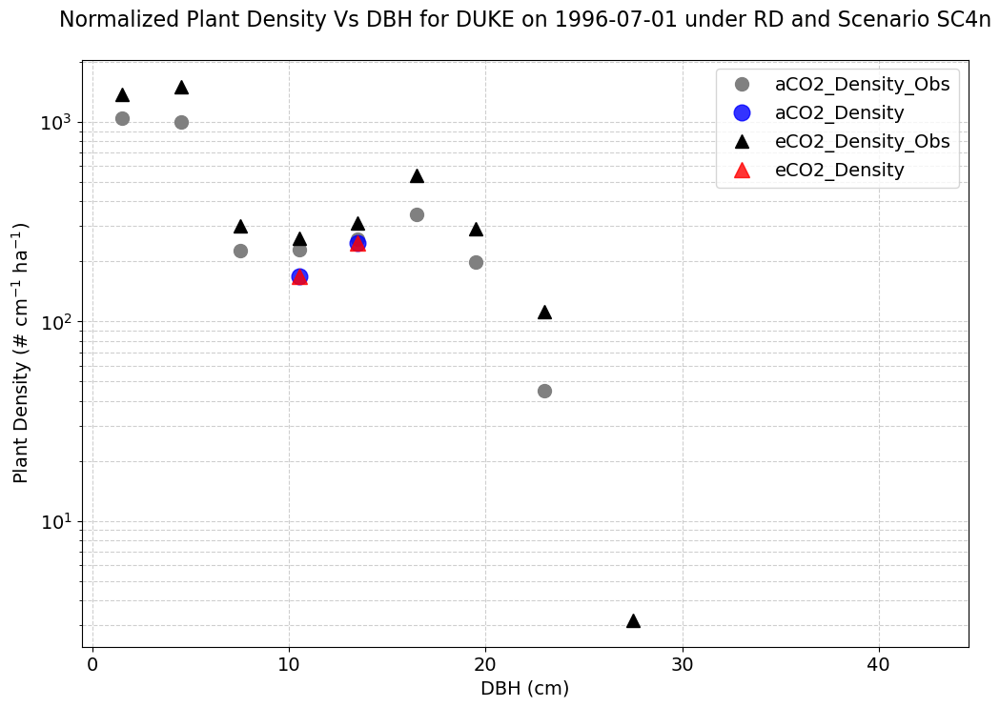

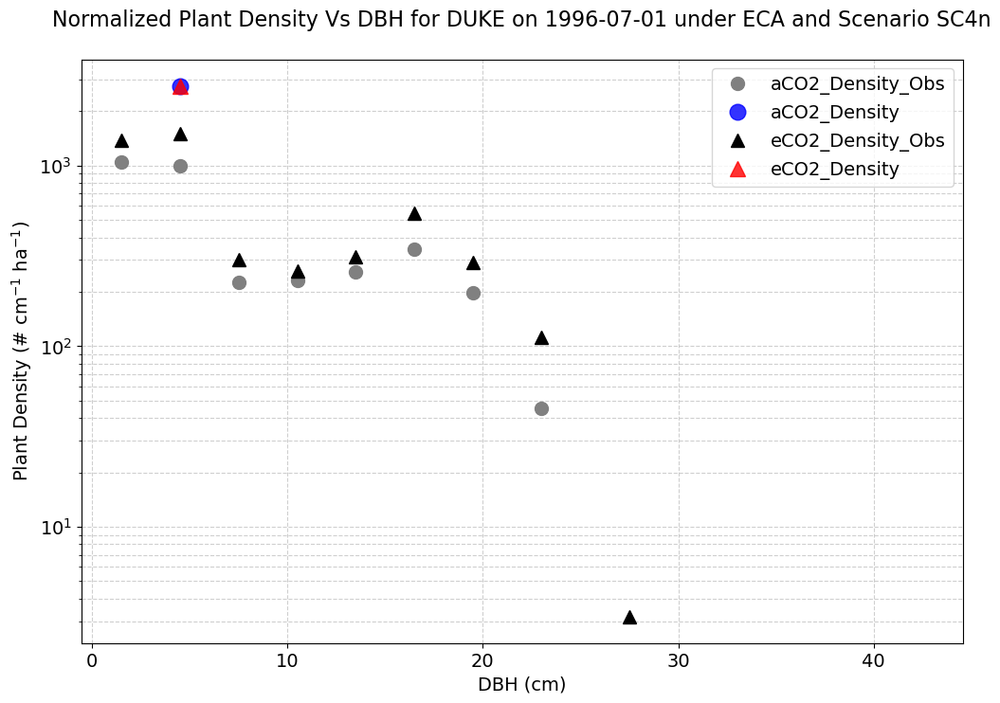

In [176]:

# Normalized

select_site = "US-DUK"
site = "DUKE"

# Area per treatment (m2)
plot_areas_m2 = {'amb': 314 * 3, 'ele': 314 * 2}  # 3 AMB plots, 2 ELE plots

# Step 1: Find the row with date nearest to 1998-07-01
target_date = pd.to_datetime(dict_time_select[site][plot_period])
grouped_reset = grouped.reset_index()
grouped_reset['ptime'] = pd.to_datetime(grouped_reset['ptime'])

# Get nearest date
nearest_idx = (grouped_reset['ptime'] - target_date).abs().idxmin()
nearest_date = grouped_reset.loc[nearest_idx, 'ptime']

# Step 2: Extract data for both AMB and ELE
counts_amb = grouped.loc[('amb', nearest_date)]
counts_ele = grouped.loc[('ele', nearest_date)]

# Convert to plants per hectare
density_obs_tmp = {}
density_obs_tmp['AMB'] = counts_amb * 10_000 / plot_areas_m2['amb']
density_obs_tmp['ELE'] = counts_ele * 10_000 / plot_areas_m2['ele']


#data_plots[case_plot][site] = {}
#data_plots_obs[site] = {}

li = 0 # for legend index
for case_idx, case_plot in enumerate(list(case_abr.keys())):
    for sim_case in sim_cases:
        #data_plots[case_plot][site][sim_case] = {}
        ran_twice = 0  # Flag to track execution
        plt.figure(figsize=(12,8))
        print ("fig start",sim_case)
        for var in var_names:
            #data_plots[case_plot][site][sim_case][var] = {}
            #data_plots_obs[site][var_obs] = {}
            for idx, key in enumerate(ds.keys()):
                if sim_case not in key:
                    continue
                if (f"{site}" in key) and (f"{case_plot}_" in key): 
                    time = pd.date_range("1998-01-01", "2008-12-31", freq="A")  # Monthly data
                    if "aCO2" in key:
                        print("AA")
                        color_line = "b"
                        marker_line = "o"
                        co2_case = "AMB"
                        tmp_case = "aCO2"
                        color_obs = "gray"
                        #data_plots_obs[site][var_obs][tmp_case] = {}
                    if "eCO2" in key:
                        print("BB")
                        color_line = "r"
                        marker_line = "^"
                        co2_case = "ELE"
                        tmp_case = "eCO2"
                        color_obs = "black"
                        #data_plots_obs[site][var_obs][tmp_case] = {}
                    if (obs_plot ==1) and (ran_twice<2):
                        Mean_DF = dict_obs_ax[site][co2_case]
                        Standard_error_DF = dict_obs_ase[site][co2_case]
                        # Extracting the relevant columns
                        # Normalized Obs density per CM DBH
                        norm_density = density_obs_tmp[co2_case].values/diff_bins
                        plt.plot(bin_means, norm_density, 
                                 color=color_obs, marker=marker_line, 
                                 linestyle='',markersize=10,
                                 label=f'{tmp_case}_Density_Obs')
                        #plt.semilogy(bin_means, density_ele.values, marker='s', label='ELE')

                        ran_twice +=1
                        # DBH size class bin
                        data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_bins"] = bin_means
                        data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_NormDensity"] = norm_density



                    if var == "FATES_NPLANT_SZ":
                        plant_density = ds[key][f"{var}"]
                        time_value =  plant_density.sel(
                            time=dict_time_select[key.split('_')[1]][f"{plot_period}"]).time
                        # selecting the PD for a specific time
                        plant_density_time = ds[key]["FATES_NPLANT_SZ"].sel(
                            time = time_value)

                        # date
                        string_date = time_value.dt.strftime('%Y-%m-%d').values

                        # Extract data
                        nplant = plant_density_time.squeeze()*10000  # n m-2 to n ha-2
                        size_classes = ds[key]["fates_levscls"].values  # Get fates_levscls values

                        valid = np.isfinite(nplant.values.flatten()) #& (nplant.values.flatten() > 0)
                        valid[-1] = False # ignore the last
                        nplant_valid = nplant.values.flatten()[valid]
                        size_classes[-1] = np.inf
                        size_classes_valid = size_classes[valid]
                        # bins
                        bin_labels_mod = [f"{size_classes[i]}-{size_classes[i+1]}" for i in range(len(size_classes)-1)]
                        bin_means_mod = [(size_classes[i] + size_classes[i+1]) / 2 for i in range(len(size_classes)-1)]
                        # Normalized Obs density per CM DBH
                        norm_density_mod = nplant_valid/diff_bins

                        plt.plot(bin_means_mod, norm_density_mod,
                                #'o-', 
                                #label="Density vs Basal Area"
                                label = tmp_case + '_'+ "Density", 
                                 color = color_line,
                                 marker = marker_line,
                                 alpha=.8, linewidth=2,
                                linestyle='',
                                markersize=12)
                        plt.yscale("log")
                        data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins"] = bin_means_mod
                        data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_NormDensity"] = norm_density_mod

                    if False:
                        print (ds[key][var].long_name )
                    plt.axhline(y = 0, color = 'k',lw=2, alpha=.02)
                    plt.grid(True, linestyle="--", alpha=0.7)  # Dashed grid lines with better visibility
                    plt.legend(fontsize=14,loc="upper right")
                    plt.ylabel(r"Plant Density (# cm$^{-1}$ ha$^{-1}$)", fontsize=14)
                    plt.xlabel(r"DBH (cm)", fontsize=14)
                    plt.xticks(fontsize=14)  # Increase x-axis tick font size
                    plt.yticks(fontsize=14)  # Increase y-axis tick font size
                    # Add ticks
                    #plt.ylim(30,1500)
                    #plt.xlim(9,20)
                    plt.grid(True, which="both", linestyle="--", alpha=0.6)
                    plt.title(f"Normalized Plant Density Vs DBH for {site} on {string_date[0]} under {sim_case} and Scenario {case_plot}\n",fontsize=16)
                    #li+=1 # for legend index updating for a site
    print ("fig end",sim_case,site)
    print (f"{path_save_results}/{var_obs}_{string_date[0].split('-')[0]}_sce_{case_plot}_{site}_{sim_case}.pdf")
    
    #plt.savefig(f"{path_save_results}/Norm{var_obs}_{string_date[0].split('-')[0]}_sce_{case_plot}_{site}_{sim_case}.pdf", format="pdf", bbox_inches="tight")
    #plt.savefig(f"{path_save_results}/Norm{var_obs}_{string_date[0].split('-')[0]}_sce_{case_plot}_{site}_{sim_case}.png", format="png", dpi =200, bbox_inches="tight")
    plt.show()
    plt.close()

### Combined plot

/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/4133300857.py:129: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0,j].set_ylim(ylim_variable)
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/4133300857.py:130: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1,j].set_ylim(ylim_response)


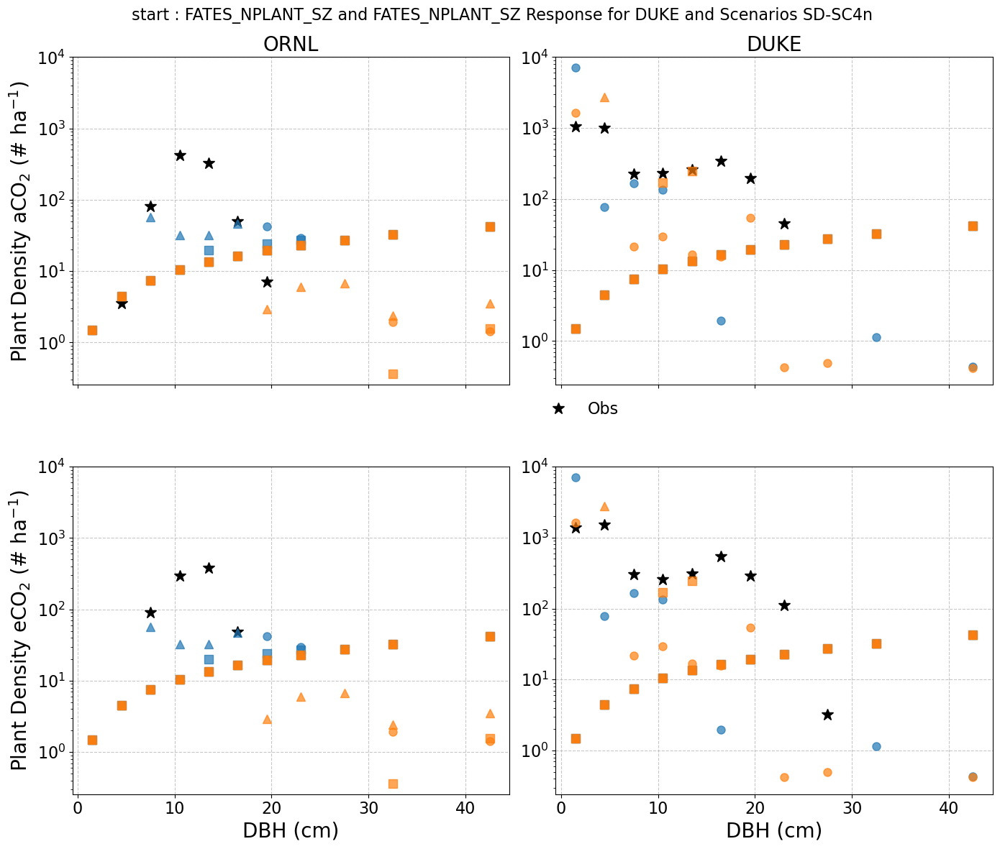

In [177]:
# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "Stand_Density"
var_model = "FATES_NPLANT_SZ"

ornl = data_plot_A[site][var_obs]
co2_case = "AMB"
ax[0,0].plot(data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_bins"], 
             data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_NormDensity"], 
            label=f'Obs_{co2_case}', 
             markersize=tmp_markersize+4,
             marker='*',
             linestyle='',
             color='k', lw=2)

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.split('_')[2].startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[3]
    if co2_case not in model_key: continue
    ax[0,0].plot( data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins"], 
                 values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)
    ax[0,0].set_yscale("log")

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

ornl = data_plot_A[site][var_obs]
ax[0,1].plot(data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_bins"], 
             data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_NormDensity"], 
            label=f'Obs_{co2_case}', 
             markersize=tmp_markersize+4,
             marker='*',
             linestyle='',
             color='k', lw=2)

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.split('_')[2].startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[3]
    if co2_case not in model_key: continue
    ax[0,1].plot( data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins"], 
                 values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)
    ax[0,1].set_yscale("log")
    
# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_A[site][var_obs]
co2_case = "ELE"
ax[1,0].plot(data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_bins"], 
             data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_NormDensity"], 
            label=f'Obs_{co2_case}', 
             markersize=tmp_markersize+4,
             marker='*',
             linestyle='',
             color='k', lw=2)
# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.split('_')[2].startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[3]
    if co2_case not in model_key: continue
    ax[1,0].plot( data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins"], 
                 values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)
    ax[1,0].set_yscale("log")

# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_bins"], 
             data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_NormDensity"], 
            label=f'Obs_{co2_case}', 
             markersize=tmp_markersize+4,
             marker='*',

             linestyle='',
             color='k', lw=2)

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.split('_')[2].startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[3]
    if co2_case not in model_key: continue
    ax[1,1].plot( data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins"], 
                 values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)
    ax[1,1].set_yscale("log")


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('DBH (cm)', fontsize=fsize_labels)
        #ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(r"Plant Density aCO$_2$ (# ha$^{-1}$) ", fontsize=fsize_labels)  
ax[1,0].set_ylabel(r"Plant Density eCO$_2$ (# ha$^{-1}$)", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
# Get handles and labels from subplot
handles, labels = ax[1, 0].get_legend_handles_labels()

# Map of original labels to desired display names
label_map = {
    'Obs_ELE': 'Obs',
    'end_ELE_SD_COnly_NormDensity': 'SD_COnly',
    'end_ELE_SD_RD_NormDensity': 'SD_RD',
    'end_ELE_SD_ECA_NormDensity': 'SD_ECA',
    'end_ELE_SC4n_COnly_NormDensity': 'SC4n_COnly',
    'end_ELE_SC4n_RD_NormDensity': 'SC4n_RD',
    'end_ELE_SC4n_ECA_NormDensity': 'SC4n_ECA',
}

# Filter and rename
filtered = [(h, label_map[l]) for h, l in zip(handles, labels) if l in label_map]
filtered_handles, filtered_labels = zip(*filtered)

fig.legend(
    filtered_handles, filtered_labels,
    loc='upper center',
    bbox_to_anchor=(0.58, .54),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for the legend
fig.subplots_adjust(hspace=0.25)  # increase vertical space between rows
#plt.ylim(ylim_response)
fig.suptitle(
    f" {plot_period} : {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)

plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

### Combined plot Rev

In [178]:
plot_period

'start'

ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins
ORNL FATES_NPLANT_SZ start_AMB_SC4n_ECA_bins


/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2036578546.py:134: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0,j].set_ylim(ylim_variable)
/var/folders/f1/01gxw8vn74q_x_rf_p5ztryjr405zq/T/ipykernel_28245/2036578546.py:135: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1,j].set_ylim(ylim_response)


/Users/ud4/Documents/FACEMDS/Figures_Paper/CombinedPlots/Fig_FATES_NPLANT_SZ_SDvsSC4n_start_rev.pdf


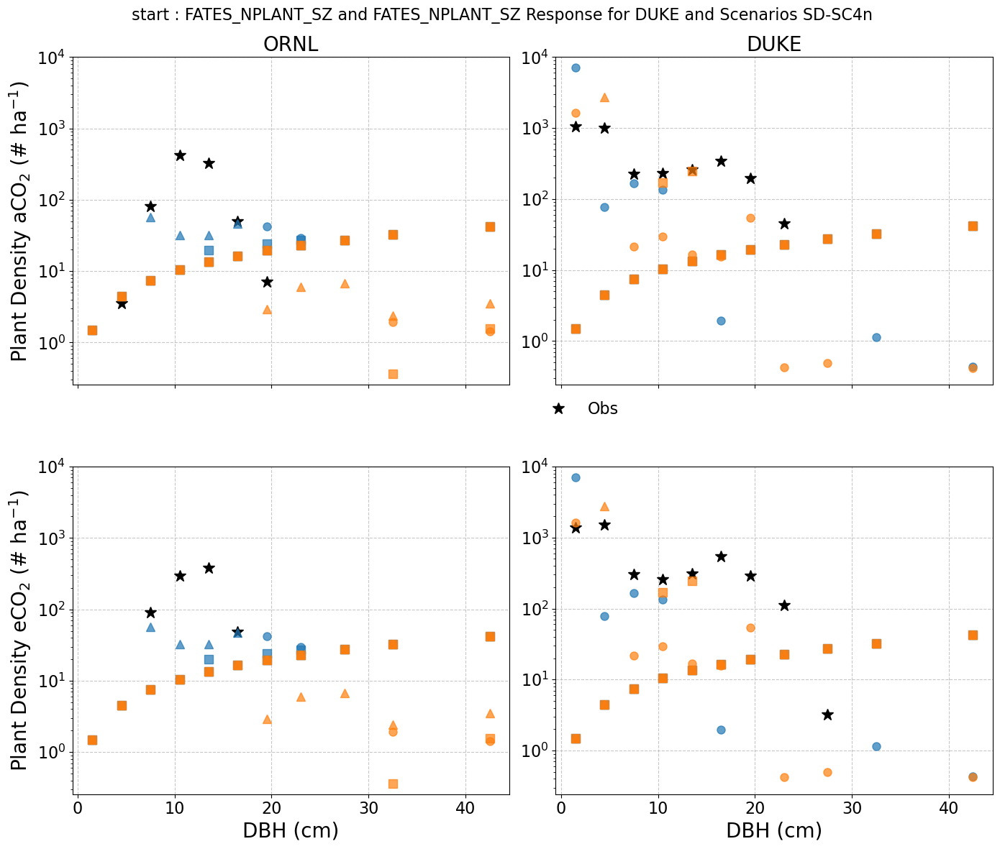

In [179]:
# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "Stand_Density"
var_model = "FATES_NPLANT_SZ"

ornl = data_plot_A[site][var_obs]
co2_case = "AMB"
ax[0,0].plot(data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_bins"], 
             data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_NormDensity"], 
            label=f'Obs_{co2_case}', 
             markersize=tmp_markersize+4,
             marker='*',
             linestyle='',
             color='k', lw=2)

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.split('_')[2].startswith('SD') else f'{list(case_abr.keys())[-1]}'
    #if family == 'SD' : continue
    model_type = model_key.split('_')[3]
    if co2_case not in model_key: continue
    ax[0,0].plot( data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins"], 
                 values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)
    ax[0,0].set_yscale("log")
    print (site,var,f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins")

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"

ornl = data_plot_A[site][var_obs]
ax[0,1].plot(data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_bins"], 
             data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_NormDensity"], 
            label=f'Obs_{co2_case}', 
             markersize=tmp_markersize+4,
             marker='*',
             linestyle='',
             color='k', lw=2)

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.split('_')[2].startswith('SD') else f'{list(case_abr.keys())[-1]}'
    #if family == 'SD' : continue
    model_type = model_key.split('_')[3]
    if co2_case not in model_key: continue
    ax[0,1].plot( data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins"], 
                 values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)
    ax[0,1].set_yscale("log")
    
# ========== ORNL PLOT (Bottom LEFT) ==========

site = "ORNL"

ornl = data_plot_A[site][var_obs]
co2_case = "ELE"
ax[1,0].plot(data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_bins"], 
             data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_NormDensity"], 
            label=f'Obs_{co2_case}', 
             markersize=tmp_markersize+4,
             marker='*',
             linestyle='',
             color='k', lw=2)
# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.split('_')[2].startswith('SD') else f'{list(case_abr.keys())[-1]}'
    #if family == 'SD' : continue
    model_type = model_key.split('_')[3]
    if co2_case not in model_key: continue
    ax[1,0].plot( data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins"], 
                 values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)
    ax[1,0].set_yscale("log")

# ========== DUKE PLOT (Bottom RIGHT) ==========
site = "DUKE"

# Check if Duke has data
duke = data_plot_R[site][var_obs]
ax[1,1].plot(data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_bins"], 
             data_plot_A [site][var_obs][f"{plot_period}_{co2_case}_NormDensity"], 
            label=f'Obs_{co2_case}', 
             markersize=tmp_markersize+4,
             marker='*',

             linestyle='',
             color='k', lw=2)

# Plot all ORNL models
for model_key, values in data_plot_A[site][var_model].items():
    # Determine model family and type
    family = 'SD' if model_key.split('_')[2].startswith('SD') else f'{list(case_abr.keys())[-1]}'
    #if family == 'SD' : continue
    model_type = model_key.split('_')[3]
    if co2_case not in model_key: continue
    ax[1,1].plot( data_plot_A [site][var][f"{plot_period}_{co2_case}_{case_plot}_{sim_case}_bins"], 
                 values,
                 color=model_colors[family],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=model_key)
    ax[1,1].set_yscale("log")


for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        ax[0,j].set_ylim(ylim_variable)
        ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('DBH (cm)', fontsize=fsize_labels)
        #ax[i,1].set_yticklabels([]) # hiding y labels

        
    
ax[0,0].set_ylabel(r"Plant Density aCO$_2$ (# ha$^{-1}$) ", fontsize=fsize_labels)  
ax[1,0].set_ylabel(r"Plant Density eCO$_2$ (# ha$^{-1}$)", fontsize=fsize_labels)
ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

handles, labels = ax[1,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
# Get handles and labels from subplot
handles, labels = ax[1, 0].get_legend_handles_labels()

# Map of original labels to desired display names
label_map = {
    'Obs_ELE': 'Obs',
    'end_ELE_SD_COnly_NormDensity': 'Regrow-def_COnly',
    'end_ELE_SD_RD_NormDensity': 'Regrow-def_RD',
    'end_ELE_SD_ECA_NormDensity': 'Regrow-def_ECA',
    'end_ELE_SC4n_COnly_NormDensity': 'Regrow-cal_COnly',
    'end_ELE_SC4n_RD_NormDensity': 'Regrow-cal_RD',
    'end_ELE_SC4n_ECA_NormDensity': 'Regrow-cal_ECA',
}

# Filter and rename
filtered = [(h, label_map[l]) for h, l in zip(handles, labels) if l in label_map]
filtered_handles, filtered_labels = zip(*filtered)

fig.legend(
    filtered_handles, filtered_labels,
    loc='upper center',
    bbox_to_anchor=(0.58, .54),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for the legend
fig.subplots_adjust(hspace=0.25)  # increase vertical space between rows
#plt.ylim(ylim_response)
fig.suptitle(
    f" {plot_period} : {var} and {var} Response for {site} and Scenarios {'-'.join(list(case_abr.keys()))}\n",
    fontsize=16,
)

plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}_rev.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}_rev.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
print (f"{path_save_results}/CombinedPlots/Fig_{var}_SDvs{list(case_abr.keys())[-1]}_{plot_period}_rev.pdf")

# revised figs

## R1. Revised AW Fig 1
figure 1 should just be non-calibrated results. To pack everything in on one set of panels you could show ambient and elevated on the same panel, then have one panel per site, per variable. So you could show BP, Nup, Biomass at Duke and ORNL in a 2 x 3 set of panels. 


colorblind friendly colors: <br>
https://davidmathlogic.com/colorblind/#%23D81B60-%231E88E5-%23FFC107-%23004D40

In [75]:
case_colors = {'AMB': '#1f77b4', 'ELE': '#ff7f0e', 'Resp':'#9400D3'}  # Blue for AMB, Orange for ELE
model_markers = {'COnly': 'o', 'RD': 's', 'ECA': '^'}  # Circle, Square, Triangle

fsize_legend = 20
fsize_ticks = 16
fsize_labels = 20

#combined plot
tmp_markersize=8
tmp_alpha = 0.5

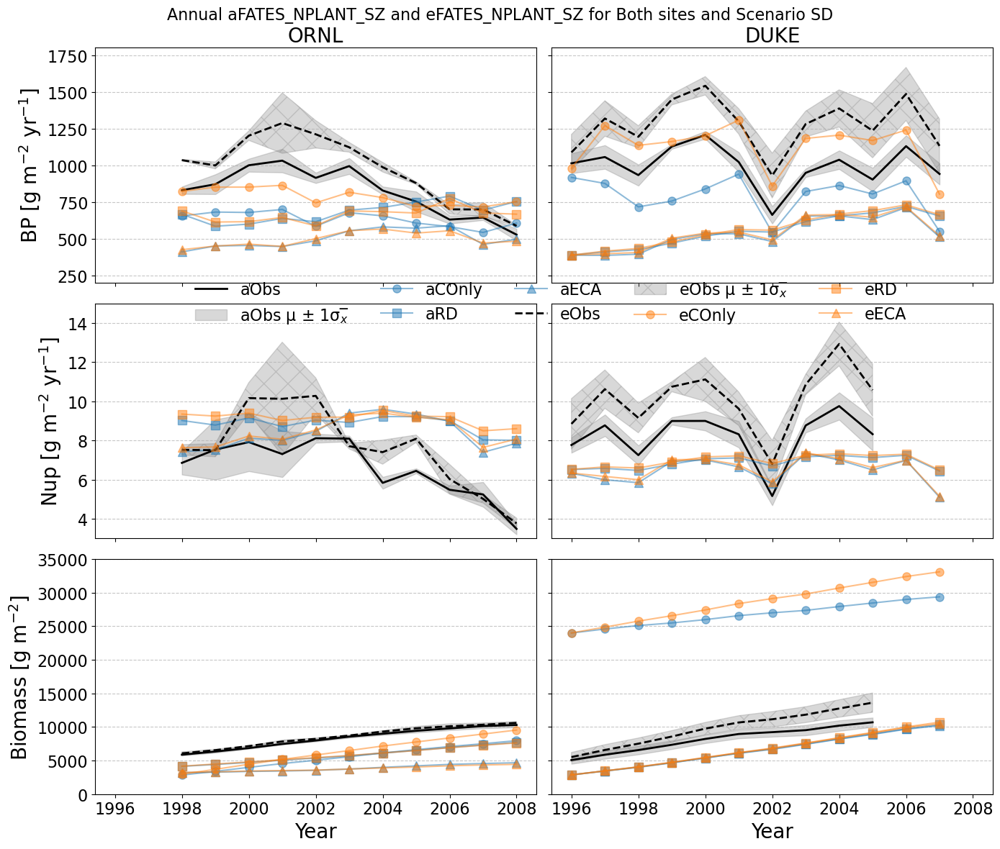

In [76]:

# Create figure with subplots
fig, ax = plt.subplots(3, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "NPP"
var_model = "NPP_Growth"
var_label_text = "BP"

ylim_variable = (200,1800)
ornl = PlotData_A [f'{site}'][f'{var_obs}']

p_loc = (0,0)
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (0,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")

ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

# ========== ORNL PLOT (Middle LEFT) ==========
site = "ORNL"
var_obs = "NUP"
var_model = "NUP_model"
var_label_text = "Nup"
ylim_variable = (3,15)

p_loc = (1,0)

ornl = PlotData_A [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')
ax[p_loc].set_ylim(ylim_variable)
# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (1,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

# ========== ORNL PLOT (Lower LEFT) ==========

site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC_plus_MORT"
var_label_text = "Biomass"
ylim_variable = (0,35000)

p_loc = (2,0)

ornl = PlotData_A [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')
ax[p_loc].set_ylim(ylim_variable)
# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (2,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

for i in range (3):
    for j in range(2):
        ax[i,j].grid(True, axis='y', linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        #ax[1,j].set_ylim(ylim_response)
        ax[2,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    

ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[0,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.55, .68),  # Centered above both axes
    ncol=5,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend
plt.axhline(y=0, color="k", lw=2, alpha=0.02)

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual a{var} and e{var} for Both sites and Scenario SD\n",
    fontsize=16,
)

plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_1.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_1.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

# Text description of the figure
description = """
Comment from AW:
- figure 1 should just be non-calibrated results. 
- To pack everything in on one set of panels you could show ambient and elevated on the same panel, 
- then have one panel per site, per variable. So you could show 
- BP, Nup, Biomass at Duke and ORNL in a 2 x 3 set of panels. 

Description for Fig_1:
- Top pannel: NPP Alloc
- Middle: Nup
- Bottom: AGB+Mort

Questions for Fig 1:
- Biomass: should I ignore Conly Duke for the plotting purpose?
"""

# Save the description as a text file at the same location
with open(f"{path_save_results}/RevisedAWplots/Fig_1_description.txt", "w") as file:
    file.write(description)


## R1. Revised AW Fig 2
Fig 2 can be the same but with calibrated parameters

skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA


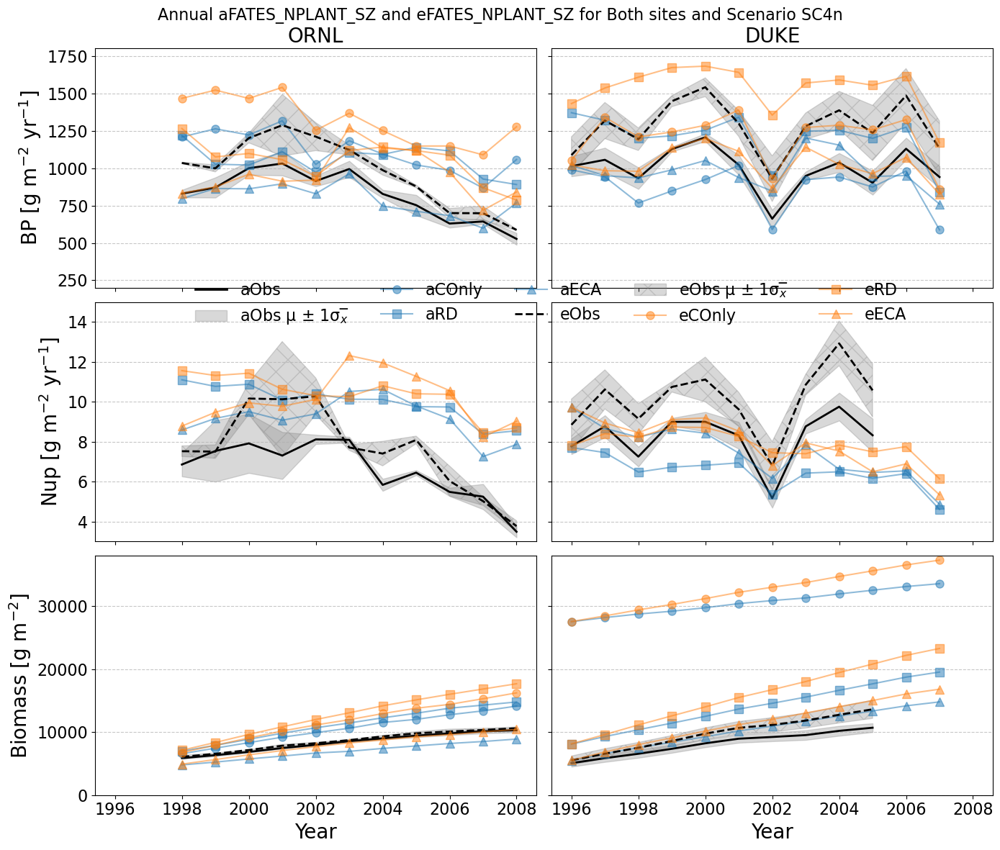

In [77]:

# Create figure with subplots
fig, ax = plt.subplots(3, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "NPP"
var_model = "NPP_Growth"
var_label_text = "BP"

ylim_variable = (200,1800)
ornl = PlotData_A [f'{site}'][f'{var_obs}']

p_loc = (0,0)
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (0,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")

ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

# ========== ORNL PLOT (Middle LEFT) ==========
site = "ORNL"
var_obs = "NUP"
var_model = "NUP_model"
var_label_text = "Nup"
ylim_variable = (3,15)

p_loc = (1,0)

ornl = PlotData_A [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')
ax[p_loc].set_ylim(ylim_variable)
# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (1,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

# ========== ORNL PLOT (Lower LEFT) ==========

site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC_plus_MORT"
var_label_text = "Biomass"
ylim_variable = (0,38000)

p_loc = (2,0)

ornl = PlotData_A [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')
ax[p_loc].set_ylim(ylim_variable)
# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (2,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

for i in range (3):
    for j in range(2):
        ax[i,j].grid(True, axis='y', linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        #ax[1,j].set_ylim(ylim_response)
        ax[2,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    

ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[0,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.55, .68),  # Centered above both axes
    ncol=5,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend
plt.axhline(y=0, color="k", lw=2, alpha=0.02)

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual a{var} and e{var} for Both sites and Scenario SC4n\n",
    fontsize=16,
)

plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_2.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_2.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

# Text description of the figure
description = """
Comment from AW:
- Fig 2 can be the same but with calibrated parameters 

Description for Fig_2:
- Top pannel: NPP Alloc
- Middle: Nup
- Bottom: AGB+Mort

Questions for Fig 2:
- Biomass: should I ignore Conly Duke for the plotting purpose?
"""

# Save the description as a text file at the same location
with open(f"{path_save_results}/RevisedAWplots/Fig_2_description.txt", "w") as file:
    file.write(description)


## R1. Revised AW Fig 3
Fig 3 can be the posterior param PDFs

In [78]:
path_UQ = r"/Users/ud4/Library/CloudStorage/GoogleDrive-bharat.sharma.neu@gmail.com/My Drive/Documents/PostDocORNL/Papers/Sharma_Walker_ORNL_Papers/Evaluation_Paper_Dir/Simulation_Related/OLMT_Calibration/Plots/UQ_output/"
cases = ['FACE_r250430_enReCal_Fxd2bl_RD_US-ORN_I20TRELMFATES_aCO2',
         'FACE_r250430_enReCal_Fxd2bl_ECA_US-ORN_I20TRELMFATES_aCO2',
         'FACE_r250430_enReCal_Fxd2bl_RD_US-DUK_I20TRELMFATES_aCO2',
         'FACE_r250430_enReCal_Fxd2bl_ECA_US-DUK_I20TRELMFATES_aCO2']
         
path_case = f"{path_UQ}{cases[0]}/MCMC_output/"

In [79]:

# Define paths and cases
path_UQ = r"/Users/ud4/Library/CloudStorage/GoogleDrive-bharat.sharma.neu@gmail.com/My Drive/Documents/PostDocORNL/Papers/Sharma_Walker_ORNL_Papers/Evaluation_Paper_Dir/Simulation_Related/OLMT_Calibration/Plots/UQ_output/"
cases = [
    'FACE_r250430_enReCal_Fxd2bl_RD_US-ORN_I20TRELMFATES_aCO2',
    'FACE_r250430_enReCal_Fxd2bl_ECA_US-ORN_I20TRELMFATES_aCO2',
    'FACE_r250430_enReCal_Fxd2bl_RD_US-DUK_I20TRELMFATES_aCO2',
    'FACE_r250430_enReCal_Fxd2bl_ECA_US-DUK_I20TRELMFATES_aCO2'
]

# Loop through each case
for case in cases:
    path_case = os.path.join(path_UQ, case, "MCMC_output")
    
    # Define file paths
    mcmc_chain_path = os.path.join(path_case, "MCMC_chain.txt")
    parms_best_path = os.path.join(path_case, "parms_best.txt")
    
    # Read MCMC_chain.txt
    mcmc_data = pd.read_csv(mcmc_chain_path, sep=r'\s+', header=None)
    num_params = mcmc_data.shape[1]
    
    # Read parms_best.txt
    with open(parms_best_path, "r") as f:
        lines = f.readlines()
        param_names = []
        param_best_values = []
        for line in lines:
            values = line.strip().split()
            if len(values) >= 2:  # Handle lines with at least two values
                name, best_value = values[0], values[2]
                print (name, best_value)
                param_names.append(name)
                try:
                    param_best_values.append(float(best_value))
                except ValueError:
                    print(f"Skipping line with non-numeric best value: {line}")
            else:
                print(f"Skipping badly formatted line: {line}")

    # Ensure the number of parameters matches
    assert num_params == len(param_names), f"Number of parameters in MCMC_chain.txt ({num_params}) does not match parms_best.txt ({len(param_names)})"
    
    # Create a 2x2 plot for the probability distribution of parameters
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))
    axes = axes.ravel()  # Flatten the 2D axes array for easy iteration
    
    for i, ax in enumerate(axes):
        if i < num_params:  # Only plot for the number of available parameters
            ax.hist(mcmc_data[i],bins=25,alpha=0.7, edgecolor="black")
            
            if param_best_values[i]<1:
                ax.axvline(param_best_values[i], color="red", linestyle="--", label=f"Best: {param_best_values[i]:.2e}")
            else:
                ax.axvline(param_best_values[i], color="red", linestyle="--", label=f"Best: {param_best_values[i]:.2f}")
            ax.set_title(param_names[i])
            ax.legend()
            if i%2==0:
                ax.set_ylabel("Probability Density")
            
        else:
            ax.axis("off")  # Hide any unused subplot

        
    # Adjust layout and save the plot
    plt.tight_layout()
    plot_file = os.path.join(path_save_results,"RevisedAWplots/", f"{case}_pdf.png")
    plt.savefig(plot_file)
    plt.close()
    
    print(f"Saved parameter distribution plots for {case} at: {plot_file}")


fates_maintresp_leaf_ryan1991_baserate 1.1412449551500231e-07
fates_maintresp_nonleaf_baserate 1.9266264787428327e-06
fates_cnp_store_ovrflw_frac 10.860663149062836
fates_cnp_vmax_nh4 7.180646175581468e-08
Saved parameter distribution plots for FACE_r250430_enReCal_Fxd2bl_RD_US-ORN_I20TRELMFATES_aCO2 at: /Users/ud4/Documents/FACEMDS/Figures_Paper/RevisedAWplots/FACE_r250430_enReCal_Fxd2bl_RD_US-ORN_I20TRELMFATES_aCO2_pdf.png
fates_maintresp_leaf_ryan1991_baserate 2.813094503648953e-06
fates_maintresp_nonleaf_baserate 3.2651006944827805e-06
fates_cnp_store_ovrflw_frac 9.071606816089398
fates_cnp_vmax_nh4 1.4997818559197608e-05
Saved parameter distribution plots for FACE_r250430_enReCal_Fxd2bl_ECA_US-ORN_I20TRELMFATES_aCO2 at: /Users/ud4/Documents/FACEMDS/Figures_Paper/RevisedAWplots/FACE_r250430_enReCal_Fxd2bl_ECA_US-ORN_I20TRELMFATES_aCO2_pdf.png
fates_maintresp_leaf_ryan1991_baserate 1.0698352933622262e-07
fates_maintresp_nonleaf_baserate 3.7189607110633278e-06
fates_cnp_store_ovrflw_

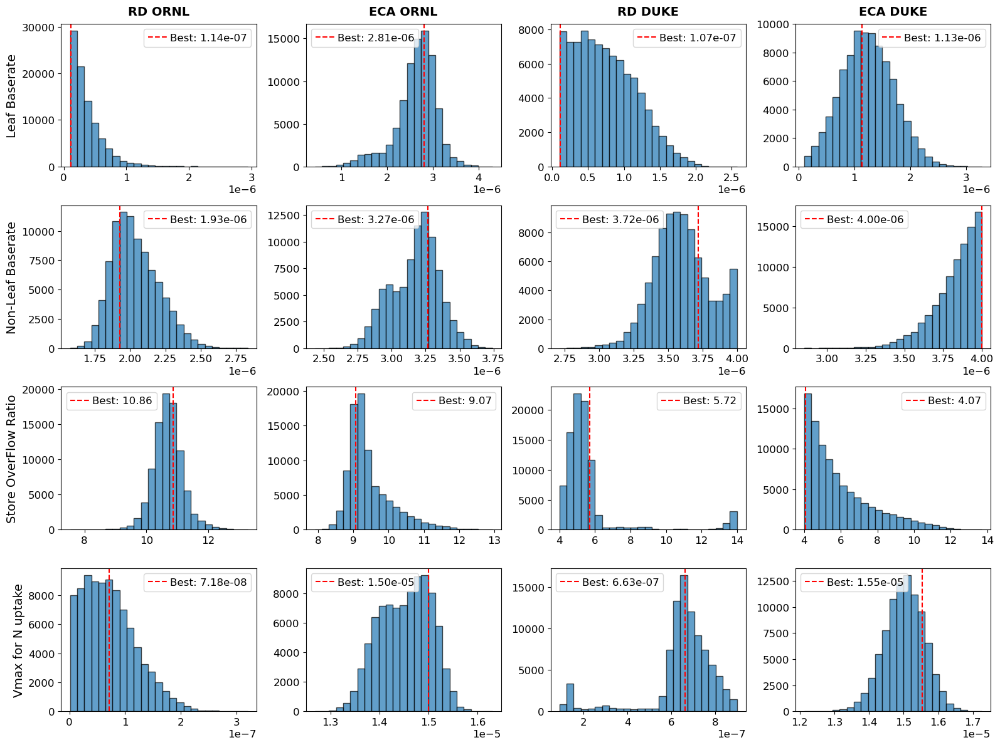

Saved updated parameter distribution plot with labeled axes and titles at: /Users/ud4/Documents/FACEMDS/Figures_Paper/RevisedAWplots/Fig_3_PDFs


In [80]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define paths and cases
path_UQ = r"/Users/ud4/Library/CloudStorage/GoogleDrive-bharat.sharma.neu@gmail.com/My Drive/Documents/PostDocORNL/Papers/Sharma_Walker_ORNL_Papers/Evaluation_Paper_Dir/Simulation_Related/OLMT_Calibration/Plots/UQ_output/"
cases = [
    'FACE_r250430_enReCal_Fxd2bl_RD_US-ORN_I20TRELMFATES_aCO2',
    'FACE_r250430_enReCal_Fxd2bl_ECA_US-ORN_I20TRELMFATES_aCO2',
    'FACE_r250430_enReCal_Fxd2bl_RD_US-DUK_I20TRELMFATES_aCO2',
    'FACE_r250430_enReCal_Fxd2bl_ECA_US-DUK_I20TRELMFATES_aCO2'
]

# Custom parameter names for the rows
parameter_labels = ["Leaf Baserate", "Non-Leaf Baserate", "Store OverFlow Ratio", "Vmax for N uptake"]

# Custom titles for the top row
case_titles = ["RD ORNL", "ECA ORNL", "RD DUKE", "ECA DUKE"]

# Loop to determine the maximum number of parameters across all cases
max_params = len(parameter_labels)

# Create a figure with rows = unique parameters and columns = cases
num_cases = len(cases)
fig, axes = plt.subplots(nrows=max_params, ncols=num_cases, figsize=(4 * num_cases, 3 * max_params))
axes = axes if max_params > 1 else [axes]  # Ensure axes is always iterable as a 2D structure

# Loop through each case and plot
for col_idx, case in enumerate(cases):
    path_case = os.path.join(path_UQ, case, "MCMC_output")
    
    # Define file paths
    mcmc_chain_path = os.path.join(path_case, "MCMC_chain.txt")
    parms_best_path = os.path.join(path_case, "parms_best.txt")
    
    # Read MCMC_chain.txt
    mcmc_data = pd.read_csv(mcmc_chain_path, sep=r'\s+', header=None)
    num_params = mcmc_data.shape[1]
    
    # Read parms_best.txt
    with open(parms_best_path, "r") as f:
        lines = f.readlines()
        param_names = []
        param_best_values = []
        for line in lines:
            values = line.strip().split()
            if len(values) >= 2:  # Handle lines with at least two values
                name, best_value = values[0], values[2]
                param_names.append(name)
                try:
                    param_best_values.append(float(best_value))
                except ValueError:
                    print(f"Skipping line with non-numeric best value: {line}")
            else:
                print(f"Skipping badly formatted line: {line}")

    # Plot each parameter (row for parameters in the current case's column)
    for row_idx in range(max_params):
        ax = axes[row_idx][col_idx]
        ax.tick_params(axis='both', labelsize=12)
        ax.yaxis.get_offset_text().set_fontsize(12)
        ax.xaxis.get_offset_text().set_fontsize(12)
        if row_idx < num_params:
            ax.hist(mcmc_data[row_idx], bins=25, alpha=0.7, edgecolor="black")
            if param_best_values[row_idx] < 1:
                ax.axvline(param_best_values[row_idx], color="red", linestyle="--", label=f"Best: {param_best_values[row_idx]:.2e}")
            else:
                ax.axvline(param_best_values[row_idx], color="red", linestyle="--", label=f"Best: {param_best_values[row_idx]:.2f}")
            
            # Add Y-axis labels
            if col_idx == 0:  # Only for the first column
                ax.set_ylabel(parameter_labels[row_idx], fontsize=14)

            ax.legend(fontsize=12,
                    columnspacing=0.65,
                    handletextpad=0.3,
                    handlelength=1.8,
                     )
        else:
            ax.axis("off")  # Hide unused subplots in a row

        # Add titles for only the top row
        if row_idx == 0:
            ax.set_title(case_titles[col_idx], fontsize=14, fontweight="bold", pad=10)
            

# Adjust layout and save the combined plot
plt.tight_layout()
output_file = os.path.join(path_save_results, "RevisedAWplots", "Fig_3_PDFs")
plt.savefig(f"{output_file}.pdf",
            format="pdf",
            bbox_inches="tight",)
plt.savefig(f"{output_file}.png",
            format="png",
            dpi=200,
            bbox_inches="tight",)
plt.show()

print(f"Saved updated parameter distribution plot with labeled axes and titles at: {output_file}")


## R1. Revised AW Fig 4

Fig 4 can just be the response plots from most of your existing figures

skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA


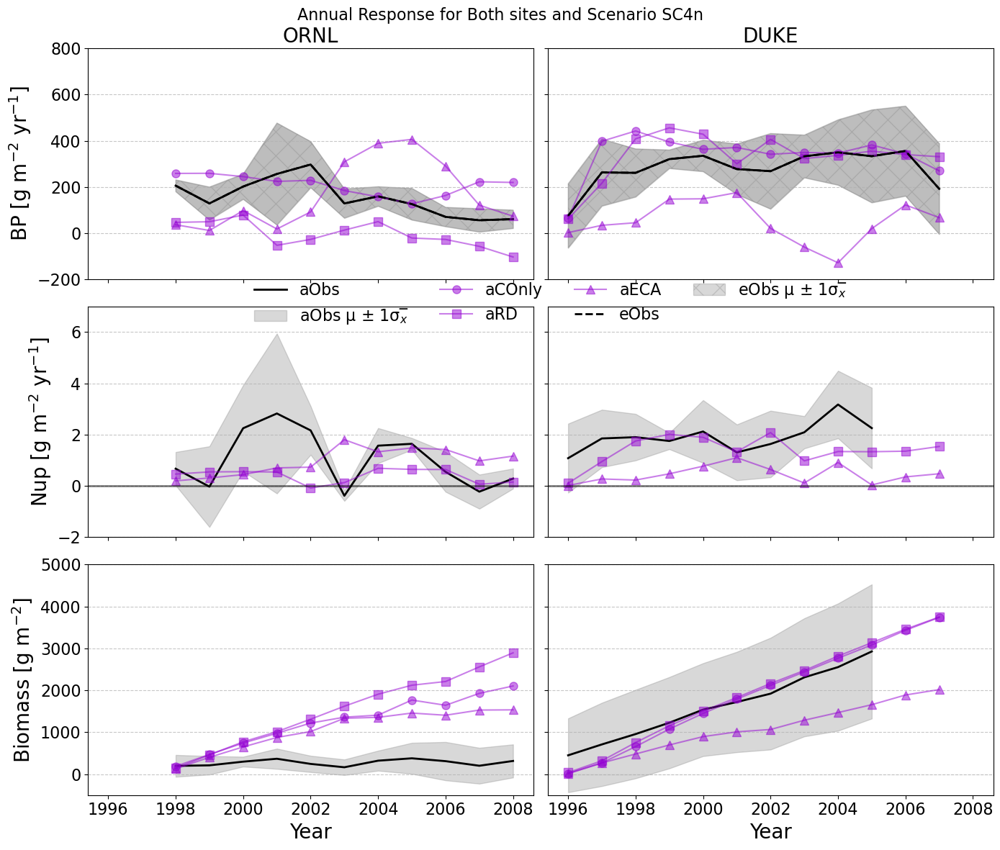

In [81]:
# Create figure with subplots
fig, ax = plt.subplots(3, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "NPP"
var_model = "NPP_Growth"
var_label_text = "BP"

ylim_response = (-200,800)
ornl = PlotData_A [f'{site}'][f'{var_obs}']

p_loc = (0,0)
ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_R[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['Resp'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')

ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_response)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (0,1)
# Check if Duke has data
duke =  PlotData_R [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['Resp'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color='black', lw=2, linestyle = '--')
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"eObs μ ± 1σ$_x̅$",hatch='x')

ax[p_loc].set_ylim(ylim_response)
# --------------------------------------------------------------------------

# ========== ORNL PLOT (Middle LEFT) ==========
site = "ORNL"
var_obs = "NUP"
var_model = "NUP_model"
var_label_text = "Nup"
ylim_response = (-2,7)

p_loc = (1,0)

ornl = PlotData_R [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_R[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['Resp'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_response)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (1,1)
# Check if Duke has data
duke =  PlotData_R [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_R[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['Resp'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].set_ylim(ylim_response)
# --------------------------------------------------------------------------
# ========== ORNL PLOT (Lower LEFT) ==========

site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC_plus_MORT"
var_label_text = "Biomass"
ylim_response = (-500,5000)

p_loc = (2,0)

ornl = PlotData_R [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_R[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['Resp'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_response)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (2,1)
# Check if Duke has data
duke =  PlotData_R [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_R[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['Resp'],
                 marker=model_markers.get(model_type, 'x'),
                 linestyle='-',
                 markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].set_ylim(ylim_response)
# --------------------------------------------------------------------------

for i in range (3):
    for j in range(2):
        ax[i,j].grid(True, axis='y', linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        #ax[1,j].set_ylim(ylim_response)
        ax[2,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[0,0].get_legend_handles_labels()
# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())
# Place a single, figure-level legend at the top
fig.legend(
    handles, labels,
    loc='upper center',
    bbox_to_anchor=(0.55, .68),  # Centered above both axes
    ncol=4,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend
plt.axhline(y=0, color="k", lw=2, alpha=0.02)

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual Response for Both sites and Scenario SC4n\n",
    fontsize=16,
)

plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_4.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_4.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

# Text description of the figure
description = """
Comment from AW:
- Fig 4 can just be the response plots from most of your existing figures

Description for Fig_4; response under SC4n scenario:
- Top pannel: NPP Alloc
- Middle: Nup
- Bottom: AGB+Mort

Questions for Fig 4:
- Is the color scheme okay?
- Do i include SD scenario as well?
"""

# Save the description as a text file at the same location
with open(f"{path_save_results}/RevisedAWplots/Fig_4_description.txt", "w") as file:
    file.write(description)


## R1. Revised AW Fig 5

Fig 5 can be your current fig 4 L2FR to start digging more into the nutrient model (we may want to add more figures as we get into the analysis — e.g. to truly compare RD vs ECA I think we'd want to plot a PDF of predictions based ont he paramter posterior)

[Take me to L2FR plots](#lfr)

If the above link does not work, scroll up to 8.L2FR >> Combined

## R1. Revised AW Fig 6

Fig 6 can be your analysis of the response to d2bl (btw, we should come up with more easy to understand names for the parameters like this and just have the model name in a table somewhere). I like that analysis you've done btw, should have said that in my email yesterday.

/Users/ud4/Documents/FACEMDS/Figures_Paper/LAIvsD2BL.xlsx

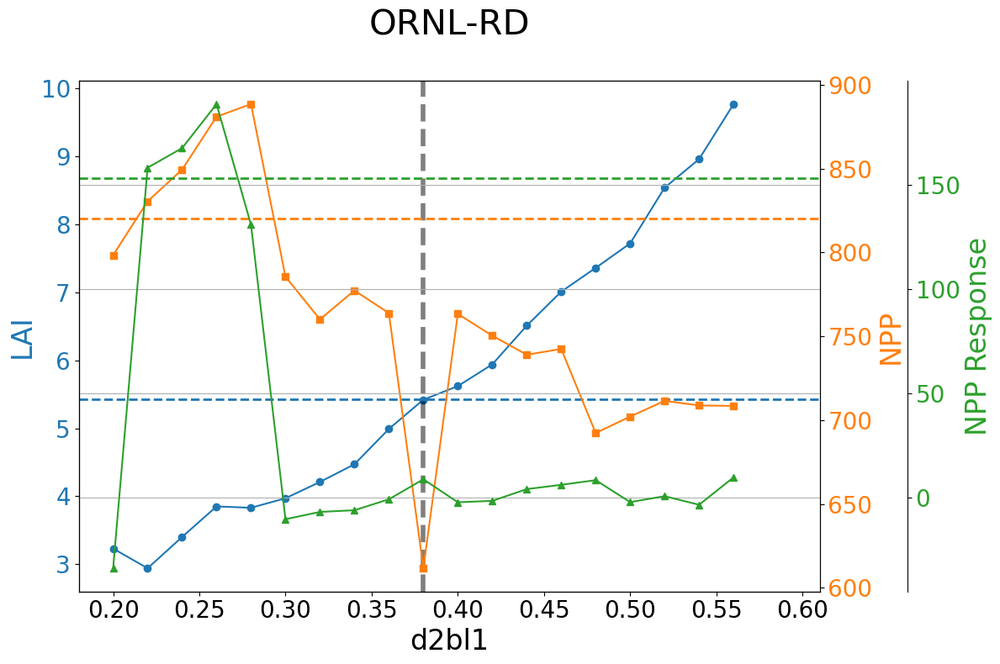

In [82]:
# Data
d2bl1 = [0.2, 0.22, 0.24, 0.26, 0.28, 0.3, 0.32, 0.34, 0.36, 0.38, 0.4, 0.42, 0.44, 0.46, 0.48, 0.5, 0.52, 0.54, 0.56]
LAI_Model = [3.23, 2.94, 3.4, 3.85, 3.83, 3.97, 4.21, 4.47, 4.99, 5.42, 5.62, 5.94, 6.51, 7.01, 7.36, 7.72, 8.54, 8.96, 9.77]
NPP_Model = [798.42, 830.52, 849.39, 880.96, 888.50, 785.56, 760.13, 777.34, 763.86, 611.7, 763.39, 750.39, 739.06, 742.44, 692.35, 702.16, 711.53, 708.8, 708.5]
ResponseNPPModel = [-33.91, 158.08, 167.47, 188.59, 130.74, -10.4, -6.89, -6.09, -0.85, 8.74, -2.27, -1.6, 4.03, 6.1, 8.32, -2.2, 0.64, -3.47, 9.68]

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 8))  # Increase figure size

# Plot LAI_Model on y-axis
ax1.set_xlabel('d2bl1', fontsize=24)
ax1.set_ylabel('LAI', color='tab:blue', fontsize=24)
ax1.plot(d2bl1, LAI_Model, marker='o', color='tab:blue', label='LAI')
ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=20)
ax1.tick_params(axis='x', labelsize=20)

# Create a second y-axis for NPP_Model
ax2 = ax1.twinx()  
ax2.set_ylabel('NPP', color='tab:orange', fontsize=24)
ax2.plot(d2bl1, NPP_Model, marker='s', color='tab:orange', label='NPP')
ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=20)

# Create a third y-axis for ResponseNPPModel
ax3 = ax1.twinx()  
ax3.spines['right'].set_position(('outward', 75))  # Move the third y-axis outward
ax3.set_ylabel('NPP Response', color='tab:green', fontsize=24)
ax3.plot(d2bl1, ResponseNPPModel, marker='^', color='tab:green', label='Response NPP')
ax3.tick_params(axis='y', labelcolor='tab:green', labelsize=20)

# Add horizontal dashed lines
ax1.axhline(y=5.43, color='tab:blue', linestyle='--', linewidth=2)  # LAI
ax2.axhline(y=820, color='tab:orange', linestyle='--', linewidth=2)   # NPP
ax3.axhline(y=153, color='tab:green', linestyle='--', linewidth=2)   # ResponseNPPModel

# Add vertical line
ax1.axvline(x=0.38, color='k', linestyle='--', linewidth=4, alpha = 0.5)  # Vertical line at x = 0.42
ax1.set_xlim(0.18,0.61)
# Title and layout adjustments
title_name="ORNL-RD"
ax1.set_title(f'{title_name}\n', fontsize=fsize_labels*1.5)
fig.tight_layout()  # Adjust the layout to prevent overlapping
plt.grid()

plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_6_{title_name}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_6_{title_name}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
# Show the plot
#plt.legend(fontsize=20)  # Set legend font size
plt.show()

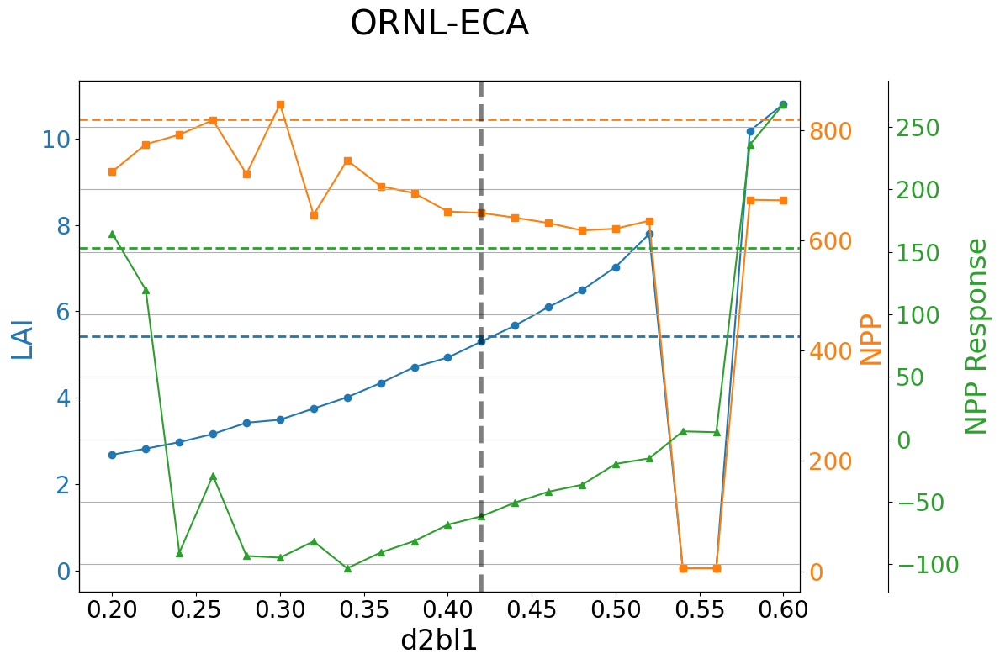

In [83]:
# Data
d2bl1 = [
    0.2, 0.22, 0.24, 0.26, 0.28, 0.3, 0.32, 0.34, 0.36, 0.38,
    0.4, 0.42, 0.44, 0.46, 0.48, 0.5, 0.52, 0.54, 0.56, 0.58, 0.6
]
LAI_Model = [
    2.68, 2.82, 2.97, 3.16, 3.42, 3.49, 3.75, 4.01, 4.34, 4.71,
    4.93, 5.3, 5.67, 6.1, 6.49, 7.03, 7.79, 0.05, 0.05, 10.18, 10.8
]
NPP_Model = [
    724.64, 774.37, 791.73, 818.17, 720.58, 847.3, 646.39, 745.41, 698.27, 685.82,
    652.46, 649.77, 641.36, 631.57, 618.08, 621.32, 635.71, 5.82, 5.38, 673.72, 672.68
]
ResponseNPPModel = [
    164.86, 119.7, -90.69, -28.93, -93.34, -94.68, -81.65, -103.2, -90.57, -81.39,
    -68.29, -61.57, -50.62, -41.91, -36.35, -19.67, -15.22, 6.4, 5.71, 235.79, 268.41
]

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 8))  # Increase figure size

# Plot LAI_Model on y-axis
ax1.set_xlabel('d2bl1', fontsize=24)
ax1.set_ylabel('LAI', color='tab:blue', fontsize=24)
ax1.plot(d2bl1, LAI_Model, marker='o', color='tab:blue', label='LAI')
ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=20)
ax1.tick_params(axis='x', labelsize=20)

# Create a second y-axis for NPP_Model
ax2 = ax1.twinx()  
ax2.set_ylabel('NPP', color='tab:orange', fontsize=24)
ax2.plot(d2bl1, NPP_Model, marker='s', color='tab:orange', label='NPP')
ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=20)

# Create a third y-axis for ResponseNPPModel
ax3 = ax1.twinx()  
ax3.spines['right'].set_position(('outward', 75))  # Move the third y-axis outward
ax3.set_ylabel('NPP Response', color='tab:green', fontsize=24)
ax3.plot(d2bl1, ResponseNPPModel, marker='^', color='tab:green', label='Response NPP')
ax3.tick_params(axis='y', labelcolor='tab:green', labelsize=20)

# Add horizontal dashed lines
ax1.axhline(y=5.43, color='tab:blue', linestyle='--', linewidth=2)  # LAI
ax2.axhline(y=820, color='tab:orange', linestyle='--', linewidth=2)   # NPP
ax3.axhline(y=153, color='tab:green', linestyle='--', linewidth=2)   # ResponseNPPModel

# Add vertical line
plt.axvline(x=0.42, color='k', linestyle='--', linewidth=4, alpha = 0.5)  # Vertical line at x = 0.42
ax1.set_xlim(0.18,0.61)

# Title and layout adjustments
# Title and layout adjustments
title_name="ORNL-ECA"
ax1.set_title(f'{title_name}\n', fontsize=fsize_labels*1.5)
fig.tight_layout()  # Adjust the layout to prevent overlapping
plt.grid()

plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_6_{title_name}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_6_{title_name}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
# Show the plot
#plt.legend(fontsize=20)  # Set legend font size
plt.show()

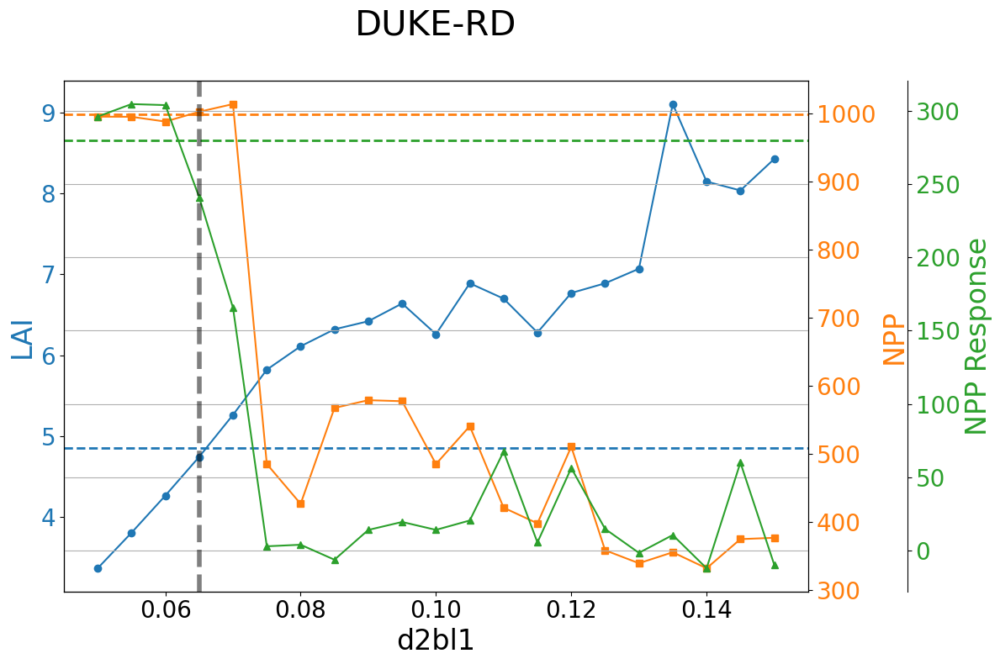

In [84]:
# Data
d2bl1 = [
    0.05, 0.055, 0.06, 0.065, 0.07, 0.075, 0.08, 0.085, 0.09, 0.095,
    0.1, 0.105, 0.11, 0.115, 0.12, 0.125, 0.13, 0.135, 0.14, 0.145, 0.15
]
LAI_Model = [
    3.36, 3.8, 4.26, 4.74, 5.26, 5.82, 6.11, 6.32, 6.42, 6.64,
    6.26, 6.89, 6.7, 6.28, 6.77, 6.89, 7.07, 9.11, 8.15, 8.04, 8.43
]
NPP_Model = [
    995.06, 994.87, 987.87, 1002.23, 1013.56, 485.11, 426.58, 567.4, 578.78, 577.29,
    484.99, 540.67, 420.97, 397.91, 510.5, 358.44, 339.37, 355.47, 331.98, 374.77, 376.74
]
ResponseNPPModel = [
    296.25, 304.8, 304.09, 241.19, 165.7, 2.73, 3.79, -6.44, 13.9, 19.35,
    13.94, 20.36, 67.44, 5.33, 56.19, 14.6, -1.76, 10.43, -12.29, 59.92, -9.85
]

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 8))  # Increase figure size

# Plot LAI_Model on y-axis
ax1.set_xlabel('d2bl1', fontsize=24)
ax1.set_ylabel('LAI', color='tab:blue', fontsize=24)
ax1.plot(d2bl1, LAI_Model, marker='o', color='tab:blue', label='LAI')
ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=20)
ax1.tick_params(axis='x', labelsize=20)

# Create a second y-axis for NPP_Model
ax2 = ax1.twinx()  
ax2.set_ylabel('NPP', color='tab:orange', fontsize=24)
ax2.plot(d2bl1, NPP_Model, marker='s', color='tab:orange', label='NPP')
ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=20)

# Create a third y-axis for ResponseNPPModel
ax3 = ax1.twinx()  
ax3.spines['right'].set_position(('outward', 85))  # Move the third y-axis outward
ax3.set_ylabel('NPP Response', color='tab:green', fontsize=24)
ax3.plot(d2bl1, ResponseNPPModel, marker='^', color='tab:green', label='Response NPP')
ax3.tick_params(axis='y', labelcolor='tab:green', labelsize=20)

# Add horizontal dashed lines
ax1.axhline(y=4.85, color='tab:blue', linestyle='--', linewidth=2)  # LAI
ax2.axhline(y=998, color='tab:orange', linestyle='--', linewidth=2)   # NPP
ax3.axhline(y=280, color='tab:green', linestyle='--', linewidth=2)   # ResponseNPPModel

# Add vertical line
plt.axvline(x=0.065, color='k', linestyle='--', linewidth=4, alpha = 0.5)  # Vertical line at x = 0.42
ax1.set_xlim(0.045,0.155)
# Title and layout adjustments
title_name="DUKE-RD"
ax1.set_title(f'{title_name}\n', fontsize=fsize_labels*1.5)
fig.tight_layout()  # Adjust the layout to prevent overlapping
plt.grid()

plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_6_{title_name}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_6_{title_name}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
# Show the plot
#plt.legend(fontsize=20)  # Set legend font size
plt.show()

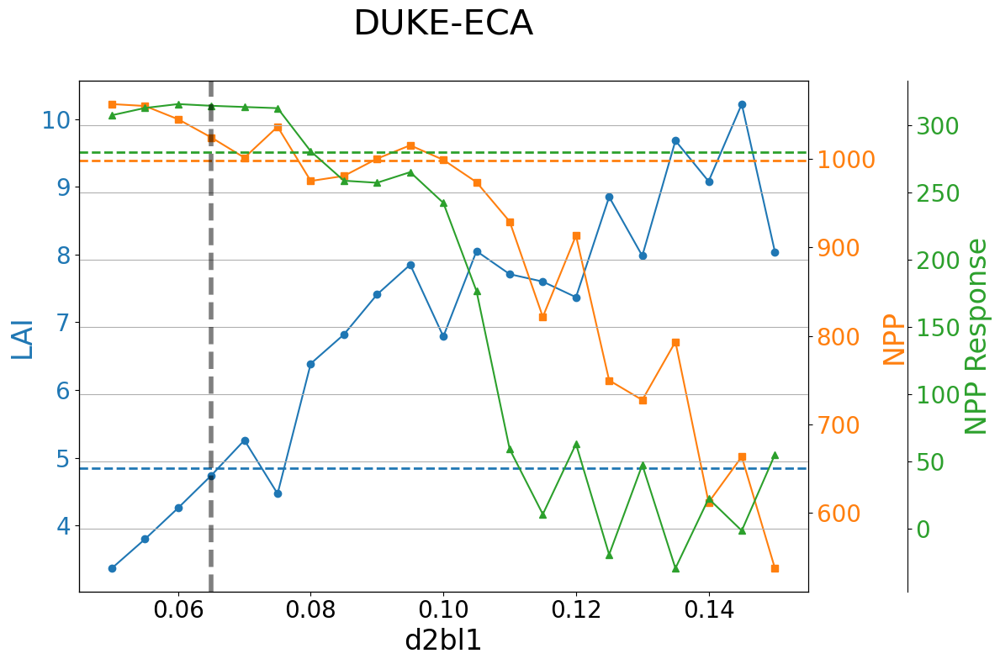

In [85]:
# Data
d2bl1 = [
    0.05, 0.055, 0.06, 0.065, 0.07, 0.075, 0.08, 0.085, 0.09, 0.095,
    0.1, 0.105, 0.11, 0.115, 0.12, 0.125, 0.13, 0.135, 0.14, 0.145, 0.15
]
LAI_Model = [
    3.37, 3.8, 4.26, 4.74, 5.26, 4.47, 6.39, 6.82, 7.41, 7.85,
    6.79, 8.05, 7.71, 7.6, 7.37, 8.85, 7.98, 9.68, 9.08, 10.22, 8.04
]
NPP_Model = [
    1062.33, 1060.18, 1045.16, 1024.53, 1001.62, 1036.69, 975.28, 980.97, 1000.52, 1015.64,
    999.21, 973.91, 929.36, 821.45, 913.45, 749.62, 727.36, 793.33, 611.5, 663.19, 536.9
]
ResponseNPPModel = [
    307.55, 312.97, 315.87, 314.6, 313.7, 312.83, 280.74, 258.87, 257.33, 265.24,
    242.35, 176.72, 59.15, 10.73, 63.06, -19.25, 47.45, -29.45, 22.35, -1.47, 55.13
]

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 8))  # Increase figure size

# Plot LAI_Model on y-axis
ax1.set_xlabel('d2bl1', fontsize=24)
ax1.set_ylabel('LAI', color='tab:blue', fontsize=24)
ax1.plot(d2bl1, LAI_Model, marker='o', color='tab:blue', label='LAI')
ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=20)
ax1.tick_params(axis='x', labelsize=20)

# Create a second y-axis for NPP_Model
ax2 = ax1.twinx()  
ax2.set_ylabel('NPP', color='tab:orange', fontsize=24)
ax2.plot(d2bl1, NPP_Model, marker='s', color='tab:orange', label='NPP')
ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=20)

# Create a third y-axis for ResponseNPPModel
ax3 = ax1.twinx()  
ax3.spines['right'].set_position(('outward', 85))  # Move the third y-axis outward
ax3.set_ylabel('NPP Response', color='tab:green', fontsize=24)
ax3.plot(d2bl1, ResponseNPPModel, marker='^', color='tab:green', label='Response NPP')
ax3.tick_params(axis='y', labelcolor='tab:green', labelsize=20)

# Add horizontal dashed lines
ax1.axhline(y=4.85, color='tab:blue', linestyle='--', linewidth=2)  # LAI
ax2.axhline(y=998, color='tab:orange', linestyle='--', linewidth=2)   # NPP
ax3.axhline(y=280, color='tab:green', linestyle='--', linewidth=2)   # ResponseNPPModel

# Add vertical line
plt.axvline(x=0.065, color='k', linestyle='--', linewidth=4, alpha = 0.5)  # Vertical line at x = 0.42
ax1.set_xlim(0.045,0.155)
# Title and layout adjustments
title_name="DUKE-ECA"
ax1.set_title(f'{title_name}\n', fontsize=fsize_labels*1.5)
fig.tight_layout()  # Adjust the layout to prevent overlapping
plt.grid()

plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_6_{title_name}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_6_{title_name}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
# Show the plot
#plt.legend(fontsize=20)  # Set legend font size
plt.show()

### Fig 6 to one plot

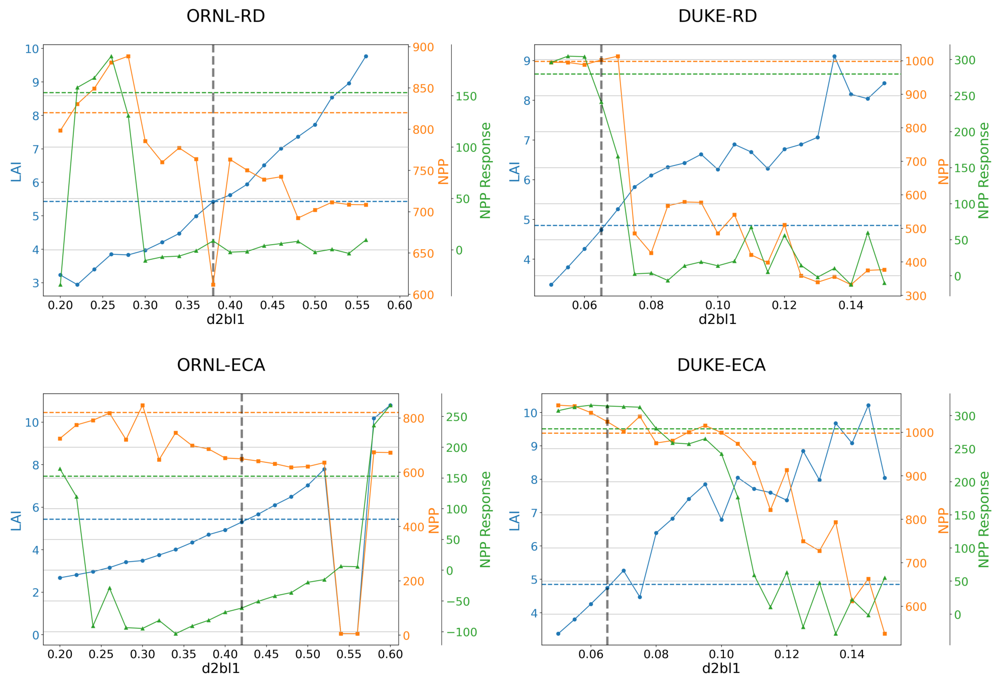

In [86]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 2, figsize=(20, 20))  # 2x2 grid

titles = ["ORNL-RD",  "DUKE-RD", "ORNL-ECA", "DUKE-ECA"]

for ax, title in zip(axes.flat, titles):
    img = mpimg.imread(f"{path_save_results}/RevisedAWplots/Fig_6_{title}.png")
    ax.imshow(img)
    ax.axis('off')          # Hide axes
    #ax.set_title(title)

# Adjust spacing to reduce vertical white space
#fig.subplots_adjust(wspace=0.005, hspace=0.0001)  # Lower wspace means less 
plt.tight_layout(pad=1.0, h_pad=-25, w_pad=1)  # Lower h_pad for less 

plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_6.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/Fig_6.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
plt.show()

## Revision Round 2

These are looking like a much more progressive set of figures to tell a story through the ms. Once you have these in the document and described following my previous suggestions we should be getting into good shape. 

Please try to find a colour scheme that works. It's tricky because we have a lot going on in the figures. We might have to play with it a bit until we settle on something that works. Try this out if you can't think of an alternative: blue for aCO2 and red for aCO2 (both solid lines) with faded colours for their uncertainty polygons (see my 2019 paper). Then for the model runs you could try a darker blue and red for a and e CO2, with different line types for Conly, RD, and ECA. Lose the triangles etc for the points). Ideally we'd have one pair of colours for Conly and another pair for CNP with different line types maybe for RD and ECA. Like I saud, tricky but will be important to make this easy for the reader. 

You can tidy the plots by making BP and Biomass Kg C indstead of g.

Legend can go anywhere, probably ORNL biomass. You can simplify the legend, no need for the uncertainty on there.       


## Colors:
https://davidmathlogic.com/colorblind/#%23332288-%23117733-%2344AA99-%2388CCEE-%23DDCC77-%23CC6677-%23AA4499-%23882255

5 unique colors:
https://davidmathlogic.com/colorblind/#%23648FFF-%23785EF0-%23DC267F-%23FE6100-%23FFB000

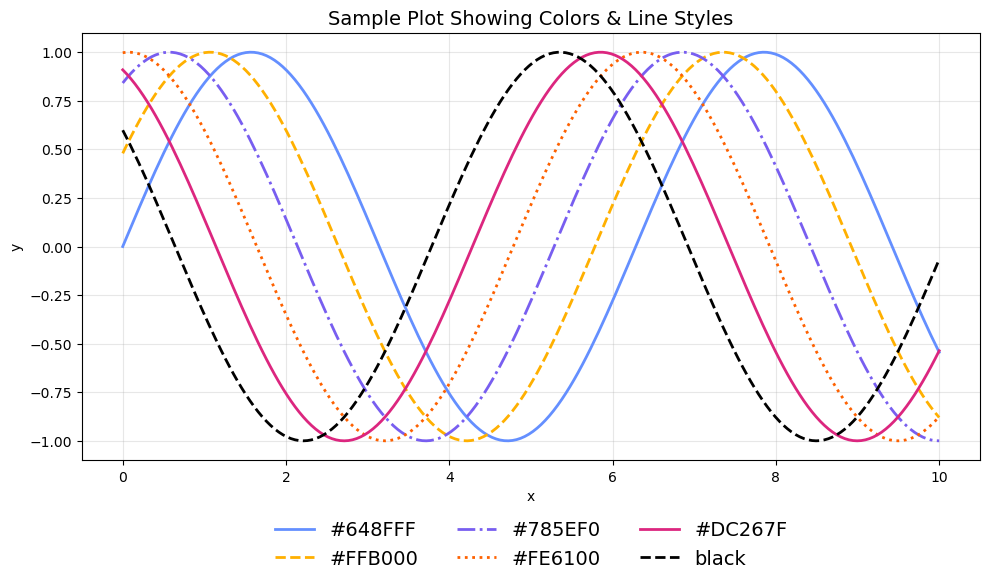

In [87]:


# --- Color and line style lists ---
cb_list = ['#648FFF', '#FFB000', '#785EF0', '#FE6100', '#DC267F', 'black']
ls_list = ['-', '--', '-.', ':']

# --- Sample x values ---
x = np.linspace(0, 10, 200)

plt.figure(figsize=(10, 6))

# --- Plot each combination ---
for i, color in enumerate(cb_list):
    y = np.sin(x + i * 0.5)  # offset each line so they don't overlap
    ls = ls_list[i % len(ls_list)]  # cycle through line styles if fewer than colors
    plt.plot(x, y, color=color, linestyle=ls, label=f"{color}", lw=2)

# --- Legend with color codes ---
plt.legend(ncol=3, frameon=False, loc="upper center", bbox_to_anchor=(0.5, -0.1), fontsize=14)
plt.title("Sample Plot Showing Colors & Line Styles", fontsize=14)
plt.xlabel("x")
plt.ylabel("y")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [88]:
# order [Obs-aCO2, Obs-eCO2, Model-aCO2, Model-eCO2, Response]
cb_list= ['#648FFF','#FFB000','#785EF0','#FE6100','#DC267F']
ls_list= ['-','--','-.',':']


## Color selection

| Model | Exp | Color | LineStyle|Remarks|
| :--- | :--: | ---: |---: |---: |
|OBS | aCO2 | CB 0 | LS 0 |
|OBS | aCO2 UQ | CB 0 | LS 0 | Faded Ploy|
|OBS | eCO2 | CB 1 | LS 0 |
|OBS | eCO2 UQ | CB 1 | LS 0 | Faded Ploy|
|Conly | aCO2 | CB 2 | LS 1 |
|RD | aCO2 | CB 2 | LS 2 |
|ECA | aCO2 | CB 2 | LS 3 |
|Conly | eCO2 | CB 3 | LS 1 |
|RD | eCO2 | CB 3 | LS 2 |
|ECA | eCO2 | CB 3 | LS 3 |
|Obs | Response | black | LS 0 |
|Obs | Response UQ| black | LS 0 | Faded Ploy|
|Conly | Response | CB 4 | LS 1 |
|RD | Response | CB 4 | LS 2 |
|ECA | Response | CB 4 | LS 3 |

## R2. Revised AW Fig 1

In [89]:
#case_colors = {'AMB': '#1f77b4', 'ELE': '#ff7f0e', 'Resp':'#9400D3'}  # Blue for AMB, Orange for ELE
#model_markers = {'COnly': 'o', 'RD': 's', 'ECA': '^'}  # Circle, Square, Triangle

cb_list= ['#648FFF','#FFB000','#785EF0','#FE6100','#DC267F']
ls_list= ['-','--','-.',':']

case_colors = {'AMB': f'{cb_list[2]}', 'ELE': f'{cb_list[3]}', 'Resp':f'{cb_list[4]}'}
model_markers = {'COnly': 'o', 'RD': 's', 'ECA': '^'}
model_ls = {'COnly': '--', 'RD': '-.', 'ECA': ':'}

fsize_legend = 20
fsize_ticks = 16
fsize_labels = 20

#combined plot
tmp_markersize=8
tmp_alpha = 1

#Biomass g >>> Kg
unit_convertion_biomass = 1000


ncol_legend = 4

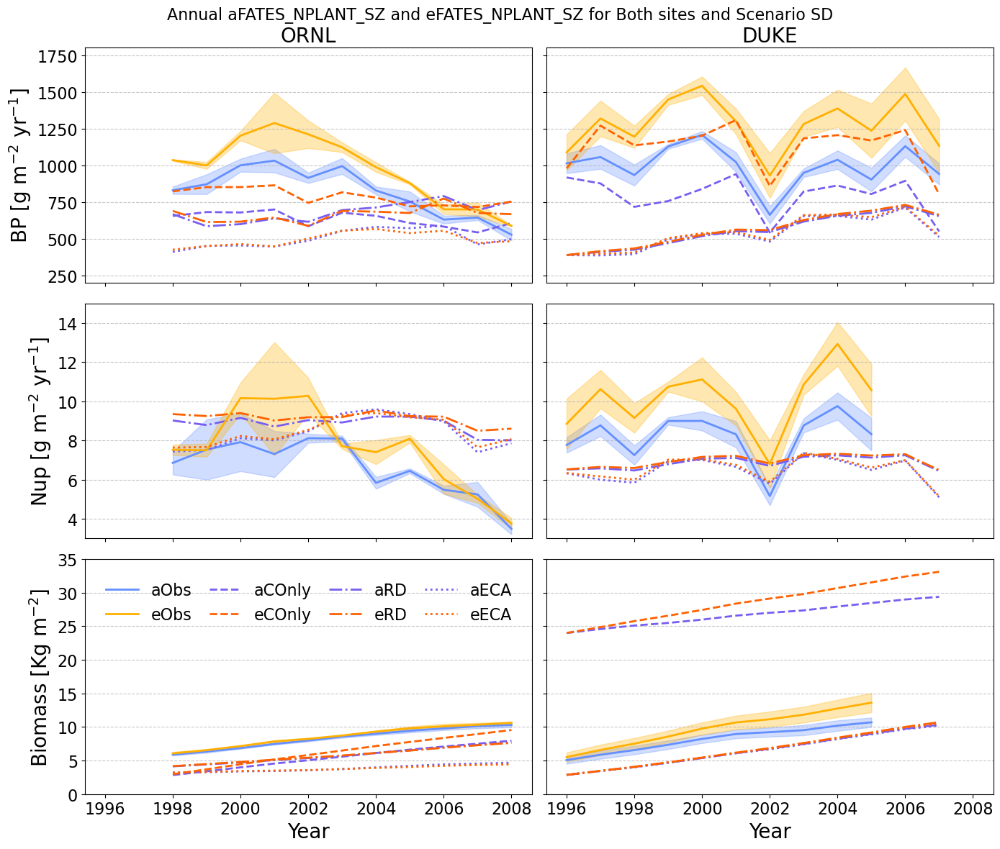

In [90]:

# Create figure with subplots
fig, ax = plt.subplots(3, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "NPP"
var_model = "NPP_Growth"
var_label_text = "BP"

ylim_variable = (200,1800)
ornl = PlotData_A [f'{site}'][f'{var_obs}']

p_loc = (0,0)
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (0,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")

ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

# ========== ORNL PLOT (Middle LEFT) ==========
site = "ORNL"
var_obs = "NUP"
var_model = "NUP_model"
var_label_text = "Nup"
ylim_variable = (3,15)

p_loc = (1,0)

ornl = PlotData_A [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')
ax[p_loc].set_ylim(ylim_variable)
# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (1,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

# ========== ORNL PLOT (Lower LEFT) ==========
site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC_plus_MORT"
var_label_text = "Biomass"
ylim_variable = (0,35000)
ylim_variable = (0,35)

p_loc = (2,0)

ornl = PlotData_A [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')
ax[p_loc].set_ylim(ylim_variable)
# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[Kg m$^{-2}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Lower RIGHT) ==========
site = "DUKE"
p_loc = (2,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SC4n_'
    if model_key.startswith('SC4n_'):
        #print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    #print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

for i in range (3):
    for j in range(2):
        ax[i,j].grid(True, axis='y', linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        #ax[1,j].set_ylim(ylim_response)
        ax[2,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    

ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[2,1].get_legend_handles_labels()

# Filter out FillBetweenPolyCollection objects
filtered = [(h, l) for h, l in zip(handles, labels) if not isinstance(h, mcoll.PolyCollection)]

# Unzip into separate lists again
handles, labels = zip(*filtered)


# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())

ordered_labels = [labels[0],labels[4],labels[1],labels[5],labels[2],labels[6],labels[3],labels[7]]
ordered_handles = [handles[0],handles[4],handles[1],handles[5],handles[2],handles[6],handles[3],handles[7]]


# Place a single, figure-level legend at the top
fig.legend(
    #handles, labels,
    ordered_handles, ordered_labels,
    loc='upper center',
    bbox_to_anchor=(0.31, .33),  # Centered above both axes
    ncol=ncol_legend,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks,
    columnspacing=1.1 #default=2
)


plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend
plt.axhline(y=0, color="k", lw=2, alpha=0.02)

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual a{var} and e{var} for Both sites and Scenario SD\n",
    fontsize=16,
)

plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_1.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_1.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

# Text description of the figure
description = """
Comment from AW:
- figure 1 should just be non-calibrated results. 
- To pack everything in on one set of panels you could show ambient and elevated on the same panel, 
- then have one panel per site, per variable. So you could show 
- BP, Nup, Biomass at Duke and ORNL in a 2 x 3 set of panels. 

Description for Fig_1:
- Top pannel: NPP Alloc
- Middle: Nup
- Bottom: AGB+Mort

Questions for Fig 1:
- Biomass: should I ignore Conly Duke for the plotting purpose?

Update:
Revision Round 2 based on AW feedback
"""

# Save the description as a text file at the same location
with open(f"{path_save_results}/RevisedAWplots/R2_Fig_1_description.txt", "w") as file:
    file.write(description)


## R2. Revised AW Fig 2
Fig 2 can be the same but with calibrated parameters

skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA


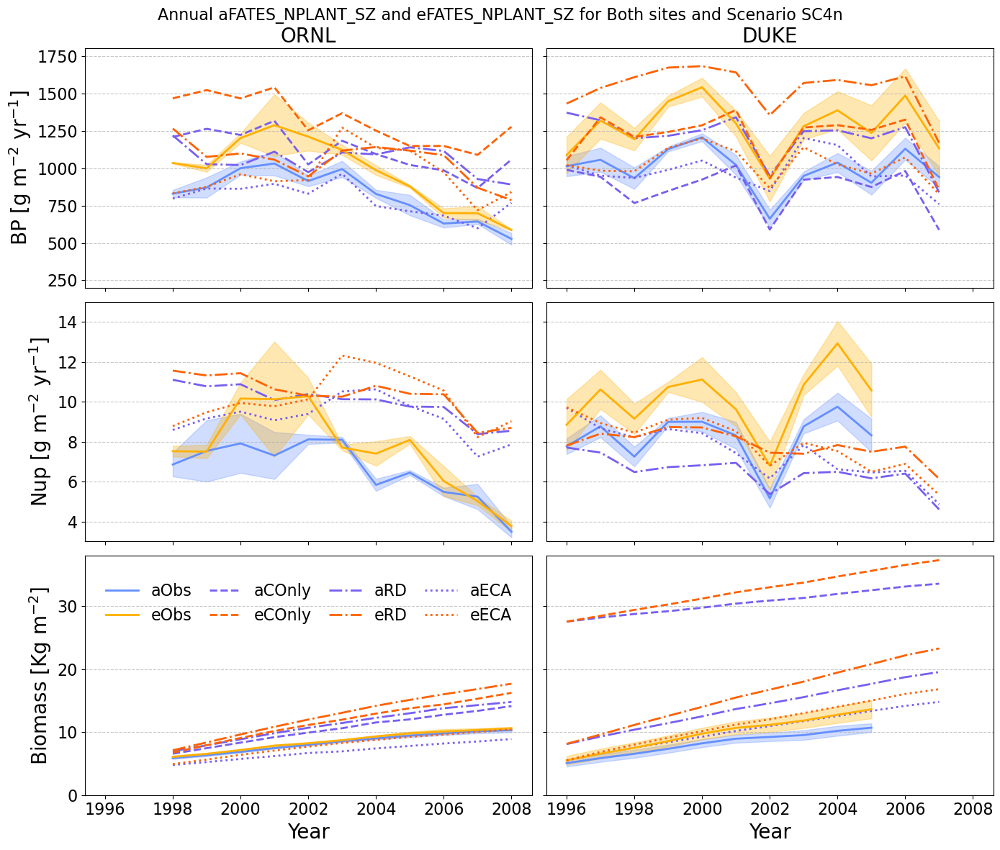

In [91]:

# Create figure with subplots
fig, ax = plt.subplots(3, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "NPP"
var_model = "NPP_Growth"
var_label_text = "BP"

ylim_variable = (200,1800)
ornl = PlotData_A [f'{site}'][f'{var_obs}']

p_loc = (0,0)
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (0,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                     color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")

ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

# ========== ORNL PLOT (Middle LEFT) ==========
site = "ORNL"
var_obs = "NUP"
var_model = "NUP_model"
var_label_text = "Nup"
ylim_variable = (3,15)

p_loc = (1,0)

ornl = PlotData_A [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')
ax[p_loc].set_ylim(ylim_variable)
# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (1,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

# ========== ORNL PLOT (Lower LEFT) ==========

site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC_plus_MORT"
var_label_text = "Biomass"
ylim_variable = (0,38)

p_loc = (2,0)

ornl = PlotData_A [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')
ax[p_loc].set_ylim(ylim_variable)
# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[Kg m$^{-2}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Lower RIGHT) ==========
site = "DUKE"
p_loc = (2,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='eObs',color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

for i in range (3):
    for j in range(2):
        ax[i,j].grid(True, axis='y', linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        #ax[1,j].set_ylim(ylim_response)
        ax[2,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    

ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[2,1].get_legend_handles_labels()

# Filter out FillBetweenPolyCollection objects
filtered = [(h, l) for h, l in zip(handles, labels) if not isinstance(h, mcoll.PolyCollection)]

# Unzip into separate lists again
handles, labels = zip(*filtered)


# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())

ordered_labels = [labels[0],labels[4],labels[1],labels[5],labels[2],labels[6],labels[3],labels[7]]
ordered_handles = [handles[0],handles[4],handles[1],handles[5],handles[2],handles[6],handles[3],handles[7]]


# Place a single, figure-level legend at the top
fig.legend(
    #handles, labels,
    ordered_handles, ordered_labels,
    loc='upper center',
    bbox_to_anchor=(0.31, .33),  # Centered above both axes
    ncol=ncol_legend,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks,
    columnspacing=1.1 #default=2
)


plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend
plt.axhline(y=0, color="k", lw=2, alpha=0.02)

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual a{var} and e{var} for Both sites and Scenario SC4n\n",
    fontsize=16,
)

plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_2.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_2.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

# Text description of the figure
description = """
Comment from AW:
- Fig 2 can be the same but with calibrated parameters 

Description for Fig_2:
- Top pannel: NPP Alloc
- Middle: Nup
- Bottom: AGB+Mort

Questions for Fig 2:
- Biomass: should I ignore Conly Duke for the plotting purpose?
"""

# Save the description as a text file at the same location
with open(f"{path_save_results}/RevisedAWplots/R2_Fig_2_description.txt", "w") as file:
    file.write(description)


## R2. Revised AW Fig 3
Fig 3 can be the posterior param PDFs

### NOTE: No revision needed I think

## R2. Revised AW Fig 4

Fig 4 can just be the response plots from most of your existing figures

skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_RD
skip SD_ECA
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA
skip SD_COnly
skip SD_RD
skip SD_ECA
keep SC4n_COnly
keep SC4n_RD
keep SC4n_ECA


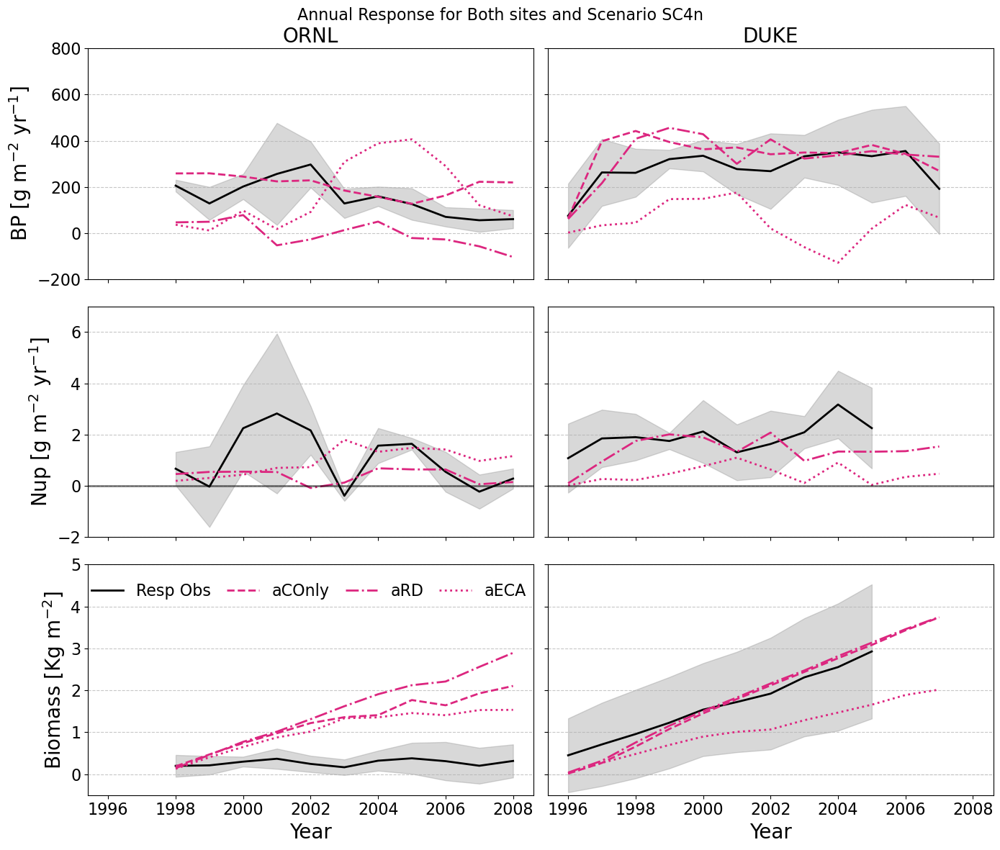

In [92]:
# Create figure with subplots
fig, ax = plt.subplots(3, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "NPP"
var_model = "NPP_Growth"
var_label_text = "BP"

ylim_response = (-200,800)
ornl = PlotData_A [f'{site}'][f'{var_obs}']

p_loc = (0,0)
ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='Resp Obs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Resp Obs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_R[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['Resp'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"{model_key.split('_')[-1]}")

ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_response)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (0,1)
# Check if Duke has data
duke =  PlotData_R [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='Resp Obs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Resp Obs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['Resp'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"{model_key.split('_')[-1]}")

ax[p_loc].set_ylim(ylim_response)
# --------------------------------------------------------------------------

# ========== ORNL PLOT (Middle LEFT) ==========
site = "ORNL"
var_obs = "NUP"
var_model = "NUP_model"
var_label_text = "Nup"
ylim_response = (-2,7)

p_loc = (1,0)

ornl = PlotData_R [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='Resp Obs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Resp Obs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_R[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['Resp'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_response)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (1,1)
# Check if Duke has data
duke =  PlotData_R [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs'], 
            label='Resp Obs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color='gray', alpha=0.3, label=f"Resp Obs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_R[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['Resp'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"{model_key.split('_')[-1]}")

ax[p_loc].set_ylim(ylim_response)
# --------------------------------------------------------------------------
# ========== ORNL PLOT (Lower LEFT) ==========

site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC_plus_MORT"
var_label_text = "Biomass"
ylim_response = (-.5,5.000)

p_loc = (2,0)

ornl = PlotData_R [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='Resp Obs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color='gray', alpha=0.3, label=f"Resp Obs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_R[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['Resp'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[Kg m$^{-2}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_response)

# ========== DUKE PLOT (Lower RIGHT) ==========
site = "DUKE"
p_loc = (2,1)
# Check if Duke has data
duke =  PlotData_R [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
             PlotData_R [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='Resp Obs', color='black', lw=2)
ax[p_loc].fill_between(PlotData_R [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_R [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color='gray', alpha=0.3, label=f"Resp Obs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_R[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_R[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['Resp'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].set_ylim(ylim_response)
# --------------------------------------------------------------------------

for i in range (3):
    for j in range(2):
        ax[i,j].grid(True, axis='y', linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        #ax[1,j].set_ylim(ylim_response)
        ax[2,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[2,1].get_legend_handles_labels()

# Filter out FillBetweenPolyCollection objects
filtered = [(h, l) for h, l in zip(handles, labels) if not isinstance(h, mcoll.PolyCollection)]

# Unzip into separate lists again
handles, labels = zip(*filtered)


# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())

ordered_labels = labels
ordered_handles = handles


# Place a single, figure-level legend at the top
fig.legend(
    #handles, labels,
    ordered_handles, ordered_labels,
    loc='upper center',
    bbox_to_anchor=(0.31, .33),  # Centered above both axes
    ncol=ncol_legend,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks,
    columnspacing=1. #default=2
)

plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend
plt.axhline(y=0, color="k", lw=2, alpha=0.02)

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual Response for Both sites and Scenario SC4n\n",
    fontsize=16,
)

plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_4.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_4.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

# Text description of the figure
description = """
Comment from AW:
- Fig 4 can just be the response plots from most of your existing figures

Description for Fig_4; response under SC4n scenario:
- Top pannel: NPP Alloc
- Middle: Nup
- Bottom: AGB+Mort

Questions for Fig 4:
- Is the color scheme okay?
- Do i include SD scenario as well?
"""

# Save the description as a text file at the same location
with open(f"{path_save_results}/RevisedAWplots/R2_Fig_4_description.txt", "w") as file:
    file.write(description)


In [93]:
f"{path_save_results}/RevisedAWplots/R2_Fig_4.png"

'/Users/ud4/Documents/FACEMDS/Figures_Paper/RevisedAWplots/R2_Fig_4.png'

## R2. Revised AW Fig 5

Fig 5 can be your current fig 4 L2FR to start digging more into the nutrient model (we may want to add more figures as we get into the analysis — e.g. to truly compare RD vs ECA I think we'd want to plot a PDF of predictions based ont he paramter posterior)

[Take me to L2FR plots](#lfr)

If the above link does not work, scroll up to 8.L2FR >> Combined

## R2. Revised AW Fig 6

Fig 6 can be your analysis of the response to d2bl (btw, we should come up with more easy to understand names for the parameters like this and just have the model name in a table somewhere). I like that analysis you've done btw, should have said that in my email yesterday.

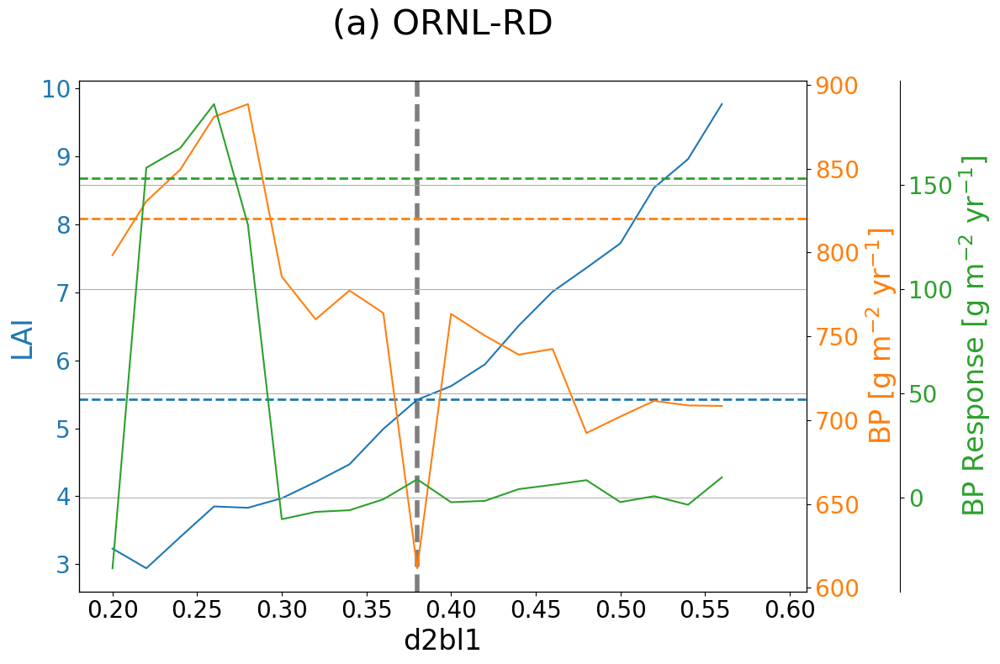

In [102]:
# Data
d2bl1 = [0.2, 0.22, 0.24, 0.26, 0.28, 0.3, 0.32, 0.34, 0.36, 0.38, 0.4, 0.42, 0.44, 0.46, 0.48, 0.5, 0.52, 0.54, 0.56]
LAI_Model = [3.23, 2.94, 3.4, 3.85, 3.83, 3.97, 4.21, 4.47, 4.99, 5.42, 5.62, 5.94, 6.51, 7.01, 7.36, 7.72, 8.54, 8.96, 9.77]
NPP_Model = [798.42, 830.52, 849.39, 880.96, 888.50, 785.56, 760.13, 777.34, 763.86, 611.7, 763.39, 750.39, 739.06, 742.44, 692.35, 702.16, 711.53, 708.8, 708.5]
ResponseNPPModel = [-33.91, 158.08, 167.47, 188.59, 130.74, -10.4, -6.89, -6.09, -0.85, 8.74, -2.27, -1.6, 4.03, 6.1, 8.32, -2.2, 0.64, -3.47, 9.68]

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 8))  # Increase figure size

# Plot LAI_Model on y-axis
ax1.set_xlabel('d2bl1', fontsize=24)
ax1.set_ylabel('LAI', color='tab:blue', fontsize=24)
ax1.plot(d2bl1, LAI_Model, marker='', color='tab:blue', label='LAI')
ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=20)
ax1.tick_params(axis='x', labelsize=20)

# Create a second y-axis for NPP_Model
ax2 = ax1.twinx()  
ax2.set_ylabel('BP '+r"[g m$^{-2}$ yr$^{-1}$]", color='tab:orange', fontsize=24)
ax2.plot(d2bl1, NPP_Model, marker='', color='tab:orange', label='NPP')
ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=20)

# Create a third y-axis for ResponseNPPModel
ax3 = ax1.twinx()  
ax3.spines['right'].set_position(('outward', 80))  # Move the third y-axis outward
ax3.set_ylabel('BP Response '+r"[g m$^{-2}$ yr$^{-1}$]", color='tab:green', fontsize=24)
ax3.plot(d2bl1, ResponseNPPModel, marker='', color='tab:green', label='Response NPP')
ax3.tick_params(axis='y', labelcolor='tab:green', labelsize=20)

# Add horizontal dashed lines
ax1.axhline(y=5.43, color='tab:blue', linestyle='--', linewidth=2)  # LAI
ax2.axhline(y=820, color='tab:orange', linestyle='--', linewidth=2)   # NPP
ax3.axhline(y=153, color='tab:green', linestyle='--', linewidth=2)   # ResponseNPPModel

# Add vertical line
ax1.axvline(x=0.38, color='k', linestyle='--', linewidth=4, alpha = 0.5)  # Vertical line at x = 0.42
ax1.set_xlim(0.18,0.61)
# Title and layout adjustments
title_name="(a) ORNL-RD"
ax1.set_title(f'{title_name}\n', fontsize=fsize_labels*1.5)
fig.tight_layout()  # Adjust the layout to prevent overlapping
plt.grid()

plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_6_{title_name}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_6_{title_name}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
# Show the plot
#plt.legend(fontsize=20)  # Set legend font size
plt.show()

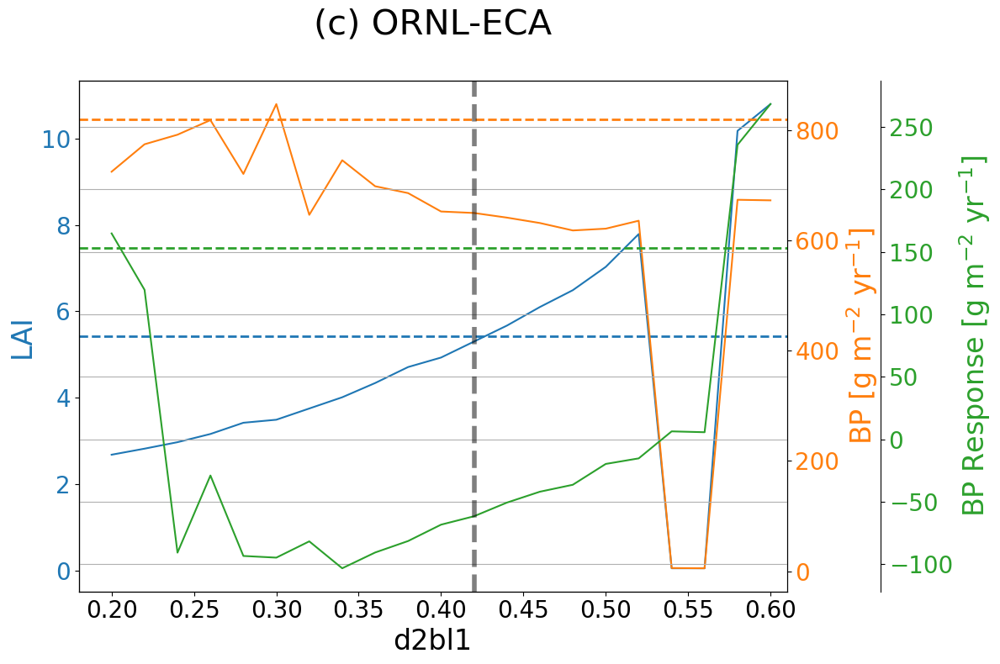

In [109]:
# Data
d2bl1 = [
    0.2, 0.22, 0.24, 0.26, 0.28, 0.3, 0.32, 0.34, 0.36, 0.38,
    0.4, 0.42, 0.44, 0.46, 0.48, 0.5, 0.52, 0.54, 0.56, 0.58, 0.6
]
LAI_Model = [
    2.68, 2.82, 2.97, 3.16, 3.42, 3.49, 3.75, 4.01, 4.34, 4.71,
    4.93, 5.3, 5.67, 6.1, 6.49, 7.03, 7.79, 0.05, 0.05, 10.18, 10.8
]

NPP_Model = [
    724.64, 774.37, 791.73, 818.17, 720.58, 847.3, 646.39, 745.41, 698.27, 685.82,
    652.46, 649.77, 641.36, 631.57, 618.08, 621.32, 635.71, 5.82, 5.38, 673.72, 672.68
]

ResponseNPPModel = [
    164.86, 119.7, -90.69, -28.93, -93.34, -94.68, -81.65, -103.2, -90.57, -81.39,
    -68.29, -61.57, -50.62, -41.91, -36.35, -19.67, -15.22, 6.4, 5.71, 235.79, 268.41
]


# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 8))  # Increase figure size

# Plot LAI_Model on y-axis
ax1.set_xlabel('d2bl1', fontsize=24)
ax1.set_ylabel('LAI', color='tab:blue', fontsize=24)
ax1.plot(d2bl1, LAI_Model, marker='', color='tab:blue', label='LAI')
ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=20)
ax1.tick_params(axis='x', labelsize=20)

# Create a second y-axis for NPP_Model
ax2 = ax1.twinx()  
ax2.set_ylabel('BP '+r"[g m$^{-2}$ yr$^{-1}$]", color='tab:orange', fontsize=24)
ax2.plot(d2bl1, NPP_Model, marker='', color='tab:orange', label='NPP')
ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=20)

# Create a third y-axis for ResponseNPPModel
ax3 = ax1.twinx()  
ax3.spines['right'].set_position(('outward', 80))  # Move the third y-axis outward
ax3.set_ylabel('BP Response '+r"[g m$^{-2}$ yr$^{-1}$]", color='tab:green', fontsize=24)
ax3.plot(d2bl1, ResponseNPPModel, marker='', color='tab:green', label='Response NPP')
ax3.tick_params(axis='y', labelcolor='tab:green', labelsize=20)

# Add horizontal dashed lines
ax1.axhline(y=5.43, color='tab:blue', linestyle='--', linewidth=2)  # LAI
ax2.axhline(y=820, color='tab:orange', linestyle='--', linewidth=2)   # NPP
ax3.axhline(y=153, color='tab:green', linestyle='--', linewidth=2)   # ResponseNPPModel

# Add vertical line
plt.axvline(x=0.42, color='k', linestyle='--', linewidth=4, alpha = 0.5)  # Vertical line at x = 0.42
ax1.set_xlim(0.18,0.61)

# Title and layout adjustments
# Title and layout adjustments
title_name="(c) ORNL-ECA"
ax1.set_title(f'{title_name}\n', fontsize=fsize_labels*1.5)
fig.tight_layout()  # Adjust the layout to prevent overlapping
plt.grid()

plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_6_{title_name}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_6_{title_name}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
# Show the plot
#plt.legend(fontsize=20)  # Set legend font size
plt.show()

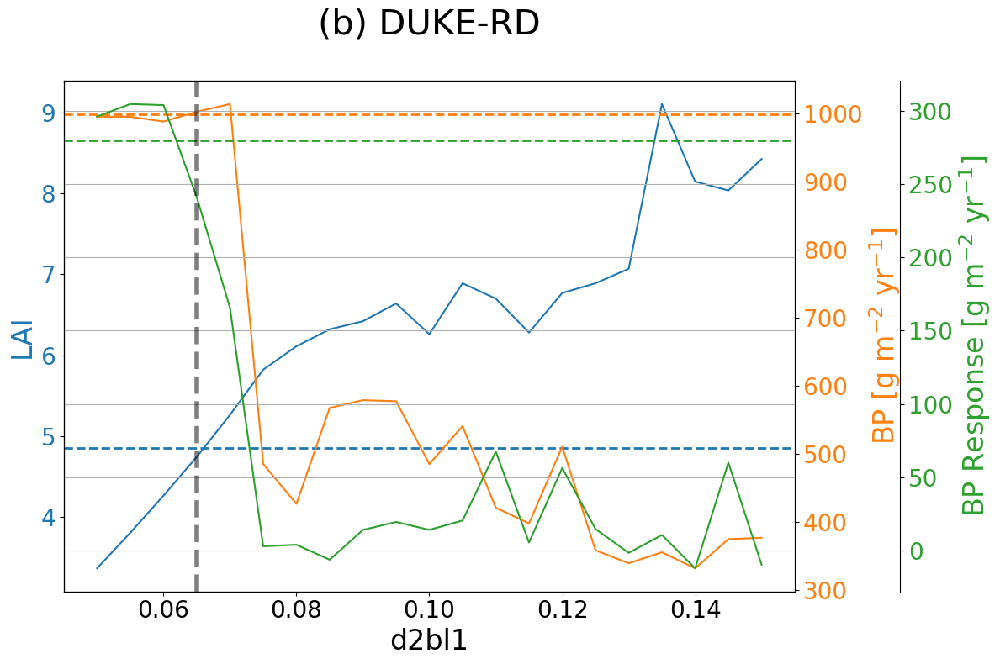

In [110]:
# Data
d2bl1 = [
    0.05, 0.055, 0.06, 0.065, 0.07, 0.075, 0.08, 0.085, 0.09, 0.095,
    0.1, 0.105, 0.11, 0.115, 0.12, 0.125, 0.13, 0.135, 0.14, 0.145, 0.15
]
LAI_Model = [
    3.36, 3.8, 4.26, 4.74, 5.26, 5.82, 6.11, 6.32, 6.42, 6.64,
    6.26, 6.89, 6.7, 6.28, 6.77, 6.89, 7.07, 9.11, 8.15, 8.04, 8.43
]
NPP_Model = [
    995.06, 994.87, 987.87, 1002.23, 1013.56, 485.11, 426.58, 567.4, 578.78, 577.29,
    484.99, 540.67, 420.97, 397.91, 510.5, 358.44, 339.37, 355.47, 331.98, 374.77, 376.74
]
ResponseNPPModel = [
    296.25, 304.8, 304.09, 241.19, 165.7, 2.73, 3.79, -6.44, 13.9, 19.35,
    13.94, 20.36, 67.44, 5.33, 56.19, 14.6, -1.76, 10.43, -12.29, 59.92, -9.85
]

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 8))  # Increase figure size

# Plot LAI_Model on y-axis
ax1.set_xlabel('d2bl1', fontsize=24)
ax1.set_ylabel('LAI', color='tab:blue', fontsize=24)
ax1.plot(d2bl1, LAI_Model, marker='', color='tab:blue', label='LAI')
ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=20)
ax1.tick_params(axis='x', labelsize=20)

# Create a second y-axis for NPP_Model
ax2 = ax1.twinx()  
ax2.set_ylabel('BP '+r"[g m$^{-2}$ yr$^{-1}$]" , color='tab:orange', fontsize=24)
ax2.plot(d2bl1, NPP_Model, marker='', color='tab:orange', label='NPP')
ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=20)

# Create a third y-axis for ResponseNPPModel
ax3 = ax1.twinx()  
ax3.spines['right'].set_position(('outward', 90))  # Move the third y-axis outward
ax3.set_ylabel('BP Response '+r"[g m$^{-2}$ yr$^{-1}$]", color='tab:green', fontsize=24)
ax3.plot(d2bl1, ResponseNPPModel, marker='', color='tab:green', label='Response NPP')
ax3.tick_params(axis='y', labelcolor='tab:green', labelsize=20)

# Add horizontal dashed lines
ax1.axhline(y=4.85, color='tab:blue', linestyle='--', linewidth=2)  # LAI
ax2.axhline(y=998, color='tab:orange', linestyle='--', linewidth=2)   # NPP
ax3.axhline(y=280, color='tab:green', linestyle='--', linewidth=2)   # ResponseNPPModel

# Add vertical line
plt.axvline(x=0.065, color='k', linestyle='--', linewidth=4, alpha = 0.5)  # Vertical line at x = 0.42
ax1.set_xlim(0.045,0.155)
# Title and layout adjustments
title_name="(b) DUKE-RD"
ax1.set_title(f'{title_name}\n', fontsize=fsize_labels*1.5)
fig.tight_layout()  # Adjust the layout to prevent overlapping
plt.grid()

plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_6_{title_name}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_6_{title_name}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
# Show the plot
#plt.legend(fontsize=20)  # Set legend font size
plt.show()

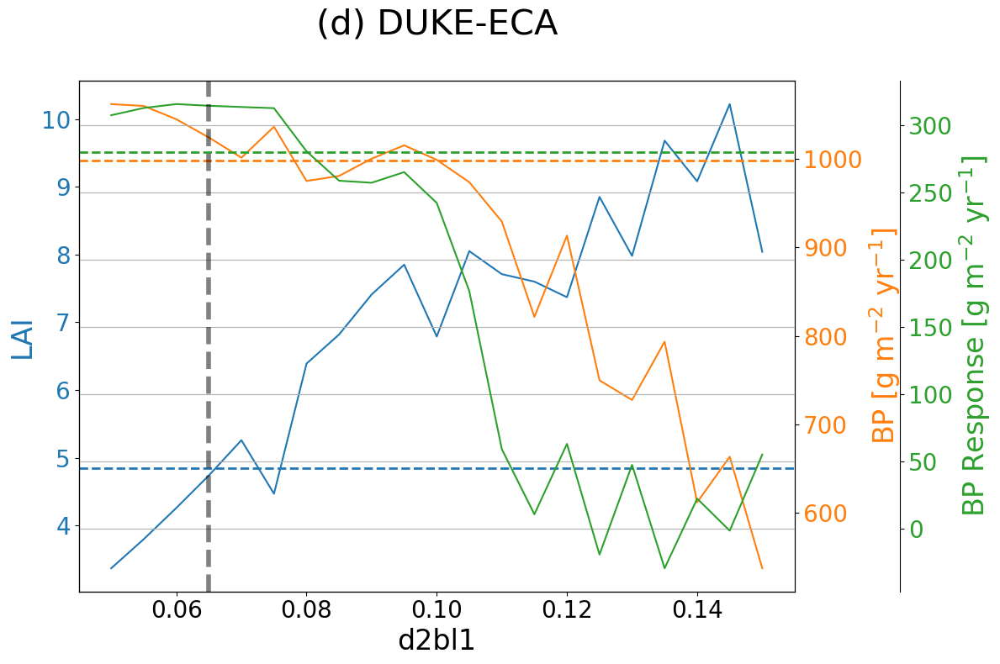

In [111]:
# Data
d2bl1 = [
    0.05, 0.055, 0.06, 0.065, 0.07, 0.075, 0.08, 0.085, 0.09, 0.095,
    0.1, 0.105, 0.11, 0.115, 0.12, 0.125, 0.13, 0.135, 0.14, 0.145, 0.15
]
LAI_Model = [
    3.37, 3.8, 4.26, 4.74, 5.26, 4.47, 6.39, 6.82, 7.41, 7.85,
    6.79, 8.05, 7.71, 7.6, 7.37, 8.85, 7.98, 9.68, 9.08, 10.22, 8.04
]
NPP_Model = [
    1062.33, 1060.18, 1045.16, 1024.53, 1001.62, 1036.69, 975.28, 980.97, 1000.52, 1015.64,
    999.21, 973.91, 929.36, 821.45, 913.45, 749.62, 727.36, 793.33, 611.5, 663.19, 536.9
]
ResponseNPPModel = [
    307.55, 312.97, 315.87, 314.6, 313.7, 312.83, 280.74, 258.87, 257.33, 265.24,
    242.35, 176.72, 59.15, 10.73, 63.06, -19.25, 47.45, -29.45, 22.35, -1.47, 55.13
]

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 8))  # Increase figure size

# Plot LAI_Model on y-axis
ax1.set_xlabel('d2bl1', fontsize=24)
ax1.set_ylabel('LAI', color='tab:blue', fontsize=24)
ax1.plot(d2bl1, LAI_Model, marker='', color='tab:blue', label='LAI')
ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=20)
ax1.tick_params(axis='x', labelsize=20)

# Create a second y-axis for NPP_Model
ax2 = ax1.twinx()  
ax2.set_ylabel('BP ' +r"[g m$^{-2}$ yr$^{-1}$]", color='tab:orange', fontsize=24)
ax2.plot(d2bl1, NPP_Model, marker='', color='tab:orange', label='NPP')
ax2.tick_params(axis='y', labelcolor='tab:orange', labelsize=20)

# Create a third y-axis for ResponseNPPModel
ax3 = ax1.twinx()  
ax3.spines['right'].set_position(('outward', 90))  # Move the third y-axis outward
ax3.set_ylabel('BP Response '+r"[g m$^{-2}$ yr$^{-1}$]", color='tab:green', fontsize=24)
ax3.plot(d2bl1, ResponseNPPModel, marker='', color='tab:green', label='Response NPP')
ax3.tick_params(axis='y', labelcolor='tab:green', labelsize=20)

# Add horizontal dashed lines
ax1.axhline(y=4.85, color='tab:blue', linestyle='--', linewidth=2)  # LAI
ax2.axhline(y=998, color='tab:orange', linestyle='--', linewidth=2)   # NPP
ax3.axhline(y=280, color='tab:green', linestyle='--', linewidth=2)   # ResponseNPPModel

# Add vertical line
plt.axvline(x=0.065, color='k', linestyle='--', linewidth=4, alpha = 0.5)  # Vertical line at x = 0.42
ax1.set_xlim(0.045,0.155)
# Title and layout adjustments
title_name="(d) DUKE-ECA"
ax1.set_title(f'{title_name}\n', fontsize=fsize_labels*1.5)
fig.tight_layout()  # Adjust the layout to prevent overlapping
plt.grid()

plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_6_{title_name}.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_6_{title_name}.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
# Show the plot
#plt.legend(fontsize=20)  # Set legend font size
plt.show()

### Fig 6 to one plot

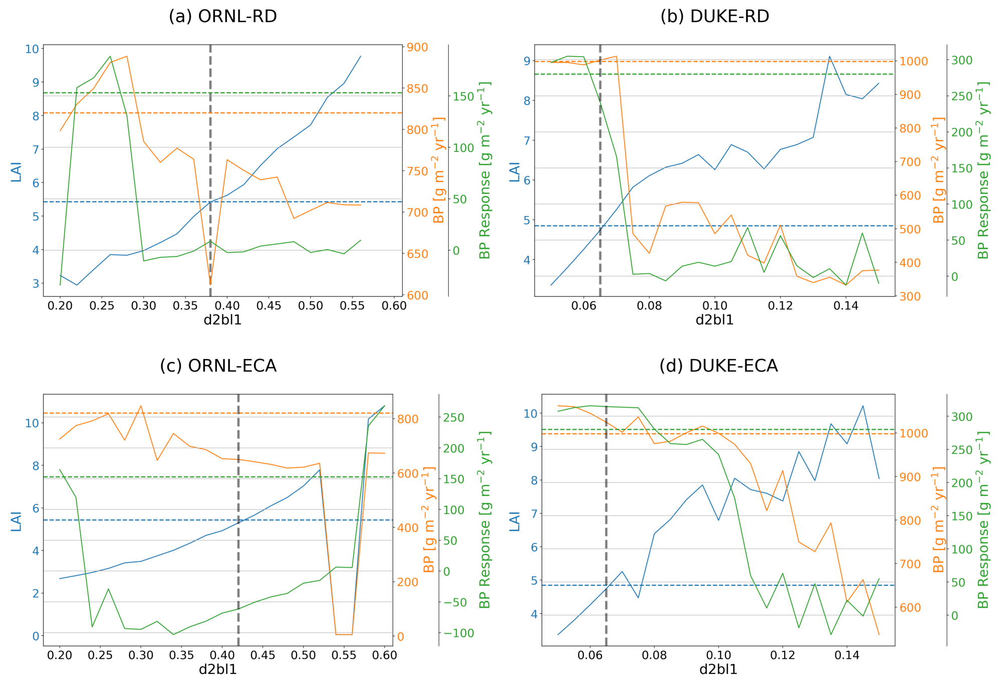

In [112]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig, axes = plt.subplots(2, 2, figsize=(20, 20))  # 2x2 grid

titles = ["(a) ORNL-RD",  "(b) DUKE-RD", "(c) ORNL-ECA", "(d) DUKE-ECA"]

for ax, title in zip(axes.flat, titles):
    img = mpimg.imread(f"{path_save_results}/RevisedAWplots/R2_Fig_6_{title}.png")
    ax.imshow(img)
    ax.axis('off')          # Hide axes
    #ax.set_title(title)

# Adjust spacing to reduce vertical white space
#fig.subplots_adjust(wspace=0.005, hspace=0.0001)  # Lower wspace means less 
plt.tight_layout(pad=1.0, h_pad=-25, w_pad=1)  # Lower h_pad for less 

plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_6.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_6.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)
plt.show()

## Fig 7

KeyError: 'FATES_VEGC'

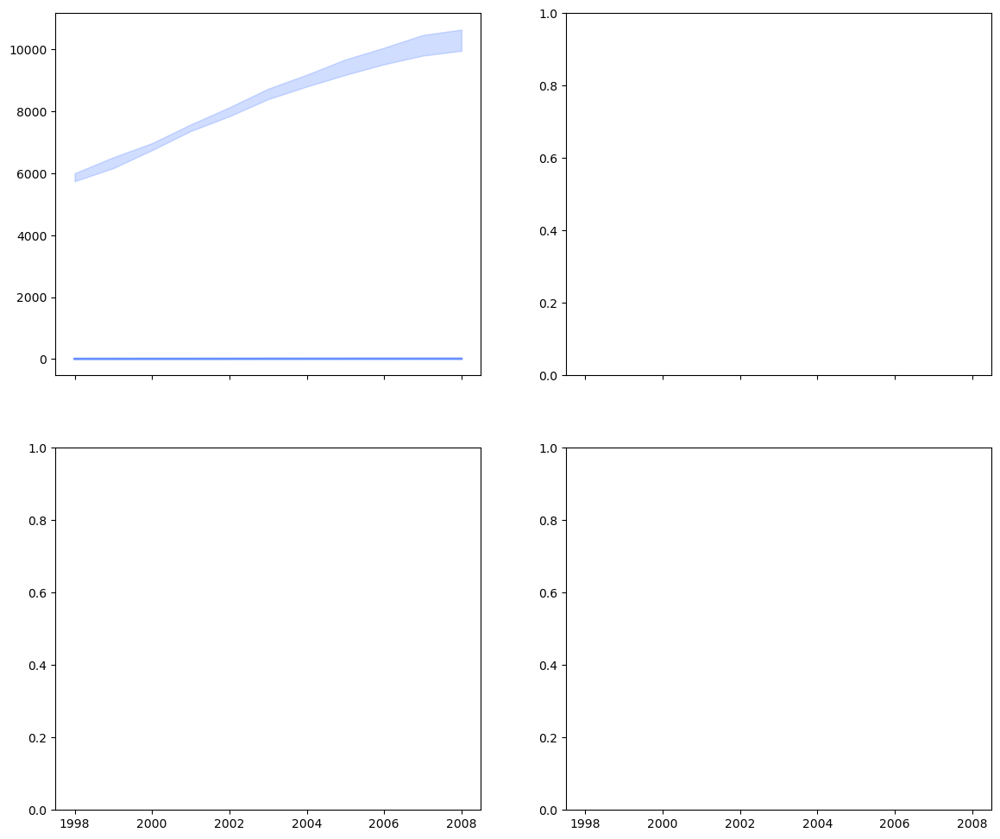

In [119]:

# Create figure with subplots
fig, ax = plt.subplots(2, 2, figsize=(14, 12),  sharex=True) #, sharey=True)

# ========== ORNL PLOT (Top LEFT) ==========
site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC"
var_label_text = "VegC"

ylim_variable = (0,40)
ornl = PlotData_A [f'{site}'][f'{var_obs}']

p_loc = (0,0)
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[g m$^{-2}$ yr$^{-1}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Top RIGHT) ==========
site = "DUKE"
p_loc = (0,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs'], 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs'], 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper'],
                     color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")

ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------


# ========== ORNL PLOT (Lower LEFT) ==========

site = "ORNL"
var_obs = "c_veg"
var_model = "FATES_VEGC_plus_MORT"
var_label_text = "Biomass"
ylim_variable = (0,38)

p_loc = (1,0)

ornl = PlotData_A [f'{site}'][f'{var_obs}']

ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='eObs', color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')
ax[p_loc].set_ylim(ylim_variable)
# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
    
ax[p_loc].set_ylabel(f"{var_label_text} "+ r"[Kg m$^{-2}$]", fontsize=fsize_labels)  
ax[p_loc].set_ylim(ylim_variable)

# ========== DUKE PLOT (Lower RIGHT) ==========
site = "DUKE"
p_loc = (1,1)
# Check if Duke has data
duke =  PlotData_A [f'{site}'][f'{var_obs}']
ax[p_loc].plot(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
             PlotData_A [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='aObs', color=cb_list[0], lw=2)
ax[p_loc].fill_between(PlotData_A [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_A [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[0], alpha=0.3, label=f"aObs μ ± 1σ$_x̅$")

# Iterate through the model keys
for model_key, values in PlotData_A[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_A[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['AMB'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"a{model_key.split('_')[-1]}")

ax[p_loc].plot(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
             PlotData_E [f'{site}'][f'{var_obs}']['Obs']/unit_convertion_biomass, 
            label='eObs',color=cb_list[1], lw=2, linestyle = ls_list[0])
ax[p_loc].fill_between(PlotData_E [f'{site}'][f'{var_obs}']['time'], 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_lower']/unit_convertion_biomass, 
                     PlotData_E [f'{site}'][f'{var_obs}']['npp_1sd_upper']/unit_convertion_biomass,
                    color=cb_list[1], alpha=0.3, label=f"eObs μ ± 1σ$_x̅$")#,hatch='x')

# Iterate through the model keys
for model_key, values in PlotData_E[f'{site}'][f'{var_model}'].items():
    # Skip plotting if the model_key starts with 'SD_'
    if model_key.startswith('SD_'):
        print ("skip", model_key)
        continue  # Skip this iteration

    # Determine family and model_type
    family = 'SD' if model_key.startswith('SD') else f'{list(case_abr.keys())[-1]}'
    model_type = model_key.split('_')[1]
    print ("keep", model_key)
    # Plot data for valid keys
    ax[p_loc].plot(PlotData_E[f'{site}'][f'{var_obs}']['time'], values/unit_convertion_biomass,
                 color=case_colors['ELE'],
                 #marker=model_markers.get(model_type, 'x'),
                 linestyle=model_ls.get(model_type, 'x'), lw=2,
                 #linestyle='-',
                 #markersize=tmp_markersize,
                 alpha=tmp_alpha,
                 label=f"e{model_key.split('_')[-1]}")
ax[p_loc].set_ylim(ylim_variable)
# --------------------------------------------------------------------------

for i in range (2):
    for j in range(2):
        ax[i,j].grid(True, axis='y', linestyle='--', alpha=0.7)
        ax[i,j].tick_params(axis='y', labelsize=fsize_ticks)
        ax[i,j].tick_params(axis='x', labelsize=fsize_ticks)
        ax[1,j].axhline(y=0, color="k", lw=2, alpha=0.2)
        #ax[1,j].set_ylim(ylim_response)
        ax[1,j].set_xlabel('Year', fontsize=fsize_labels)
        ax[i,1].set_yticklabels([]) # hiding y labels

        
    

ax[0,0].set_title('ORNL', fontsize=fsize_labels)
ax[0,1].set_title('DUKE', fontsize=fsize_labels)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle


handles, labels = ax[1,1].get_legend_handles_labels()

# Filter out FillBetweenPolyCollection objects
filtered = [(h, l) for h, l in zip(handles, labels) if not isinstance(h, mcoll.PolyCollection)]

# Unzip into separate lists again
handles, labels = zip(*filtered)


# Remove duplicates while preserving order (optional)
unique = dict(zip(labels, handles))
handles = list(unique.values())
labels = list(unique.keys())

ordered_labels = [labels[0],labels[4],labels[1],labels[5],labels[2],labels[6],labels[3],labels[7]]
ordered_handles = [handles[0],handles[4],handles[1],handles[5],handles[2],handles[6],handles[3],handles[7]]


# Place a single, figure-level legend at the top
fig.legend(
    #handles, labels,
    ordered_handles, ordered_labels,
    loc='upper center',
    bbox_to_anchor=(0.31, .33),  # Centered above both axes
    ncol=ncol_legend,                      # Adjust as needed
    frameon=False,
    fontsize=fsize_ticks,
    columnspacing=1.1 #default=2
)


plt.tight_layout(rect=[0, 0, 1, 0.97])  # Leave space for the legend
plt.axhline(y=0, color="k", lw=2, alpha=0.02)

#plt.ylim(ylim_response)
fig.suptitle(
    f"Annual a{var} and e{var} for Both sites and Scenario SC4n\n",
    fontsize=16,
)
'''
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_2.pdf",
    format="pdf",
    bbox_inches="tight",
)
plt.savefig(
     f"{path_save_results}/RevisedAWplots/R2_Fig_2.png",
    format="png",
    dpi=200,
    bbox_inches="tight",
)

# Text description of the figure
description = """
Comment from AW:
- Fig 2 can be the same but with calibrated parameters 

Description for Fig_2:
- Top pannel: NPP Alloc
- Middle: Nup
- Bottom: AGB+Mort

Questions for Fig 2:
- Biomass: should I ignore Conly Duke for the plotting purpose?
"""

# Save the description as a text file at the same location
with open(f"{path_save_results}/RevisedAWplots/R2_Fig_2_description.txt", "w") as file:
    file.write(description)
'''

### End rev

In [99]:
pwd

'/Users/ud4/repos/GitHub/FATESFACE/Jupyter_Notebooks/Paper1_Plots'

In [113]:
path_save_results

'/Users/ud4/Documents/FACEMDS/Figures_Paper'